In [1388]:
import pandas as pd
import numpy as np
import seaborn as sns

#for error metrics + graphs
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error
from statsmodels.tsa.seasonal import seasonal_decompose
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
import matplotlib.gridspec as gs
import datetime as dt
from datetime import datetime


#import for regression
from sklearn.svm import SVR
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from xgboost import XGBRegressor
from sklearn.linear_model import Ridge
import tensorflow as tf

#Preprocessing, Feature Selection and Cross Validation
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import cross_val_score, TimeSeriesSplit, KFold, train_test_split, GridSearchCV, RandomizedSearchCV


import optuna
from optuna.samplers import TPESampler
from sklearn.model_selection import cross_val_score, TimeSeriesSplit



Defining Funcitons

In [1389]:
def merge4regression(df, df1):
    """
    Concatenate two datasets for regression. This function merges two datasets,
    created from lists of households or other sources, based on their indices.

    Parameters:
    df : DataFrame
        First DataFrame to merge.
    df1 : DataFrame
        Second DataFrame to merge.

    Returns:
    DataFrame
        A DataFrame resulting from merging df and df1 on their indices.
    """
    df2 = pd.merge(df, df1, left_index=True, right_index=True)
    return df2

In [1413]:
def get_top_consumption_dates(dataframe, top_n=100, threshold_date='2013-03-01'):
    """
    Get the top consumption dates excluding weekends and dates before a threshold.
    
    Parameters:
    dataframe (pd.DataFrame): The input dataframe with datetime index and consumption data.
    top_n (int): The number of top dates to return. Default is 50.
    threshold_date (str): The threshold date in 'YYYY-MM-DD' format. Dates before this will be excluded.
    
    Returns:
    dict: A dictionary of the top consumption dates in 'YYYY-MM-DD' format.
    """
    # Convert threshold_date to a Timestamp
    threshold_date = pd.Timestamp(threshold_date)
    
    # Filter out weekends and dates before the threshold date
    filtered_data = dataframe[(dataframe.index.dayofweek < 5) & (dataframe.index >= threshold_date)]

    # Resample the data to daily frequency and calculate the mean values for each day, excluding weekends
    daily_consumption = filtered_data.resample('D').mean()
    
    # Sort the days by their average consumption in descending order
    daily_consumption_sorted = daily_consumption.sort_values(ascending=False)
    
    # Extract the top N dates
    top_dates = daily_consumption_sorted.head(top_n)
    
    # Create a dictionary with selected dates and their corresponding values
    selected_dates = {date.strftime('%Y-%m-%d'): value for date, value in top_dates.items()}
    
    return selected_dates


In [1414]:
def get_bottom_consumption_dates(dataframe, top_n=150, threshold_date='2012-08-01'):
    """
    Get the bottom consumption dates excluding weekends and dates before a threshold.
    
    Parameters:
    dataframe (pd.DataFrame): The input dataframe with datetime index and consumption data.
    top_n (int): The number of bottom dates to return. Default is 50.
    threshold_date (str): The threshold date in 'YYYY-MM-DD' format. Dates before this will be excluded.
    
    Returns:
    dict: A dictionary of the bottom consumption dates in 'YYYY-MM-DD' format and their corresponding values.
    """
    # Convert threshold_date to a Timestamp
    threshold_date = pd.Timestamp(threshold_date)
    
    # Filter out weekends and dates before the threshold date
    filtered_data = dataframe[(dataframe.index.dayofweek < 5) & (dataframe.index >= threshold_date)]

    # Resample the data to daily frequency and sum the values for each day, excluding weekends
    daily_consumption = filtered_data.resample('D').mean()
    
    # Sort the days by their total consumption in ascending order
    daily_consumption_sorted = daily_consumption.sort_values(ascending=True)
    
    # Extract the bottom N dates
    bottom_dates = daily_consumption_sorted.head(top_n)
    
    # Create a dictionary with selected dates and their corresponding values
    selected_dates = {date.strftime('%Y-%m-%d'): value for date, value in bottom_dates.items()}
    
    return selected_dates


In [1417]:
#preprocessing

def apply_cyclic_encoding_and_lag_features_trial(df, column_to_lag, index_name=None, lag_periods=[48, 96]):
    """
    Apply cyclic encoding to a DataFrame based on its datetime index and add lagged features.

    Parameters:
    - df (pd.DataFrame): DataFrame with a datetime index.
    - column_to_lag (str): The column name from which to compute lagged features.
    - index_name (str, optional): Name of the datetime index column if the index is reset.
    - lag_periods (list of int): List of periods for which to create lagged features.

    Returns:
    - pd.DataFrame: DataFrame with additional columns for cyclically encoded hours, days, months, and lagged features.
    """
    # Ensure the DataFrame has a datetime index
    if index_name is not None:
        df.set_index(index_name, inplace=True)

    # Calculate the hour + fraction of the hour
    df['hour_decimal'] = df.index.hour + df.index.minute / 60.0

    # Constants for the maximum value, considering the half-hour
    max_hour_decimal = 23.5

    # Applying cyclic encoding for the 'hour_decimal'
    df['sin_hour'] = np.sin(2 * np.pi * df['hour_decimal'] / max_hour_decimal)
    df['cos_hour'] = np.cos(2 * np.pi * df['hour_decimal'] / max_hour_decimal)

    # Weekday indicators with cyclical transform
    weekday_ind = df.index.weekday
    df['week_sin'] = np.sin(weekday_ind * (2. * np.pi / 7))
    df['week_cos'] = np.cos(weekday_ind * (2. * np.pi / 7))
    
    # Weekend indicator
    df['weekend'] = np.where(weekday_ind < 5, 0, 1)

    # Month indicators with cyclical transform
    month_ind = df.index.month
    df['month_sin'] = np.sin((month_ind - 1) * (2. * np.pi / 12))
    df['month_cos'] = np.cos((month_ind - 1) * (2. * np.pi / 12))

    # Adding lagged features based on specified periods
    for col in df.columns:
        for period in lag_periods:
         lag_column_name = f'{column_to_lag}_{period}h'
         df[lag_column_name] = df[column_to_lag].shift(periods=period)
    
    # Add the difference column
    df[f'{column_to_lag}_diff'] = df[column_to_lag].diff()
    
    # Add the previous week column
    df[f'{column_to_lag}_week'] = df[column_to_lag].shift(periods=24*7)

    print(df)

    return df

def preprocess_data( df, target_column, lag_periods=[48, 96], test_size=0.8):
    """
    Preprocesses the data by merging features, applying cyclic encoding and lag features, 
    and performing a train-test split without shuffling.

    Parameters:
    - features: DataFrame of features.
    - target_data: Series of the target variable.
    - lag_periods: List of periods to create lag features.
    - test_size: Proportion of the data to include in the test split.

    Returns:
    - X_train, X_test, y_train, y_test: Train-test split datasets.
    """
    
    # Apply cyclic encoding and lag features
    processed_data = apply_cyclic_encoding_and_lag_features_trial(df, target_column, index_name=None, lag_periods=lag_periods)
    
    # Drop rows with missing values
    processed_data = processed_data.dropna()

    # Split the data into features and target
    X = processed_data.drop(columns=['l1_PV', 'l1_noPV', 'l2_PV', 'l2_noPV', 'l3_PV', 'l3_noPV', 'm1_PV', 'm1_noPV', 'm2_PV', 'm2_noPV', 'h1_PV', 'h1_noPV', 'h2_PV', 'h2_noPV', 'h3_PV', 'h3_noPV', 'l4_PV', 'l4_noPV', 'l5_PV', 'l5_noPV', 'l6_PV', 'l6_noPV', 'm3_PV', 'm3_noPV', 'm4_PV', 'm4_noPV', 'm5_PV', 'm5_noPV', 'h4_PV', 'h4_noPV', 'h5_PV', 'h5_noPV', 'h6_PV', 'h6_noPV'], axis=1)
    y = processed_data[target_column]

    # Perform a train-test split without shuffling
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=test_size, shuffle=False)

    return X_train, X_test, y_train, y_test


In [1390]:
# test date 
selected_date_1 = pd.to_datetime('2013-06-20')

In [1391]:
selected_date_2 = pd.to_datetime('2013-06-24')


In [1392]:
selected_date_3 = pd.to_datetime('2013-05-22')

In [1393]:
df = pd.read_excel('CusFeat.xlsx')
df.set_index('datetime', inplace = True)


In [1724]:
# Drop processed columns
df = df.drop(columns = ['hour_decimal', 'sin_hour',
       'cos_hour', 'week_sin', 'week_cos', 'weekend', 'month_sin', 'month_cos',
       'l1_PV_48h', 'l1_PV_96h', 'l1_PV_diff', 'l1_PV_week'])
#KCUF.to_excel('CusFeat.xlx')

In [1730]:
big4 = big4.drop(columns=['l1_PV', 'l1_noPV',
       'l2_PV', 'l2_noPV', 'l3_PV', 'l3_noPV', 'm1_PV', 'm1_noPV', 'm2_PV',
       'm2_noPV', 'h1_PV', 'h1_noPV', 'h2_PV', 'h2_noPV', 'h3_PV', 'h3_noPV',
       'l4_PV', 'l4_noPV', 'l5_PV', 'l5_noPV', 'l6_PV', 'l6_noPV', 'm3_PV',
       'm3_noPV', 'm4_PV', 'm4_noPV', 'm5_PV', 'm5_noPV', 'h4_PV', 'h4_noPV',
       'h5_PV', 'h5_noPV', 'h6_PV', 'h6_noPV'])

In [1731]:
big4.describe()

,wind_speed10,wind_speed100,isday,sun_dur,direct_rad,diffuse_rad,direct_nor,direct_inst,diffuse_inst,nor_instant,RRP
count,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000
mean,10.604350,17.611353,0.507449,1449.641354,135.110109,60.351847,232.822296,134.486512,60.045471,229.173857,5.510251
std,5.568592,8.649344,0.489429,1675.933673,212.626756,83.692989,307.156502,213.436374,84.121616,308.221093,1.292897
min,0.000000,0.400000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5.928000
25%,6.400000,11.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.007000
50%,9.500000,16.900000,0.500000,0.000000,2.000000,9.500000,15.100000,0.000000,3.050000,0.000000,5.280000
75%,13.850000,23.100000,1.000000,3600.000000,214.000000,99.000000,456.550000,213.700000,99.900000,453.950000,5.605000
max,39.500000,57.900000,1.000000,3600.000000,985.000000,468.000000,1017.100000,987.400000,462.200000,1017.100000,31.797000


In [1725]:
df.columns

Index(['temperature', 'relative_humidity', 'dewpoint', 'apparent_temp',
       'precipitation', 'rain', 'weather_code', 'presure_msl',
       'surface_pressure', 'cloud_cover', 'wind_speed10', 'wind_speed100',
       'isday', 'sun_dur', 'direct_rad', 'diffuse_rad', 'direct_nor',
       'direct_inst', 'diffuse_inst', 'nor_instant', 'RRP', 'l1_PV', 'l1_noPV',
       'l2_PV', 'l2_noPV', 'l3_PV', 'l3_noPV', 'm1_PV', 'm1_noPV', 'm2_PV',
       'm2_noPV', 'h1_PV', 'h1_noPV', 'h2_PV', 'h2_noPV', 'h3_PV', 'h3_noPV',
       'l4_PV', 'l4_noPV', 'l5_PV', 'l5_noPV', 'l6_PV', 'l6_noPV', 'm3_PV',
       'm3_noPV', 'm4_PV', 'm4_noPV', 'm5_PV', 'm5_noPV', 'h4_PV', 'h4_noPV',
       'h5_PV', 'h5_noPV', 'h6_PV', 'h6_noPV'],
      dtype='object')

In [1727]:
df.describe()

,temperature,relative_humidity,dewpoint,apparent_temp,precipitation,rain,weather_code,presure_msl,surface_pressure,cloud_cover,...,m4_PV,m4_noPV,m5_PV,m5_noPV,h4_PV,h4_noPV,h5_PV,h5_noPV,h6_PV,h6_noPV
count,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,...,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000,17519.000000
mean,17.576037,70.931646,11.864265,16.978004,0.075233,0.075233,6.692334,1017.437713,1011.360734,36.903705,...,0.408606,0.646557,0.068609,0.415002,0.591558,0.771498,0.552431,0.736847,0.278504,0.690674
std,4.590066,14.966656,5.015921,6.025669,0.374706,0.374706,15.975574,6.249141,6.173629,35.316046,...,0.818186,0.677357,0.918249,0.712055,1.128733,1.067342,1.233193,1.134718,1.206029,0.929388
min,5.400000,19.000000,-1.900000,2.800000,0.000000,0.000000,0.000000,992.500000,986.800000,0.000000,...,-1.458000,0.000000,-1.680000,0.000000,-0.856000,0.000000,-1.132000,0.000000,-2.092000,0.000000
25%,14.100000,61.500000,8.075000,12.400000,0.000000,0.000000,0.000000,1013.200000,1007.200000,3.000000,...,0.094000,0.162000,-0.300000,0.146000,0.077000,0.170000,0.022000,0.144000,-0.214000,0.216000
50%,17.600000,72.500000,11.900000,16.550000,0.000000,0.000000,1.000000,1017.300000,1011.200000,28.000000,...,0.200000,0.392000,0.140000,0.188000,0.210000,0.404000,0.166000,0.294000,0.208000,0.368000
75%,20.850000,82.000000,15.850000,21.500000,0.000000,0.000000,2.000000,1021.800000,1015.700000,66.000000,...,0.772000,0.938000,0.231000,0.360000,0.648000,0.776000,0.568000,0.636000,0.536000,0.658000
max,39.300000,100.000000,22.800000,40.700000,7.400000,7.400000,63.000000,1033.800000,1027.500000,100.000000,...,5.208000,5.208000,6.592000,6.592000,6.140000,6.140000,6.550000,6.550000,6.094000,6.094000


In [ ]:
# Load features if not done yet

#features = pd.read_excel('rightEST.xlsx')
#features['datetime'] = pd.to_datetime(features['time'])
#weather_interpolated = features.set_index('datetime').resample('30T').interpolate()
#weather_interpolated = weather_interpolated.drop(columns = 'time')

Visualise different parameters

In [1400]:
start_peak_hour = pd.to_datetime('16:30:00')
end_peak_hour = pd.to_datetime('18:30:00')

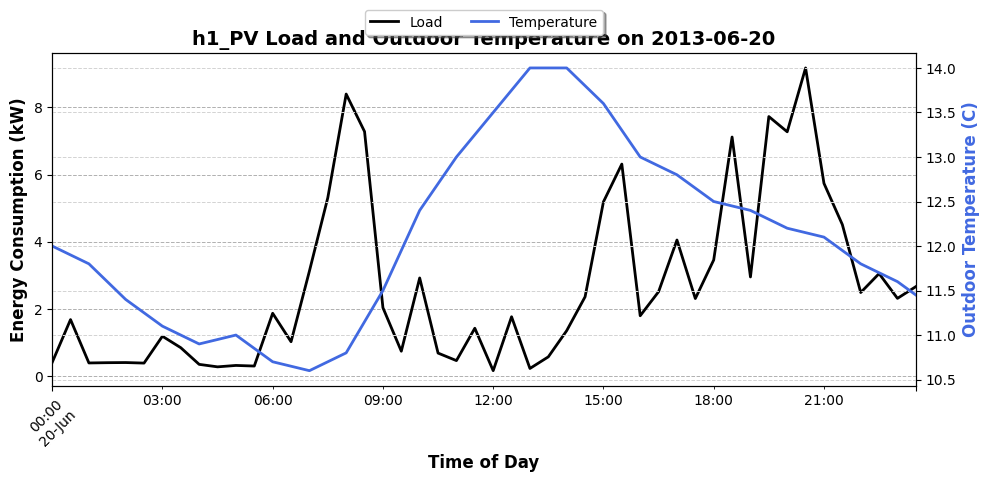

In [1401]:
d = '2013-06-20'  # specified date
resident = 'h1_PV'  # variable name

# Create the plot
fig, ax = plt.subplots(figsize=(10, 5))
ax2 = ax.twinx()

ax.set_title(f"{resident} Load and Outdoor Temperature on {d}", fontweight='bold', fontsize = 14)

# Plot temperature on secondary y-axis
l1 = df['temperature'].loc[d].plot(ax=ax2, c='royalblue', lw=2, label='Temperature')

# Plot load on primary y-axis
l2 = df[resident].loc[d].plot(ax=ax, c='black', lw=2, label='Load')

# Adding legends
# Adding legends
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, 1.15), ncol=2, fancybox=True, shadow=True)


# Setting y-axis labels
ax2.set_ylabel('Outdoor Temperature (C)', fontdict={'weight': 'bold', 'color': 'royalblue', 'size': 12})
ax.set_ylabel('Energy Consumption (kW)', fontdict={'weight': 'bold', 'color': 'black', 'size': 12})

# Setting x-axis labels and rotation for better readability
ax.set_xlabel('Time of Day', fontdict={'weight': 'bold', 'size': 12})
plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

# Setting grid lines
ax.grid(which='major', axis='x', linestyle='--', linewidth=0.7)
ax.grid(which='major', axis='y', linestyle='--', linewidth=0.7)
ax2.grid(which='major', axis='y', linestyle='--', linewidth=0.7, color='lightgrey')

# Customize tick parameters
ax.tick_params(axis='both', which='major', labelsize=10)
ax2.tick_params(axis='both', which='major', labelsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


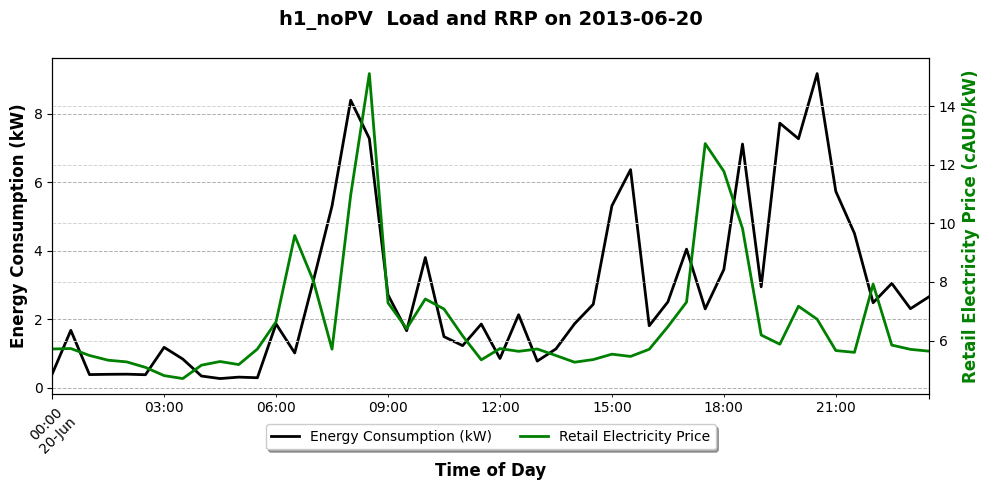

In [1403]:
d = '2013-06-20'  # specified date
resident = 'h1_noPV'  # variable name

# Create the plot
fig, ax = plt.subplots(figsize=(10, 5))
ax2 = ax.twinx()

ax.set_title(f"{resident}  Load and RRP on {d}", fontweight='bold', fontsize = 14, pad = 24)

# Plot temperature on secondary y-axis
l1 = df['RRP'].loc[d].plot(ax=ax2, c='green', lw=2, label='Retail Electricity Price')

# Plot load on primary y-axis
l2 = df[resident].loc[d].plot(ax=ax, c='black', lw=2, label='Energy Consumption (kW)')

# Adding legends
# Adding legends
lines, labels = ax.get_legend_handles_labels()
lines2, labels2 = ax2.get_legend_handles_labels()
ax.legend(lines + lines2, labels + labels2, loc='upper center', bbox_to_anchor=(0.5, -0.07), ncol=2, fancybox=True, shadow=True)


# Setting y-axis labels
ax2.set_ylabel('Retail Electricity Price (cAUD/kW)', fontdict={'weight': 'bold', 'color': 'green', 'size': 12})
ax.set_ylabel('Energy Consumption (kW)', fontdict={'weight': 'bold', 'color': 'black', 'size': 12})

# Setting x-axis labels and rotation for better readability
ax.set_xlabel('Time of Day', fontdict={'weight': 'bold', 'size': 12})
plt.setp(ax.xaxis.get_majorticklabels(), rotation=45)

# Setting grid lines
ax.grid(which='major', axis='x', linestyle='--', linewidth=0.7)
ax.grid(which='major', axis='y', linestyle='--', linewidth=0.7)
ax2.grid(which='major', axis='y', linestyle='--', linewidth=0.7, color='lightgrey')

# Customize tick parameters
ax.tick_params(axis='both', which='major', labelsize=10)
ax2.tick_params(axis='both', which='major', labelsize=10)

# Adjust layout
plt.tight_layout()

# Show the plot
plt.show()


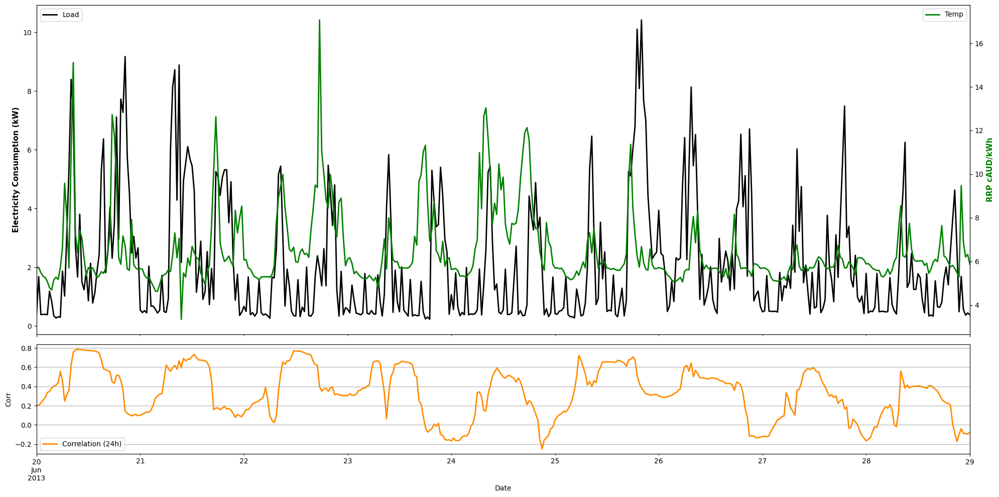

In [1404]:
# Date range for the second plot
sn = pd.to_datetime('2013-06-20')  # Start date for correlation plot (next day after the specified date)
en = sn + pd.Timedelta(days=9)  # End date for correlation plot (one week after)

# Create the combined plot
fig = plt.figure(figsize=(20, 10))
gx = gs.GridSpec(nrows=2, ncols=1, figure=fig, height_ratios=[3, 1])
ax = np.empty(shape=(2, 1), dtype=object)
ax[0, 0] = fig.add_subplot(gx[0, 0])
axr = ax[0, 0].twinx()
ax[1, 0] = fig.add_subplot(gx[1, 0], sharex=ax[0, 0])



# Plot for rolling correlation
df['RRP'].loc[sn:en].plot(ax=axr, color='green', lw=2, label='Temp')
df[resident].loc[sn:en].plot(ax=ax[0, 0], color='black', lw=2, label='Load')
ax[0, 0].legend(loc='upper left')
axr.legend(loc='upper right')
axr.set_ylabel('RRP cAUD/kWh', fontdict={'weight': 'bold', 'color': 'green', 'size': 11})
ax[0, 0].set_ylabel('Electricity Consumption (kW)', fontdict={'weight': 'bold', 'color': 'black', 'size': 11})
corr = df[resident].rolling(window=24).corr(df['RRP'])
corr.loc[sn:en].plot(ax=ax[1, 0], color='darkorange', lw=2, linestyle='-', label='Correlation (24h)')
ax[1, 0].legend(loc='lower left')
ax[1, 0].grid(which='major', axis='y')
ax[1, 0].set_ylabel('Corr')
ax[1, 0].set_xlabel('Date')

fig.tight_layout()
plt.savefig('Load_RRP.png', dpi=600)
plt.show()

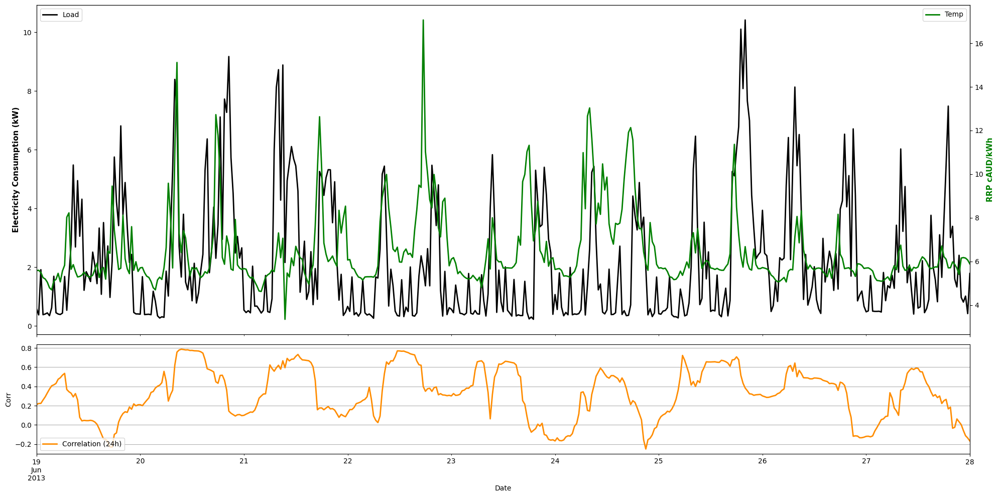

In [1718]:

# Date range for the second plot
sn = pd.to_datetime('2013-06-19')  # Start date for correlation plot (next day after the specified date)
en = sn + pd.Timedelta(days=9)  # End date for correlation plot (one week after)

# Create the combined plot
fig = plt.figure(figsize=(20, 10))
gx = gs.GridSpec(nrows=2, ncols=1, figure=fig, height_ratios=[3, 1])
ax = np.empty(shape=(2, 1), dtype=object)
ax[0, 0] = fig.add_subplot(gx[0, 0])
axr = ax[0, 0].twinx()
ax[1, 0] = fig.add_subplot(gx[1, 0], sharex=ax[0, 0])

# Plot for rolling correlation
df['RRP'].loc[sn:en].plot(ax=axr, color='green', lw=2, label='Temp')
df[resident].loc[sn:en].plot(ax=ax[0, 0], color='black', lw=2, label='Load')
ax[0, 0].legend(loc='upper left')
axr.legend(loc='upper right')
axr.set_ylabel('RRP cAUD/kWh', fontdict={'weight': 'bold', 'color': 'green', 'size': 11})
ax[0, 0].set_ylabel('Electricity Consumption (kW)', fontdict={'weight': 'bold', 'color': 'black', 'size': 11})

# Highlight specific hours from 6 am to 9 am
#for date in pd.date_range(start=sn, end=en):
    #ax[0, 0].axvspan(date + pd.Timedelta(hours=6), date + pd.Timedelta(hours=9), color='yellow', alpha=0.3)
    #ax[1, 0].axvspan(date + pd.Timedelta(hours=6), date + pd.Timedelta(hours=9), color='yellow', alpha=0.3)

corr = df[resident].rolling(window=24).corr(df['RRP'])
corr.loc[sn:en].plot(ax=ax[1, 0], color='darkorange', lw=2, linestyle='-', label='Correlation (24h)')
ax[1, 0].legend(loc='lower left')
ax[1, 0].grid(which='major', axis='y')
ax[1, 0].set_ylabel('Corr')
ax[1, 0].set_xlabel('Date')

fig.tight_layout()
plt.savefig('Load_RRP.png', dpi=600)
plt.show()

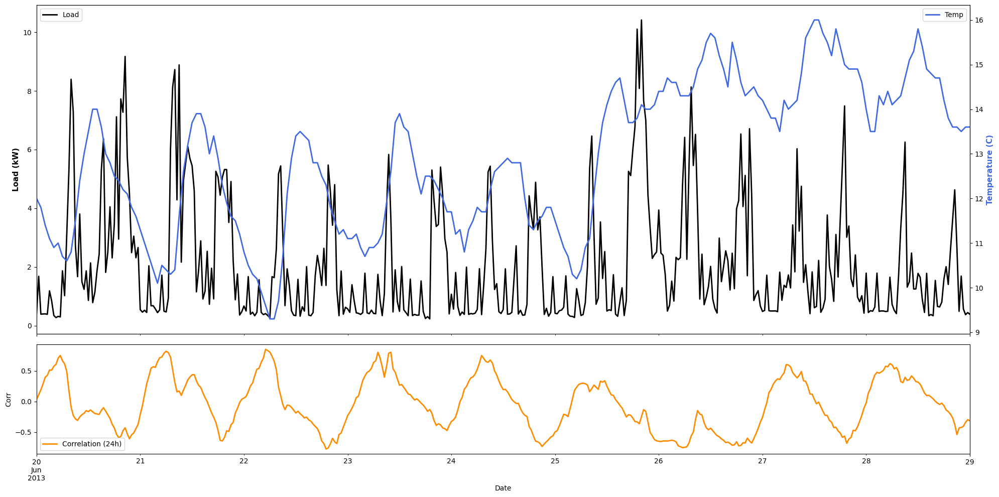

In [1717]:
# Date range for the second plot
sn = pd.to_datetime('2013-06-20')  # Start date for correlation plot (next day after the specified date)
en = sn + pd.Timedelta(days=9)  # End date for correlation plot (one week after)

# Create the combined plot
fig = plt.figure(figsize=(20, 10))
gx = gs.GridSpec(nrows=2, ncols=1, figure=fig, height_ratios=[3, 1])
ax = np.empty(shape=(2, 1), dtype=object)
ax[0, 0] = fig.add_subplot(gx[0, 0])
axr = ax[0, 0].twinx()
ax[1, 0] = fig.add_subplot(gx[1, 0], sharex=ax[0, 0])

# Plot for rolling correlation
df['temperature'].loc[sn:en].plot(ax=axr, color='royalblue', lw=2, label='Temp')
df[resident].loc[sn:en].plot(ax=ax[0, 0], color='black', lw=2, label='Load')
ax[0, 0].legend(loc='upper left')
axr.legend(loc='upper right')
axr.set_ylabel('Temperature (C)', fontdict={'weight': 'bold', 'color': 'royalblue', 'size': 11})
ax[0, 0].set_ylabel('Load (kW)', fontdict={'weight': 'bold', 'color': 'black', 'size': 11})

# Highlight specific hours from 6 am to 9 am
#for date in pd.date_range(start=sn, end=en):
    #ax[0, 0].axvspan(date + pd.Timedelta(hours=6), date + pd.Timedelta(hours=9), color='yellow', alpha=0.3)
    #ax[1, 0].axvspan(date + pd.Timedelta(hours=6), date + pd.Timedelta(hours=9), color='yellow', alpha=0.3)


corr = df[resident].rolling(window=24).corr(df['temperature'])
corr.loc[sn:en].plot(ax=ax[1, 0], color='darkorange', lw=2, linestyle='-', label='Correlation (24h)')
ax[1, 0].legend(loc='lower left')
ax[1, 0].grid(which='major', axis='y')
ax[1, 0].set_ylabel('Corr')
ax[1, 0].set_xlabel('Date')

fig.tight_layout()
plt.savefig('Load_Temp.png', dpi=600)
plt.grid()
plt.show()

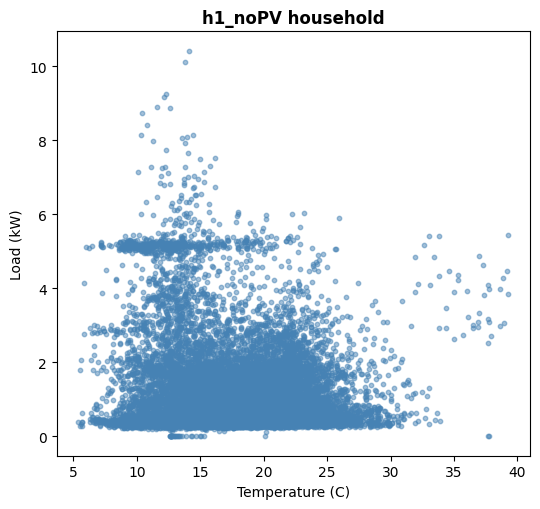

In [1408]:
fig, ax = plt.subplots(figsize=(5.5,5.2))
ax.scatter(df['temperature'], df[resident], s=10, c='steelblue', marker='o', alpha=0.5)
ax.set_title(resident+' household', fontweight='bold')
ax.set_xlabel('Temperature (C)')
ax.set_ylabel('Load (kW)')
#ax.grid(which='major', axis='both')
fig.tight_layout()
plt.show()

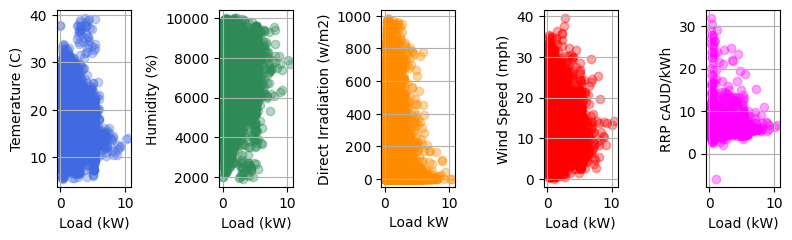

In [1409]:
fig, ax = plt.subplots(nrows=1, ncols=5, figsize=(8,2.5))
#fig.suptitle(station+' substation', fontweight='bold')
ax[0].scatter(df[resident].values, df['temperature'].values, c='royalblue', alpha=0.3)
ax[0].set_xlabel('Load (kW)')
ax[0].set_ylabel('Temerature (C)')
ax[0].grid(True)
ax[1].scatter(df[resident].values, df['relative_humidity'].values*100, c='seagreen', alpha=0.35)
ax[1].set_xlabel('Load (kW)')
ax[1].set_ylabel('Humidity (%)')
ax[1].grid(True)
ax[2].scatter(df[resident].values, df['direct_rad'].values, c='darkorange', alpha=0.35)
ax[2].set_xlabel('Load kW')
ax[2].set_ylabel('Direct Irradiation (w/m2)')
ax[2].grid(True)
ax[3].scatter(df[resident].values, df['wind_speed10'].values, c='red', alpha=0.35)
ax[3].set_xlabel('Load (kW)')
ax[3].set_ylabel('Wind Speed (mph)')
ax[3].grid(True)
ax[4].scatter(df[resident].values, df['RRP'].values, c='magenta', alpha=0.35)
ax[4].set_xlabel('Load (kW)')
ax[4].set_ylabel('RRP cAUD/kWh')
ax[4].grid(True)
fig.tight_layout()
plt.savefig('Distributions.png', dpi=600)
plt.show()

if data has cyclic and preprocessing

In [ ]:
#KCUF = KCUF.drop(columns= ['hour_decimal', 'sin_hour', 'cos_hour', 'week_sin', 'week_cos','weekend', 'month_sin', 'month_cos', 'h1_PV_48h', 'h1_PV_96h','h1_PV_diff', 'h1_PV_week', 'l1_PV_48h', 'l1_PV_96h', 'l1_PV_diff','l1_PV_week'])

In [1411]:
def data_explore(dataframe):
    print("DATA EXPLORATION")
    print('*'*70)
    print("Shape of dataset : ",dataframe.shape)
    print('*'*70)
    print(dataframe.info())
    print('*'*70)
    print("STATISTICAL ANALYSIS OF NUMERICAL DATA")
    print('*'*70)
    print(dataframe.describe().T)
    print('*'*70)
    print("MISSING VALUES")
    print('*'*70)
    print(dataframe.isna().sum().sort_values(ascending=False))
    print('*'*70)
    print("MISSING VALUES IN %")
    print('*'*70)
    print(round(100* (dataframe.isnull().sum() / len(dataframe)).sort_values(ascending=False),2))
    print('*'*70)

#Exploring the data
data_explore(df)

DATA EXPLORATION
**********************************************************************
Shape of dataset :  (17519, 55)
**********************************************************************
<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 17519 entries, 2012-07-01 00:00:00 to 2013-06-30 23:00:00
Data columns (total 55 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   temperature        17519 non-null  float64
 1   relative_humidity  17519 non-null  float64
 2   dewpoint           17519 non-null  float64
 3   apparent_temp      17519 non-null  float64
 4   precipitation      17519 non-null  float64
 5   rain               17519 non-null  float64
 6   weather_code       17519 non-null  float64
 7   presure_msl        17519 non-null  float64
 8   surface_pressure   17519 non-null  float64
 9   cloud_cover        17519 non-null  float64
 10  wind_speed10       17519 non-null  float64
 11  wind_speed100      17519 non-null  f

In [1412]:
df_eval = df.drop(columns = ['temperature', 'relative_humidity', 'dewpoint', 'apparent_temp', 'precipitation', 'rain', 'weather_code', 'presure_msl','surface_pressure', 'cloud_cover', 'wind_speed10', 'wind_speed100','isday', 'sun_dur', 'direct_rad', 'diffuse_rad', 'direct_nor','direct_inst', 'diffuse_inst', 'nor_instant',])

fixing the error metrics evaluation

In [1418]:
def mrbe(actual, predicted):
    # Convert to numpy arrays for element-wise operations
    actual = np.array(actual)
    predicted = np.array(predicted)
    
    # Mask to avoid division by zero
    mask = actual != 0
    
    # Calculate relative errors where actual values are non-zero
    relative_errors = (predicted[mask] - actual[mask]) / actual[mask]
    
    # Calculate MRBE
    mrbe_value = np.mean(relative_errors) * 100
    
    return mrbe_value

In [1419]:
def bias(actual, predicted):
    """
    Calculate the Bias.
    
    Parameters:
    actual (array-like): Actual values.
    predicted (array-like): Predicted values.
    
    Returns:
    float: Bias value.
    """
    actual = np.array(actual)
    predicted = np.array(predicted)
    bias_value = np.mean(predicted - actual)
    return bias_value

In [1420]:
def calculate_errors(y_true, y_pred):

    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    #mrbe_value = mrbe(y_true, y_pred)
    # Ensure they have the same length
    if len(y_true) != len(y_pred):
        raise ValueError(f"Inconsistent number of samples: {len(y_true)} in y_true, {len(y_pred)} in y_pred")
    
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    mbe = mrbe(y_true, y_pred)
    bias_val = bias(y_true, y_pred)
    return  mae, mse, mbe, bias_val


In [1421]:
def metrics_table(models, y_true):
    errors = {'Model': [], 'MAE': [], 'MSE': [], 'MRBE': [], 'Bias': []}
    
    for model_name, y_pred in models.items():
        mae, rmse, mbe, bias_val = calculate_errors(y_true, y_pred)
        errors['Model'].append(model_name)
        errors['MAE'].append(mae)
        errors['MSE'].append(rmse)
        errors['MRBE'].append(mbe)
        errors['Bias'].append(bias_val)
    
    return pd.DataFrame(errors)

plotting function

In [1422]:
# Define the function to plot baselines
def plot_baseline(original_data, baseline, title, selected_date, start_peak_hour, end_peak_hour):
    # Ensure baseline indices match the original data's datetime indices
    baseline.index = original_data.index

    # Create the figure and axis before any plotting
    plt.figure(figsize=(12, 6))
    
    # Highlight peak hour period
    #plt.axvspan(start_peak_hour, end_peak_hour, color='yellow', alpha=0.3, label='Peak Hour')

    # Plot original data and baseline
    plt.plot(original_data.index, original_data, label='Original Load', color='black')
    plt.plot(baseline.index, baseline, label='Baseline', color='red')

    # Mark the selected date
    plt.axvline(x=selected_date, color='green', linestyle='--', label='Selected Date')

    # Set labels and title
    plt.xlabel('Time')
    plt.ylabel('Load (kW)')
    plt.title(title)

    # Display legend
    plt.legend()

    # Enable grid and rotate x-axis labels for better readability
    plt.grid(True)
    plt.xticks(rotation=45)

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()


In [1423]:
def plot_baseline1(original_data, baseline, title, selected_date, start_peak_hour = start_peak_hour, end_peak_hour = end_peak_hour):

    #baseline.index = pd.to_datetime(baseline.index.map(lambda t: pd.Timestamp.combine(selected_date, t)))
    plt.axvspan(start_peak_hour, end_peak_hour, color='yellow', alpha=0.3, label='Peak Hour')
    plt.figure(figsize=(12, 6))
    plt.plot(original_data.index, original_data, label='Original Load', color='blue')
    plt.plot(baseline.index, baseline, label='Baseline', color='red')
    plt.axvline(x=selected_date, color='green', linestyle='--', label='Selected Date')
    plt.xlabel('Time')
    plt.ylabel('Load (kW)')
    plt.title(title)
    plt.legend()
    plt.grid(True)
    plt.xticks(rotation=45)
    plt.tight_layout()
    plt.show()

In [1424]:
# Function to plot residuals
def plot_residuals(y_test, y_test_pred, title='Residuals Plot'):
    residuals = y_test - y_test_pred
    plt.figure(figsize=(12, 8))
    
    # Scatter plot with color by density
    sns.scatterplot(x=y_test_pred, y=residuals, alpha=0.5, palette='viridis')
    
    # Overlay Kernel Density Estimate (KDE) plot
    sns.kdeplot(x=y_test_pred, y=residuals, cmap="Reds", fill=True, alpha=0.4)
    
    # Add a horizontal line at zero
    plt.axhline(0, color='red', linestyle='--', lw=2)
    
    # Set labels and title
    plt.xlabel('Predicted', fontsize=14)
    plt.ylabel('Residuals', fontsize=14)
    plt.title(title, fontsize=16)
    
    # Add grid for better readability
    plt.grid(True, linestyle='--', alpha=0.7)
    
    plt.show()

# Function to plot time series prediction
def plot_time_series(dates, y_test, y_test_pred, title='Time Series Prediction'):
    plt.figure(figsize=(14, 8))
    plt.plot(y_test.index, y_test, label='Actual', color='blue', linestyle='--', marker='o')
    plt.plot(y_test.index, y_test_pred, label='Predicted', color='red', linestyle='--', marker='x')
    #Improve x-axis date formatting
    plt.gca().xaxis.set_major_locator(plt.MaxNLocator(10))
    plt.gca().xaxis.set_major_formatter(plt.FixedFormatter(dates.strftime("%Y-%m-%d %H:%M")))
    plt.xticks(rotation=45, ha='right')
    
    # Add grid for better readability
    plt.grid(True, linestyle='--', alpha=0.7)
    
    # Set labels and title
    plt.xlabel('Date', fontsize=14)
    plt.ylabel('Value', fontsize=14)
    plt.title(title, fontsize=16)
    
    # Rotate x-axis labels for better readability
    plt.xticks(rotation=45)
    
    # Enhance legend
    plt.legend(loc='upper left', fontsize=12)
    
    # Show the plot
    plt.tight_layout(pad=3)
    plt.show()

# Function to plot feature importance
def plot_feature_importance(model, feature_names, title='Feature Importance'):
    importances = model.feature_importances_
    indices = np.argsort(importances)
    plt.figure(figsize=(10, 8))
    plt.title(title)
    plt.barh(range(len(indices)), importances[indices], align='center')
    plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
    plt.xlabel('Relative Importance')
    plt.show()


In [1425]:
def plot_regression(original_data, baseline, title, selected_date):
    plt.figure(figsize=(12, 6))

    # Highlight peak hour period
    #plt.axvspan(start_peak_hour, end_peak_hour, color='yellow', alpha=0.3, label='Peak Hour')

    # Plot original data and baseline
    plt.plot(original_data.index, original_data, label='Original Load', color='blue')
    plt.plot(baseline.index, baseline, label='Baseline', color='red')

    # Mark the selected date
    plt.axvline(x=selected_date, color='green', linestyle='--', label='Selected Date')

    # Set labels and title
    plt.xlabel('Time')
    plt.ylabel('Load (kW)')
    plt.title(title)

    # Display legend
    plt.legend()

    # Enable grid and rotate x-axis labels for better readability
    plt.grid(True)
    plt.xticks(rotation=45)

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()

Defining Averaging methods

In [1426]:

def PJM_baseline_method_high(df, selected_date, periods=5, top_days_count=4, acceptance_ratio=0.75):
    if selected_date not in df.index:
        latest_date = df.index[df.index < selected_date].max()
        print(f"Selected date is not in the data range. Using {latest_date} instead.")
        selected_date = latest_date

    # Filter to get data only up to the day before the selected date
    df_prior = df[df.index < selected_date]

    # Function to check if a date is a weekday (Monday=0, Sunday=6)
    def is_weekday(date):
        return date.weekday() < 5

    # Collect the last `periods` business days, skipping weekends
    business_days = []
    date = selected_date - pd.Timedelta(days=1)
    while len(business_days) < periods:
        if is_weekday(date):
            business_days.append(date)
        date -= pd.Timedelta(days=1)
    
    # Convert to a DataFrame with normalized dates
    business_days = pd.to_datetime(business_days)
    df_business_days = df_prior[df_prior.index.normalize().isin(business_days)]

    # Calculate ADEPU for each day
    ADEPU = df_business_days.resample('D').sum()

    # Calculate ADEPL
    ADEPL = ADEPU.mean()

    # Calculate the ratio for selection criteria and filter days
    selection = ADEPU / ADEPL
    acceptable_days = selection[selection >= acceptance_ratio].index

    # If not enough acceptable days, iterate to find more
    while len(acceptable_days) < periods:
        print("Not enough acceptable days. Iterating to find more days...")
        while True:
            date -= pd.Timedelta(days=1)
            if is_weekday(date) and date not in business_days:
                business_days = list(business_days)  # Ensure business_days is a list for appending
                business_days.append(date)
                business_days = pd.to_datetime(business_days)
                break

        # Filter the DataFrame to include the updated list of business days
        df_business_days = df_prior[df_prior.index.normalize().isin(business_days.normalize())]

        # Recalculate ADEPU and ADEPL
        ADEPU = df_business_days.resample('D').sum()
        ADEPL = ADEPU.mean()
        selection = ADEPU / ADEPL
        acceptable_days = selection[selection >= acceptance_ratio].index

    # Select the top `top_days_count` days by ADEPU
    top_days = ADEPU.loc[acceptable_days].nlargest(top_days_count).index

    # Calculate the average for each half-hour period over the selected top days
    subset_top_days = df[df.index.normalize().isin(top_days)]
    baseline = subset_top_days.groupby(subset_top_days.index.time).mean()

    return baseline, top_days



In [1427]:
def MidXofY(df, selected_date, periods=6, top_days_count=4, acceptance_ratio=0.00):
    if selected_date not in df.index:
        latest_date = df.index[df.index < selected_date].max()
        print(f"Selected date is not in the data range. Using {latest_date} instead.")
        selected_date = latest_date

    # Filter to get data only up to the day before the selected date
    df_prior = df[df.index < selected_date]

    # Function to check if a date is a weekday (Monday=0, Sunday=6)
    def is_weekday(date):
        return date.weekday() < 5

    # Collect the last `periods` business days, skipping weekends
    business_days = []
    date = selected_date - pd.Timedelta(days=1)
    while len(business_days) < periods:
        if is_weekday(date):
            business_days.append(date)
        date -= pd.Timedelta(days=1)

    # Convert to a DatetimeIndex
    business_days = pd.to_datetime(business_days)
    df_business_days = df_prior[df_prior.index.normalize().isin(business_days.normalize())]

    # Calculate ADEPU for each day
    ADEPU = df_business_days.resample('D').sum()

    # Calculate ADEPL
    ADEPL = ADEPU.mean()

    # Calculate the ratio for selection criteria and filter days
    selection = ADEPU / ADEPL
    acceptable_days = selection[selection >= acceptance_ratio].index

    # If not enough acceptable days, iterate to find more
    while len(acceptable_days) < periods:
        print("Not enough acceptable days. Iterating to find more days...")
        while True:
            date -= pd.Timedelta(days=1)
            if is_weekday(date) and date not in business_days:
                business_days = list(business_days)  # Ensure business_days is a list for appending
                business_days.append(date)
                business_days = pd.to_datetime(business_days)
                break

        # Filter the DataFrame to include the updated list of business days
        df_business_days = df_prior[df_prior.index.normalize().isin(business_days.normalize())]

        # Recalculate ADEPU and ADEPL
        ADEPU = df_business_days.resample('D').sum()
        ADEPL = ADEPU.mean()
        selection = ADEPU / ADEPL
        acceptable_days = selection[selection >= acceptance_ratio].index

    # Select the median `top_days_count` days by ADEPU
    sorted_days = ADEPU.loc[acceptable_days].sort_values()
    mid_index = len(sorted_days) // 2

    # Ensure there are enough days to select around the median
    start_index = max(mid_index - (top_days_count // 2), 0)
    end_index = min(start_index + top_days_count, len(sorted_days))
    top_days = sorted_days.iloc[start_index:end_index].index

    # Calculate the average for each half-hour period over the selected top days
    subset_top_days = df[df.index.normalize().isin(top_days)]
    baseline = subset_top_days.groupby(subset_top_days.index.time).mean()

    return baseline, top_days


In [1428]:
def LowXofY(df, selected_date, periods=10, top_days_count=5, acceptance_ratio=0.00):
    if selected_date not in df.index:
        latest_date = df.index[df.index < selected_date].max()
        print(f"Selected date is not in the data range. Using {latest_date} instead.")
        selected_date = latest_date

    # Filter to get data only up to the day before the selected date
    df_prior = df[df.index < selected_date]

    # Function to check if a date is a weekday (Monday=0, Sunday=6)
    def is_weekday(date):
        return date.weekday() < 5

    # Collect the last `periods` business days, skipping weekends
    business_days = []
    date = selected_date - pd.Timedelta(days=1)
    while len(business_days) < periods:
        if is_weekday(date):
            business_days.append(date)
        date -= pd.Timedelta(days=1)

    # If not enough business days, keep searching
    while len(business_days) < periods:
        if is_weekday(date):
            business_days.append(date)
        date -= pd.Timedelta(days=1)

    # Convert to a DatetimeIndex
    business_days = pd.to_datetime(business_days)
    df_business_days = df_prior[df_prior.index.normalize().isin(business_days.normalize())]

    # Calculate ADEPU for each day
    ADEPU = df_business_days.resample('D').sum()

    # Calculate ADEPL
    ADEPL = ADEPU.mean()

    # Calculate the ratio for selection criteria and filter days
    selection = ADEPU / ADEPL
    acceptable_days = selection[selection >= acceptance_ratio].index

    # If not enough acceptable days, iterate to find more
    while len(acceptable_days) < periods:
        print("Not enough acceptable days. Iterating to find more days...")
        while True:
            date -= pd.Timedelta(days=1)
            if is_weekday(date) and date not in business_days:
                business_days = list(business_days)  # Ensure business_days is a list for appending
                business_days.append(date)
                business_days = pd.to_datetime(business_days)
                break

        # Filter the DataFrame to include the updated list of business days
        df_business_days = df_prior[df_prior.index.normalize().isin(business_days.normalize())]

        # Recalculate ADEPU and ADEPL
        ADEPU = df_business_days.resample('D').sum()
        ADEPL = ADEPU.mean()
        selection = ADEPU / ADEPL
        acceptable_days = selection[selection >= acceptance_ratio].index

    # Select the top `top_days_count` days by ADEPU (lowest values)
    top_days = ADEPU.loc[acceptable_days].nsmallest(top_days_count).index

    # Calculate the average for each half-hour period over the selected top days
    subset_top_days = df[df.index.normalize().isin(top_days.normalize())]
    baseline = subset_top_days.groupby(subset_top_days.index.time).mean()

    return baseline, top_days


In [1429]:
def NYISO_baseline_method_high(df, selected_date, periods=10, top_days_count=5, acceptance_ratio=0.25):
    if selected_date not in df.index:
        latest_date = df.index[df.index < selected_date].max()
        print(f"Selected date is not in the data range. Using {latest_date} instead.")
        selected_date = latest_date

    # Filter to get data only up to the day before the selected date
    df_prior = df[df.index < selected_date]

    # Function to check if a date is a valid business day (Monday=0, Sunday=6)
    def is_valid_day(date):
        return date.weekday() < 5

    # Collect the last `periods` valid days, skipping weekends
    valid_days = []
    date = selected_date - pd.Timedelta(days=1)
    while len(valid_days) < periods:
        if is_valid_day(date):
            valid_days.append(date)
        date -= pd.Timedelta(days=1)
    
    # Ensure we have at least `periods` valid days
    while len(valid_days) < periods:
        if is_valid_day(date):
            valid_days.append(date)
        date -= pd.Timedelta(days=1)

    # Convert valid_days to strings for date-only comparison
    valid_days_str = [day.strftime('%Y-%m-%d') for day in valid_days]
    
    # Filter the DataFrame to include only the selected valid days
    df_valid_days = df_prior[df_prior.index.strftime('%Y-%m-%d').isin(valid_days_str)]

    # Calculate ADEPU for each valid day
    ADEPU = df_valid_days.resample('D').sum()

    # Baseline calculation window
    baseline_window = []

    # Add the first day's ADEPU
    baseline_window.append((ADEPU.index[0], ADEPU.iloc[0]))

    # Iterate and add valid days to the baseline window
    for i in range(1, len(ADEPU)):
        if ADEPU.iloc[i] > acceptance_ratio * ADEPU.iloc[i - 1]:
            baseline_window.append((ADEPU.index[i], ADEPU.iloc[i]))
        if len(baseline_window) == periods:
            break

    # Ensure we have exactly `periods` days in the baseline window
    if len(baseline_window) < periods:
        raise ValueError("Not enough valid days to form the baseline window.")

    # Convert the baseline window to a Series
    baseline_window = pd.Series([value for date, value in baseline_window], 
                                index=[date for date, value in baseline_window])

    # Sort the baseline window to find the top `top_days_count` days
    top_days_window = baseline_window.sort_values(ascending=False).head(top_days_count)

    # Extract the dates of the top days
    top_days = top_days_window.index

    # Convert top_days to strings for date-only comparison
    top_days_str = [day.strftime('%Y-%m-%d') for day in top_days]

    # Filter the DataFrame to include only the selected top days
    subset_top_days = df[df.index.strftime('%Y-%m-%d').isin(top_days_str)]

    # Calculate the average for each half-hour period over the selected top days
    baseline = subset_top_days.groupby(subset_top_days.index.time).mean()

    return baseline, top_days


In [1430]:
def NearestXofY(series, selected_date, periods=5):
    if selected_date not in series.index:
        latest_date = series.index[series.index < selected_date].max()
        print(f"Selected date is not in the data range. Using {latest_date} instead.")
        selected_date = latest_date

    # Filter to get data only up to the day before the selected date
    series_prior = series[series.index < selected_date]

    # Function to check if a date is a valid business day (Monday=0, Sunday=6)
    def is_valid_day(date):
        return date.weekday() < 5

    # Collect the last `periods` valid days, skipping weekends
    valid_days = []
    date = selected_date - pd.Timedelta(days=1)
    while len(valid_days) < periods:
        if is_valid_day(date):
            valid_days.append(date)
        date -= pd.Timedelta(days=1)
    
    # Ensure we have at least `periods` valid days
    while len(valid_days) < periods:
        if is_valid_day(date):
            valid_days.append(date)
        date -= pd.Timedelta(days=1)

    # Convert valid_days to strings for date-only comparison
    valid_days_str = [day.strftime('%Y-%m-%d') for day in valid_days]

    # Filter the series to include only the selected valid days
    series_valid_days = series[series.index.strftime('%Y-%m-%d').isin(valid_days_str)]

    # Calculate total consumption for each valid day
    df_prior = series_valid_days.to_frame(name='h1_PV')
    df_prior['date'] = df_prior.index.date
    daily_consumption = df_prior.groupby('date')['h1_PV'].sum()

    # Total consumption on the selected date
    selected_date_consumption = series[series.index.date == selected_date.date()].sum()

    # Find the X days with the closest total consumption to the selected date
    closest_days = (daily_consumption - selected_date_consumption).abs().nsmallest(periods).index

    # Convert closest_days to strings for date-only comparison
    closest_days_str = [day.strftime('%Y-%m-%d') for day in closest_days]

    # Filter the series to only include these closest days
    series_closest_days = series[series.index.strftime('%Y-%m-%d').isin(closest_days_str)]

    # Convert to DataFrame for grouping
    df_closest_days = series_closest_days.to_frame(name='h1_PV')

    # Calculate the average for each half-hour period over the selected days
    baseline = df_closest_days.groupby(df_closest_days.index.time).mean()

    return baseline, closest_days

Define ML Methods

In [1431]:
def ridge_regression(X_train, X_test, y_train, y_test, selected_date):
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('ridge', Ridge())
    ])

    ridge_reg = pipeline.fit(X_train, y_train)
    ridge_predictions = ridge_reg.predict(X_test)

    predictions_df = pd.DataFrame(ridge_predictions, index=y_test.index, columns=['Predictions'])

    predictions = predictions_df.loc[selected_date.strftime('%Y-%m-%d')]

    return predictions

def xgboost_regression(X_train, X_test, y_train, y_test, selected_date):
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('xgboost', XGBRegressor(objective='reg:squarederror'))
    ])

    xgboost_reg = pipeline.fit(X_train, y_train)
    xgboost_predictions = xgboost_reg.predict(X_test)

    predictions_df = pd.DataFrame(xgboost_predictions, index=y_test.index, columns=['Predictions'])

    predictions = predictions_df.loc[selected_date.strftime('%Y-%m-%d')]

    return predictions

def random_forest_regression(X_train, X_test, y_train, y_test, selected_date):
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('random_forest', RandomForestRegressor(n_estimators=100, random_state=42))
    ])

    random_forest_reg = pipeline.fit(X_train, y_train)
    random_forest_predictions = random_forest_reg.predict(X_test)

    predictions_df = pd.DataFrame(random_forest_predictions, index=y_test.index, columns=['Predictions'])

    predictions = predictions_df.loc[selected_date.strftime('%Y-%m-%d')]

    return predictions

def svr_regression(X_train, X_test, y_train, y_test, selected_date):
    pipeline = Pipeline([
        ('scaler', StandardScaler()),
        ('svr', SVR())
    ])
    svr_reg = GridSearchCV(pipeline, {'svr__C': [1.0], 'svr__epsilon': [0.1]}, cv=5)
    svr_reg.fit(X_train, y_train)
    svr_predictions = svr_reg.predict(X_test)
    predictions_df = pd.DataFrame(svr_predictions, index=y_test.index, columns=['Predictions'])

    predictions = predictions_df.loc[selected_date.strftime('%Y-%m-%d')]

    return predictions

.drop( columns = ['l1_noPV', 'l2_PV', 'l2_noPV', 'l3_PV', 'l3_noPV', 'm1_PV', 'm1_noPV', 'm2_PV', 'm2_noPV', 'h1_PV', 'h1_noPV', 'h2_PV', 'h2_noPV', 'h3_PV', 'h3_noPV', 'l4_PV', 'l4_noPV', 'l5_PV', 'l5_noPV', 'l6_PV', 'l6_noPV', 'm3_PV', 'm3_noPV', 'm4_PV', 'm4_noPV', 'm5_PV', 'm5_noPV', 'h4_PV', 'h4_noPV', 'h5_PV', 'h5_noPV', 'h6_PV', 'h6_noPV'])

h1PV: 65

In [1432]:
PVeval = df_eval['h1_PV'].loc[selected_date_1.strftime('%Y-%m-%d')]
PVeval2 = df_eval['h1_PV'].loc[selected_date_2.strftime('%Y-%m-%d')]
PVeval3 = df_eval['h1_PV'].loc[selected_date_3.strftime('%Y-%m-%d')]

In [1433]:
noPVeval = df_eval['h1_noPV'].loc[selected_date_1.strftime('%Y-%m-%d')]
noPVeval2 = df_eval['h1_noPV'].loc[selected_date_2.strftime('%Y-%m-%d')]
noPVeval3 = df_eval['h1_noPV'].loc[selected_date_3.strftime('%Y-%m-%d')]

In [1434]:
PVevalh3 = df_eval['h3_PV'].loc[selected_date_1.strftime('%Y-%m-%d')]
PVevalh3_2 = df_eval['h3_PV'].loc[selected_date_2.strftime('%Y-%m-%d')]
PVevalh3_3 = df_eval['h3_PV'].loc[selected_date_3.strftime('%Y-%m-%d')]

In [1435]:
noPVevalh3 = df_eval['h3_noPV'].loc[selected_date_1.strftime('%Y-%m-%d')]
noPVevalh3_2 = df_eval['h3_noPV'].loc[selected_date_2.strftime('%Y-%m-%d')]
noPVevalh3_3 = df_eval['h3_noPV'].loc[selected_date_3.strftime('%Y-%m-%d')]

In [1436]:
PVevall1 = df_eval['l1_PV'].loc[selected_date_1.strftime('%Y-%m-%d')]
PVevall1_2 = df_eval['l1_PV'].loc[selected_date_2.strftime('%Y-%m-%d')]
PVevall1_3 = df_eval['l1_PV'].loc[selected_date_3.strftime('%Y-%m-%d')]

In [1437]:
noPVevall1 = df_eval['l1_noPV'].loc[selected_date_1.strftime('%Y-%m-%d')]
noPVevall1_2 = df_eval['l1_noPV'].loc[selected_date_2.strftime('%Y-%m-%d')]
noPVevall1_3 = df_eval['l1_noPV'].loc[selected_date_3.strftime('%Y-%m-%d')]

manual averaging method testing

In [ ]:
# Assuming df_eval is your DataFrame with DateTime index and 'h1_noPV' values

# Selected date
seld = datetime.strptime('2013-05-23', '%Y-%m-%d')

# Define the range for the last 11 business days from the selected date using pd.bdate_range
end_date = seld - pd.Timedelta(days=1)
business_days = pd.bdate_range(end=end_date, periods=11)

# Filter the dataframe for the last 11 business days
last_11_business_days_df = df_eval.loc[df_eval.index.normalize().isin(business_days), 'h1_noPV']

# Reset index to prepare for pivot
last_11_business_days_df_reset = last_11_business_days_df.reset_index()

# Inspect the columns to find the correct name for the index column
print(last_11_business_days_df_reset.columns)

# Assuming the first column is the DateTime index
datetime_column = last_11_business_days_df_reset.columns[0]

# Convert the index to separate 'date' and 'time' columns
last_11_business_days_df_reset['date'] = last_11_business_days_df_reset[datetime_column].dt.date
last_11_business_days_df_reset['time'] = last_11_business_days_df_reset[datetime_column].dt.time

# Drop the original DateTime index column after reset
last_11_business_days_df_reset = last_11_business_days_df_reset.drop(columns=[datetime_column])

# Ensure there are no duplicate entries for the same date and time
last_11_business_days_df_reset = last_11_business_days_df_reset.drop_duplicates(subset=['date', 'time'])

# Pivot the dataframe to have times as index and dates as columns
pivot_df = last_11_business_days_df_reset.pivot(index='time', columns='date', values='h1_noPV')

# Display the pivot table
pivot_df

Averaging for H1 - NC

In [1438]:
H45_h1PV1, tdHH11 = PJM_baseline_method_high(df_eval['h1_PV'], selected_date_1 )
H510_h1PV1, tdHH11 = NYISO_baseline_method_high(df_eval['h1_PV'], selected_date_1)
L510_h1PV1, tdLH11 = LowXofY(df_eval['h1_PV'], selected_date_1 )
M46_h1PV1, tdMH11 = MidXofY(df_eval['h1_PV'], selected_date_1 )
N5_h1PV1, bdH11 = NearestXofY(df_eval['h1_PV'], selected_date_1)


H45_h1PV2, tdHH12 = PJM_baseline_method_high(df_eval['h1_PV'], selected_date_2 )
H510_h1PV2, tdHH12 = NYISO_baseline_method_high(df_eval['h1_PV'], selected_date_2)
L510_h1PV2, tdLH12 = LowXofY(df_eval['h1_PV'], selected_date_2 )
M46_h1PV2, tdMH12 = MidXofY(df_eval['h1_PV'], selected_date_2 )
N5_h1PV2, bdH12 = NearestXofY(df_eval['h1_PV'], selected_date_2)


H45_h1PV3, tdHH13 = PJM_baseline_method_high(df_eval['h1_PV'], selected_date_3 )
H510_h1PV3, tdHH13 = NYISO_baseline_method_high(df_eval['h1_PV'], selected_date_3)
L510_h1PV3, tdLH13 = LowXofY(df_eval['h1_PV'], selected_date_3 )
M46_h1PV3, tdLH13 = MidXofY(df_eval['h1_PV'], selected_date_3 )
N5_h1PV3, bdH13 = NearestXofY(df_eval['h1_PV'], selected_date_3)

Not enough acceptable days. Iterating to find more days...


Averaging for H3 - NC

In [1480]:
H45_h3PV1, tdHH31 = PJM_baseline_method_high(df_eval['h3_PV'], selected_date_1 )
H510_h3PV1, tdHH31 = NYISO_baseline_method_high(df_eval['h3_PV'], selected_date_1)
L510_h3PV1, tdLH31 = LowXofY(df_eval['h3_PV'], selected_date_1 )
M46_h3PV1, tdMH31 = MidXofY(df_eval['h3_PV'], selected_date_1 )
N5_h3PV1, bdH31 = NearestXofY(df_eval['h3_PV'], selected_date_1)

H45_h3PV2, tdHH32 = PJM_baseline_method_high(df_eval['h3_PV'], selected_date_2 )
H510_h3PV2, tdHH32 = NYISO_baseline_method_high(df_eval['h3_PV'], selected_date_2)
L510_h3PV2, tdLH32 = LowXofY(df_eval['h3_PV'], selected_date_2 )
M46_h3PV2, tdMH32 = MidXofY(df_eval['h3_PV'], selected_date_2 )
N5_h3PV2, bdH32 = NearestXofY(df_eval['h3_PV'], selected_date_2)

H45_h3PV3, tdHH33 = PJM_baseline_method_high(df_eval['h3_PV'], selected_date_3 )
H510_h3PV3, tdHH33 = NYISO_baseline_method_high(df_eval['h3_PV'], selected_date_3)
L510_h3PV3, tdLH33 = LowXofY(df_eval['h3_PV'], selected_date_3 )
M46_h3PV3, tdMH33 = MidXofY(df_eval['h3_PV'], selected_date_3 )
N5_h3PV3, bdH33 = NearestXofY(df_eval['h3_PV'], selected_date_3)


Averaging for L1 - NC

In [1440]:
H45_l1PV1, tdHL11 = PJM_baseline_method_high(df_eval['l1_PV'], selected_date_1 )
H510_l1PV1, tdHL11 = NYISO_baseline_method_high(df_eval['l1_PV'], selected_date_1)
L510_l1PV1, tdLL11 = LowXofY(df_eval['l1_PV'], selected_date_1 )
M46_l1PV1, tdML11 = MidXofY(df_eval['l1_PV'], selected_date_1 )
N5_l1PV1, bdL11 = NearestXofY(df_eval['l1_PV'], selected_date_1)

H45_l1PV2, tdHL12 = PJM_baseline_method_high(df_eval['l1_PV'], selected_date_2 )
H510_l1PV2, tdHL12 = NYISO_baseline_method_high(df_eval['l1_PV'], selected_date_2)
L510_l1PV2, tdLL12 = LowXofY(df_eval['l1_PV'], selected_date_2 )
M46_l1PV2, tdML12 = MidXofY(df_eval['l1_PV'], selected_date_2 )
N5_l1PV2, bdL12 = NearestXofY(df_eval['l1_PV'], selected_date_2)

H45_l1PV3, tdHL13 = PJM_baseline_method_high(df_eval['l1_PV'], selected_date_3 )
H510_l1PV3, tdHL13 = NYISO_baseline_method_high(df_eval['l1_PV'], selected_date_3)
L510_l1PV3, tdLL13 = LowXofY(df_eval['l1_PV'], selected_date_3 )
M46_l1PV3, tdML13 = MidXofY(df_eval['l1_PV'], selected_date_3 )
N5_l1PV3, bdL13 = NearestXofY(df_eval['l1_PV'], selected_date_3)

Averaging for H1 - GC

In [1457]:
H45_h1noPV1, tdnoHH11 = PJM_baseline_method_high(df_eval['h1_noPV'], selected_date_1 )
H510_h1noPV1, tdnoHH11 = NYISO_baseline_method_high(df_eval['h1_noPV'], selected_date_1)
L510_h1noPV1, tdnoLH11 = LowXofY(df_eval['h1_noPV'], selected_date_1 )
M46_h1noPV1, tdnoMH11 = MidXofY(df_eval['h1_noPV'], selected_date_1 )
N5_h1noPV1, bdnoH11 = NearestXofY(df_eval['h1_noPV'], selected_date_1)


H45_h1noPV2, tdnoHH12 = PJM_baseline_method_high(df_eval['h1_noPV'], selected_date_2 )
H510_h1noPV2, tdnoHH12 = NYISO_baseline_method_high(df_eval['h1_noPV'], selected_date_2)
L510_h1noPV2, tdnoLH12 = LowXofY(df_eval['h1_noPV'], selected_date_2 )
M46_h1noPV2, tdnoMH12 = MidXofY(df_eval['h1_noPV'], selected_date_2 )
N5_h1noPV2, bdnoH12 = NearestXofY(df_eval['h1_noPV'], selected_date_2)


H45_h1noPV3, tdnoHH13 = PJM_baseline_method_high(df_eval['h1_noPV'], selected_date_3 )
H510_h1noPV3, tdnoHH13 = NYISO_baseline_method_high(df_eval['h1_noPV'], selected_date_3)
L510_h1noPV3, tdnoLH13 = LowXofY(df_eval['h1_noPV'], selected_date_3 )
M46_h1noPV3, tdnoLH13 = MidXofY(df_eval['h1_noPV'], selected_date_3 )
N5_h1noPV3, bdnoH13 = NearestXofY(df_eval['h1_noPV'], selected_date_3)

Not enough acceptable days. Iterating to find more days...


Averaging for H3 - GC

In [1443]:
H45_h3noPV1, tdnoHH31 = PJM_baseline_method_high(df_eval['h3_noPV'], selected_date_1 )
H510_h3noPV1, tdnoHH31 = NYISO_baseline_method_high(df_eval['h3_noPV'], selected_date_1)
L510_h3noPV1, tdnoLH31 = LowXofY(df_eval['h3_noPV'], selected_date_1 )
M46_h3noPV1, tdnoMH31 = MidXofY(df_eval['h3_noPV'], selected_date_1 )
N5_h3noPV1, bdnoH31 = NearestXofY(df_eval['h3_noPV'], selected_date_1)

H45_h3noPV2, tdnoHH32 = PJM_baseline_method_high(df_eval['h3_noPV'], selected_date_2)
H510_h3noPV2, tdnoHH32 = NYISO_baseline_method_high(df_eval['h3_noPV'], selected_date_2)
L510_h3noPV2, tdnoLH32 = LowXofY(df_eval['h3_noPV'], selected_date_2 )
M46_h3noPV2, tdnoMH32 = MidXofY(df_eval['h3_noPV'], selected_date_2 )
N5_h3noPV2, bdnoH32 = NearestXofY(df_eval['h3_noPV'], selected_date_2)

H45_h3noPV3, tdnoHH33= PJM_baseline_method_high(df_eval['h3_noPV'], selected_date_3)
H510_h3noPV3, tdnoHH33 = NYISO_baseline_method_high(df_eval['h3_noPV'], selected_date_3)
L510_h3noPV3, tdnoLH33 = LowXofY(df_eval['h3_noPV'], selected_date_3 )
M46_h3noPV3, tdnoMH33 = MidXofY(df_eval['h3_noPV'], selected_date_3 )
N5_h3noPV3, bdnoH33 = NearestXofY(df_eval['h3_noPV'], selected_date_3)

Averaging for L1 - GC

In [1444]:
H45_l1noPV1, tdnoHL11 = PJM_baseline_method_high(df_eval['l1_noPV'], selected_date_1 )
H510_l1noPV1, tdnoHL11 = NYISO_baseline_method_high(df_eval['l1_noPV'], selected_date_1)
L510_l1noPV1, tdnoLL11 = LowXofY(df_eval['l1_noPV'], selected_date_1 )
M46_l1noPV1, tdnoML11 = MidXofY(df_eval['l1_noPV'], selected_date_1 )
N5_l1noPV1, bdnoL11 = NearestXofY(df_eval['l1_noPV'], selected_date_1)

H45_l1noPV2, tdnoHL12 = PJM_baseline_method_high(df_eval['l1_noPV'], selected_date_2 )
H510_l1noPV2, tdnoHL12 = NYISO_baseline_method_high(df_eval['l1_noPV'], selected_date_2)
L510_l1noPV2, tdnoLL12 = LowXofY(df_eval['l1_noPV'], selected_date_2 )
M46_l1noPV2, tdnoML12 = MidXofY(df_eval['l1_noPV'], selected_date_2 )
N5_l1noPV2, bdnoL12 = NearestXofY(df_eval['l1_noPV'], selected_date_2)

H45_l1noPV3, tdnoHL13 = PJM_baseline_method_high(df_eval['l1_noPV'], selected_date_3 )
H510_l1noPV3, tdnoHL13 = NYISO_baseline_method_high(df_eval['l1_noPV'], selected_date_3)
L510_l1noPV3, tdnoLL13 = LowXofY(df_eval['l1_noPV'], selected_date_3 )
M46_l1noPV3, tdnoML13 = MidXofY(df_eval['l1_noPV'], selected_date_3 )
N5_l1noPV3, bdnoL13 = NearestXofY(df_eval['l1_noPV'], selected_date_3)

In [ ]:
# Plot each baseline against the original data
plot_baseline(noPVeval, H45_h1noPV, 'PJM High4of5 (H45)', selected_date_1, start_peak_hour, end_peak_hour)
plot_baseline(noPVeval, H510_h1noPV, 'NYISO High5of10 (H510)', selected_date_1, start_peak_hour, end_peak_hour)
plot_baseline(noPVeval, L510_h1noPV, 'Low5of10 (L510)', selected_date_1, start_peak_hour, end_peak_hour)
plot_baseline(noPVeval, M46_h1noPV, 'Mid4of6 (M46)', selected_date_1, start_peak_hour, end_peak_hour)
plot_baseline(noPVeval, N5_h1noPV, 'Nearest5of10 Days N5)', selected_date_1, start_peak_hour, end_peak_hour)



In [ ]:
# Plot each baseline against the original data
plot_baseline(PVeval3, H45_h1PV, 'PJM High4of5 (H45)', selected_date_3, start_peak_hour, end_peak_hour)
plot_baseline(PVeval3, H510_h1PV, 'NYISO High5of10 (H510)', selected_date_3, start_peak_hour, end_peak_hour)
plot_baseline(PVeval3, L510_h1PV, 'Low5of10 (L510)', selected_date_3, start_peak_hour, end_peak_hour)
plot_baseline(PVeval3, M46_h1PV, 'Mid4of6 (M46)', selected_date_3, start_peak_hour, end_peak_hour)
plot_baseline(PVeval3, N5_h1PV, 'Nearest5of10 Days N5)', selected_date_3, start_peak_hour, end_peak_hour)



Machine Learning Methods

1. remember to set parameters
2. keep track of the variables
3. stick to one ML model

Check correlation of variables // is it better for different customers, high negative correlation is good as well

In [ ]:
#if checkign for a specific customer remove them from .drop(columns)
processedcorr = processed_data.drop(columns=['l1_PV', 'l1_noPV', 'l2_PV', 'l2_noPV', 'l3_PV', 'l3_noPV', 'm1_PV', 'm1_noPV', 'm2_PV', 'm2_noPV', 'h1_noPV', 'h2_PV', 'h2_noPV', 'h3_PV', 'h3_noPV', 'l4_PV', 'l4_noPV', 'l5_PV', 'l5_noPV', 'l6_PV', 'l6_noPV', 'm3_PV', 'm3_noPV', 'm4_PV', 'm4_noPV', 'm5_PV', 'm5_noPV', 'h4_PV', 'h4_noPV', 'h5_PV', 'h5_noPV', 'h6_PV', 'h6_noPV'])
processedcorr.columns

# Calculate the correlation matrix for 'h1_noPV' with other features
corr_matrix = processedcorr.corr()

# Filter for 'h1_noPV' correlations
h1_noPV_corr = corr_matrix[["h1_PV"]].sort_values(by="h1_PV", ascending=False)

# Plotting the heatmap
plt.figure(figsize=(10, 8))
sns.heatmap(h1_noPV_corr, annot=True, cmap="coolwarm", center=0)
plt.title("Correlation Heatmap for Resident 65")
plt.show()

Splitting the dataset, choosing a 70-30 train test split with timeseries cross validation

In [1734]:
df.columns

Index(['temperature', 'relative_humidity', 'dewpoint', 'apparent_temp',
       'precipitation', 'rain', 'weather_code', 'presure_msl',
       'surface_pressure', 'cloud_cover', 'wind_speed10', 'wind_speed100',
       'isday', 'sun_dur', 'direct_rad', 'diffuse_rad', 'direct_nor',
       'direct_inst', 'diffuse_inst', 'nor_instant', 'RRP', 'l1_PV', 'l1_noPV',
       'l2_PV', 'l2_noPV', 'l3_PV', 'l3_noPV', 'm1_PV', 'm1_noPV', 'm2_PV',
       'm2_noPV', 'h1_PV', 'h1_noPV', 'h2_PV', 'h2_noPV', 'h3_PV', 'h3_noPV',
       'l4_PV', 'l4_noPV', 'l5_PV', 'l5_noPV', 'l6_PV', 'l6_noPV', 'm3_PV',
       'm3_noPV', 'm4_PV', 'm4_noPV', 'm5_PV', 'm5_noPV', 'h4_PV', 'h4_noPV',
       'h5_PV', 'h5_noPV', 'h6_PV', 'h6_noPV', 'hour_decimal', 'sin_hour',
       'cos_hour', 'week_sin', 'week_cos', 'weekend', 'month_sin', 'month_cos',
       'h1_PV_48h', 'h1_PV_96h', 'h1_PV_diff', 'h1_PV_week'],
      dtype='object')

In [1613]:
# clear KCUF after every iteration

df = df.drop(columns=['hour_decimal', 'sin_hour',
       'cos_hour', 'week_sin', 'week_cos', 'weekend', 'month_sin', 'month_cos',
       'h1_PV_48h', 'h1_PV_96h', 'h1_PV_diff', 'h1_PV_week'])

In [1733]:
# h1_PV, h1_noPV, h3_PV, h3_noPV, l1_PV, l1_noPV

processed_data = apply_cyclic_encoding_and_lag_features_trial(df, 'h1_PV', index_name=None, lag_periods=[48, 96])

processed_data = processed_data.dropna()

X = processed_data.drop(columns=['l1_PV', 'l1_noPV', 'l2_PV', 'l2_noPV', 'l3_PV', 'l3_noPV', 'm1_PV', 'm1_noPV', 'm2_PV', 'm2_noPV', 'h1_PV', 'h1_noPV', 'h2_PV', 'h2_noPV', 'h3_PV', 'h3_noPV', 'l4_PV', 'l4_noPV', 'l5_PV', 'l5_noPV', 'l6_PV', 'l6_noPV', 'm3_PV', 'm3_noPV', 'm4_PV', 'm4_noPV', 'm5_PV', 'm5_noPV', 'h4_PV', 'h4_noPV', 'h5_PV', 'h5_noPV', 'h6_PV', 'h6_noPV'], axis=1)
y = processed_data['h1_PV']

                     temperature  relative_humidity  dewpoint  apparent_temp  \
datetime                                                                       
2012-07-01 00:00:00        11.60               63.0      4.90            9.4   
2012-07-01 00:30:00        11.45               64.0      4.90            9.2   
2012-07-01 01:00:00        11.30               65.0      4.90            9.0   
2012-07-01 01:30:00        11.10               66.0      4.95            8.8   
2012-07-01 02:00:00        10.90               67.0      5.00            8.6   
...                          ...                ...       ...            ...   
2013-06-30 21:00:00        13.40               82.0     10.40           12.3   
2013-06-30 21:30:00        13.30               82.0     10.35           12.2   
2013-06-30 22:00:00        13.20               82.0     10.30           12.1   
2013-06-30 22:30:00        13.20               82.0     10.25           12.1   
2013-06-30 23:00:00        13.20        

In [1616]:
X.columns

Index(['temperature', 'relative_humidity', 'dewpoint', 'apparent_temp',
       'precipitation', 'rain', 'weather_code', 'presure_msl',
       'surface_pressure', 'cloud_cover', 'wind_speed10', 'wind_speed100',
       'isday', 'sun_dur', 'direct_rad', 'diffuse_rad', 'direct_nor',
       'direct_inst', 'diffuse_inst', 'nor_instant', 'RRP', 'hour_decimal',
       'sin_hour', 'cos_hour', 'week_sin', 'week_cos', 'weekend', 'month_sin',
       'month_cos', 'l1_PV_48h', 'l1_PV_96h', 'l1_PV_diff', 'l1_PV_week'],
      dtype='object')

for SVM 

Splitting the set with train_validation_test at a 70-15-15 split// choose to go with 70-30 split to reduce overfitting and use time series cross validation

In [ ]:
#ensuring a 70-15-15, train, test, validation
#X_trainv, X_tempv, y_trainv, y_tempv = train_test_split(X, y, test_size=0.3, shuffle=False) #split data into trainign and temp and ensure the shuffle to be False to obtain the order the df 
#X_valv, X_testv, y_valv, y_testv = train_test_split(X_tempv, y_tempv, test_size=0.5, shuffle=False)#split the temp into validation and test


Using K fold CV instead of validation dataset// avoiding k fold cv as it doesnt catch the temporal nature of the dataset 

Using timeseries split 

split once for every method and use that for all three dates.

In [1594]:

# Feature Selection
selector = SelectKBest(score_func=f_regression, k=17) #17 is the best number of feature post feature selection 
X_selected = selector.fit_transform(X, y)

# Get the selected feature names
selected_features = X.columns[selector.get_support()]
print("Selected Features with SelectKBest:", selected_features)

X_selectedf = pd.DataFrame(X_selected, columns=selected_features, index=y.index)

# Split data into training and test sets with selected features
X_train, X_test, y_train, y_test = train_test_split(X_selectedf, y, test_size=0.3, shuffle=False)

# Define the TimeSeriesSplit cross-validator
tscv = TimeSeriesSplit(n_splits=10) # best number of splits

Selected Features with SelectKBest: Index(['temperature', 'relative_humidity', 'apparent_temp', 'wind_speed100',
       'isday', 'sun_dur', 'direct_rad', 'diffuse_rad', 'direct_nor',
       'direct_inst', 'diffuse_inst', 'nor_instant', 'cos_hour', 'month_cos',
       'h1_PV_48h', 'h1_PV_96h', 'h1_PV_diff'],
      dtype='object')


In [1449]:
# function to evaluate default ML regression models

def evaluate_model(model, X_train, y_train, X_test, y_test, tscv):
    mse_scores = []
    mae_scores = []
    mrbe_scores = []
    bias_scores = []

    # Perform TimeSeriesSplit Cross-Validation
    for train_index, val_index in tscv.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

        # Train the model on the training fold
        model.fit(X_train_fold, y_train_fold)

        # Evaluate on the validation fold
        y_val_pred = model.predict(X_val_fold)
        mse_scores.append(mean_squared_error(y_val_fold, y_val_pred))
        mrbe_scores.append(mrbe(y_val_fold, y_val_pred))
        mae_scores.append(mean_absolute_error(y_val_fold, y_val_pred))
        bias_scores.append(bias(y_val_fold, y_val_pred))

    # Compute average metrics from cross-validation
    avg_mse = np.mean(mse_scores)
    avg_mrbe = np.mean(mrbe_scores)
    avg_mae = np.mean(mae_scores)
    avg_bias = np.mean(bias_scores)

    print(f"Average Validation MSE: {avg_mse}, MRBE: {avg_mrbe}, MAE: {avg_mae}, 'Bias': {avg_bias}")

    # Train the final model on the entire training set
    model.fit(X_train, y_train)

    # Evaluate on the test set
    y_test_pred = model.predict(X_test)
    test_mse = mean_squared_error( y_test, y_test_pred)
    test_mrbe = mrbe(y_test, y_test_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)
    test_bias = bias(y_test, y_test_pred)

    print(f"Test MSE: {test_mse}, MRBE: {test_mrbe},  MAE: {test_mae}, 'Bias': {test_bias}")

    return y_test_pred

default ML models

In [1595]:
from sklearn.preprocessing import RobustScaler

# SVR with scaling
svr = Pipeline([
    ('scaler', RobustScaler()),
    ('svr', SVR())
])
print("\nSupportVectorRegression")
svr_p = evaluate_model(svr, X_train, y_train, X_test, y_test, tscv)

# RandomForestRegressor
rf = RandomForestRegressor(random_state=42)
print("\nRandomForestRegressor")
rf_p = evaluate_model(rf, X_train, y_train, X_test, y_test, tscv)

# Ridge with scaling
ridge = Pipeline([
    ('scaler', StandardScaler()),
    ('ridge', Ridge(random_state=42))
])
print("\nRidge")
r_p = evaluate_model(ridge, X_train, y_train, X_test, y_test, tscv)

# XGBRegressor
xgb = XGBRegressor(random_state=42, use_label_encoder=False, eval_metric='rmse')
print("\nXGBRegressor")
xgb_p = evaluate_model(xgb, X_train, y_train, X_test, y_test, tscv)


SupportVectorRegression
Average Validation MSE: 0.5432098667689248, MRBE: -3.001234696081817, MAE: 0.4202319319574569, 'Bias': -0.07250114783934836
Test MSE: 0.7667458644625416, MRBE: -10.248212762242122,  MAE: 0.46685653667416593, 'Bias': -0.13720206499590099

RandomForestRegressor
Average Validation MSE: 0.5174142478785507, MRBE: 18.16062279931777, MAE: 0.45128339855072463, 'Bias': 0.10388882608695656
Test MSE: 0.7345812107658086, MRBE: 6.064877466890515,  MAE: 0.5045823703419132, 'Bias': -0.019309216288897424

Ridge
Average Validation MSE: 0.6780769616588903, MRBE: 29.943868357357832, MAE: 0.5665000129663673, 'Bias': -0.029185801042223618
Test MSE: 1.0031893597943993, MRBE: 32.58201506333676,  MAE: 0.6797842194154523, 'Bias': -0.01404618001292427

XGBRegressor
Average Validation MSE: 0.5526335365264324, MRBE: 17.17244820501652, MAE: 0.46521846712501336, 'Bias': 0.059186464240088756
Test MSE: 0.7873913446734144, MRBE: -1.6145365696518255,  MAE: 0.5142890676670407, 'Bias': -0.0653443

65 with PV but Timeseries split, test size is 0.3 and n folds 10, features 17


SupportVectorRegression
Average Validation MSE: 0.6273097031064413, MRBE: -5.4468786032728875, MAE: 0.47623710183491663
Test MSE: 0.792610780623752, MRBE: -8.376071733664736,  MAE: 0.4896277732631481

RandomForestRegressor
Average Validation MSE: 0.5174142478785507, MRBE: 18.16062279931777, MAE: 0.45128339855072463
Test MSE: 0.7345812107658086, MRBE: 6.064877466890515,  MAE: 0.5045823703419132


Ridge
Average Validation MSE: 0.6780769616588902, MRBE: 29.943868357357815, MAE: 0.5665000129663672
Test MSE: 1.0031893597943993, MRBE: 32.58201506333668,  MAE: 0.6797842194154522

XGBRegressor
Average Validation MSE: 0.5526335365264324, MRBE: 17.17244820501652, MAE: 0.46521846712501336
Test MSE: 0.7873913446734144, MRBE: -1.6145365696518255,  MAE: 0.5142890676670407

After Hyper Parameter tuning

RF
Average Validation MSE: 0.44237552239300204, MRBE: 9.92434778920418, MAE: 0.4256207572425758
Test MSE: 0.7265509375332873, MRBE: 3.822750084028068,  MAE: 0.5044168988789792

209 with PV:

SupportVectorRegression
Average Validation MSE: 0.2606069470473051, MRBE: 8.068025630890896, MAE: 0.29422549267193665, 'Bias': -0.016277711226031694
Test MSE: 0.23703556650948815, MRBE: -5.705637691390044,  MAE: 0.26291886016671173, 'Bias': -0.10225787894429585

RandomForestRegressor
Average Validation MSE: 0.2248769300903623, MRBE: 6.618435492604907, MAE: 0.2920223405797101, 'Bias': 0.07665946739130439
Test MSE: 0.20919935934029962, MRBE: 1.3384576576527745,  MAE: 0.2740431271609681, 'Bias': -0.004278793699577393

Ridge
Average Validation MSE: 0.43094459405615265, MRBE: -32.74406040614889, MAE: 0.4598119936852588, 'Bias': -0.038024442020673246
Test MSE: 0.4229447249673856, MRBE: 22.47835885296923,  MAE: 0.46796364492711096, 'Bias': -0.009630621657906534

XGBRegressor
Average Validation MSE: 0.2490559504916145, MRBE: 9.165214275405223, MAE: 0.30758124562707734, 'Bias': 0.06899670700586862
Test MSE: 0.2164369247759321, MRBE: -2.9530338271827365,  MAE: 0.27472524128484366, 'Bias': -0.03607013308407341

174 with PV:

SupportVectorRegression
Average Validation MSE: 0.169442753244836, MRBE: 21.247273170335273, MAE: 0.2108111129523648, 'Bias': 0.02677232783598966
Test MSE: 0.1917193786828647, MRBE: 25.98348820920846,  MAE: 0.1801817795563059, 'Bias': -0.035758446047292836

RandomForestRegressor
Average Validation MSE: 0.1799817825828623, MRBE: 31.595989545523867, MAE: 0.2246993713768116, 'Bias': 0.07879572282608696
Test MSE: 0.21669803984325775, MRBE: 50.62533733368907,  MAE: 0.23076159047253164, 'Bias': 0.015758601613522875

Ridge
Average Validation MSE: 0.24113352381151038, MRBE: 19.931993261288987, MAE: 0.2792811660597351, 'Bias': -0.023485956309282387
Test MSE: 0.27947887310603453, MRBE: 62.6333837824503,  MAE: 0.30789148992624593, 'Bias': -0.0011349905067558105

XGBRegressor
Average Validation MSE: 0.19732117565990395, MRBE: 30.170483428590394, MAE: 0.23499357573221635, 'Bias': 0.060269332013215826
Test MSE: 0.20533099372041919, MRBE: 48.39906887687149,  MAE: 0.23098211655305692, 'Bias': 0.017386222197948484



#### wihtout PV 


65 without pV but time series 10 fold and 17 custoemrs

SupportVectorRegression
Average Validation MSE: 0.49822214581028285, MRBE: 21.214860496670592, MAE: 0.3826689599972665, 'Bias': -0.08514230402834655
Test MSE: 0.7869540146623821, MRBE: 14.084088727431821,  MAE: 0.44247723314765774, 'Bias': -0.18934369829166736

RandomForestRegressor
Average Validation MSE: 0.4850084791678624, MRBE: 45.991420540597964, MAE: 0.4182622663043478, 'Bias': 0.08908831340579718
Test MSE: 0.7009720186632348, MRBE: 28.551548973926526,  MAE: 0.4509556358048406, 'Bias': -0.07581426815213217

Ridge
Average Validation MSE: 0.6505097731481566, MRBE: 36.16710221010494, MAE: 0.5388410365385164, 'Bias': -0.03935498570686562
Test MSE: 0.9962698704015062, MRBE: 52.71160452043073,  MAE: 0.6658234310744686, 'Bias': -0.05015927166865581

XGBRegressor
Average Validation MSE: 0.5353018388547669, MRBE: 40.10167327590058, MAE: 0.4366823603230042, 'Bias': 0.049461671403791416
Test MSE: 0.7562251610849419, MRBE: 23.251578830073125,  MAE: 0.4758504948741969, 'Bias': -0.11591975783262168

209 wihtout PV

SupportVectorRegression
Average Validation MSE: 0.2520308907551888, MRBE: 44.906186108429566, MAE: 0.28273925391067, 'Bias': -0.01351569339228165
Test MSE: 0.23169654771315967, MRBE: 12.419729822405259,  MAE: 0.25327357293140046, 'Bias': -0.10745995299585448

RandomForestRegressor
Average Validation MSE: 0.21487477486478263, MRBE: 41.72657708251223, MAE: 0.28118142753623193, 'Bias': 0.08280115217391307
Test MSE: 0.1980074546679985, MRBE: 28.255055333279834,  MAE: 0.26161612754514024, 'Bias': -0.004018494045332286

Ridge
Average Validation MSE: 0.4407789870042425, MRBE: 39.84570704129965, MAE: 0.45420521168083094, 'Bias': -0.03586984145545327
Test MSE: 0.436572573379031, MRBE: 87.70238633827974,  MAE: 0.48557376729247803, 'Bias': 0.011761346147368335

XGBRegressor
Average Validation MSE: 0.2434733457313519, MRBE: 44.01521747032638, MAE: 0.3020198474780008, 'Bias': 0.07064815751481932
Test MSE: 0.21689210532261674, MRBE: 24.30861087116275,  MAE: 0.27449503276473936, 'Bias': -0.034996606919194526

174 without PV

SupportVectorRegression
Average Validation MSE: 0.14913082764564364, MRBE: 34.66915382700935, MAE: 0.1719685032100924, 'Bias': 0.008262158098426047
Test MSE: 0.1913043914819631, MRBE: 25.80491478989513,  MAE: 0.1652984663191724, 'Bias': -0.03296510174114655

RandomForestRegressor
Average Validation MSE: 0.16278695463014492, MRBE: 49.382561096592035, MAE: 0.19014077898550724, 'Bias': 0.0731036739130435
Test MSE: 0.2155015248015367, MRBE: 53.144247479404605,  MAE: 0.22155419131771037, 'Bias': 0.026920929696504052

Ridge
Average Validation MSE: 0.23242568109916814, MRBE: 34.9656841194016, MAE: 0.2673141827487031, 'Bias': -0.02465613197344117
Test MSE: 0.2726225852466286, MRBE: 57.08588999193373,  MAE: 0.2940967255449469, 'Bias': -0.006482405834737582

XGBRegressor
Average Validation MSE: 0.18193666381306245, MRBE: 41.86642684505925, MAE: 0.19991033779963366, 'Bias': 0.049788095289244674
Test MSE: 0.19841606408914986, MRBE: 50.882873391149005,  MAE: 0.2215811154539352, 'Bias': 0.039379862478279126

Trying stacked regression by using meta estimators for better results in SVR and Ridge models

In [1451]:
def evaluate_model_meta(model, X_train, y_train, X_test, y_test, tscv):
    mse_scores = []
    mae_scores = []
    mrbe_scores = []

    # Arrays to store the fold predictions
    train_preds = np.zeros(len(X_train))
    test_preds = np.zeros(len(X_test))
    
    for train_index, val_index in tscv.split(X_train):
        X_train_fold, X_val_fold = X_train.iloc[train_index], X_train.iloc[val_index]
        y_train_fold, y_val_fold = y_train.iloc[train_index], y_train.iloc[val_index]

        # Train the model on the training fold
        model.fit(X_train_fold, y_train_fold)

        # Predict on the validation fold
        y_val_pred = model.predict(X_val_fold)
        train_preds[val_index] = y_val_pred

        # Evaluate on the validation fold
        mse_scores.append(mean_squared_error(y_val_fold, y_val_pred))
        mrbe_scores.append(mrbe(y_val_fold, y_val_pred))
        mae_scores.append(mean_absolute_error(y_val_fold, y_val_pred))
    
    # Predict on the test set with the trained model
    model.fit(X_train, y_train)
    test_preds = model.predict(X_test)

    # Compute average metrics from cross-validation
    avg_mse = np.mean(mse_scores)
    avg_mrbe = np.mean(mrbe_scores)
    avg_mae = np.mean(mae_scores)

    print(f"Average Validation MSE: {avg_mse}, MRBE: {avg_mrbe}, MAE: {avg_mae}")
    print(f"Test MSE: {mean_squared_error(y_test, test_preds)}, MRBE: {mrbe(y_test, test_preds)},  MAE: {mean_absolute_error(y_test, test_preds)}")

    return train_preds, test_preds


In [ ]:
# Assuming tscv, X_train, y_train, X_test, y_test are defined
print("\nSupportVectorRegression")
svr_train_pred, svr_test_pred = evaluate_model_meta(svr, X_train, y_train, X_test, y_test, tscv)
print("\nRandomForestRegressor")
rf_train_pred, rf_test_pred = evaluate_model_meta(rf, X_train, y_train, X_test, y_test, tscv)
print("\nRidge")
ridge_train_pred, ridge_test_pred = evaluate_model_meta(ridge, X_train, y_train, X_test, y_test, tscv)
print("\nXGBRegressor")
xgb_train_pred, xgb_test_pred = evaluate_model_meta(xgb, X_train, y_train, X_test, y_test, tscv)

# Ensure that all predictions have the same length as the training and test sets
assert len(svr_train_pred) == len(y_train), "Length mismatch in SVR train predictions"
assert len(rf_train_pred) == len(y_train), "Length mismatch in RF train predictions"
assert len(ridge_train_pred) == len(y_train), "Length mismatch in Ridge train predictions"
assert len(xgb_train_pred) == len(y_train), "Length mismatch in XGB train predictions"

assert len(svr_test_pred) == len(y_test), "Length mismatch in SVR test predictions"
assert len(rf_test_pred) == len(y_test), "Length mismatch in RF test predictions"
assert len(ridge_test_pred) == len(y_test), "Length mismatch in Ridge test predictions"
assert len(xgb_test_pred) == len(y_test), "Length mismatch in XGB test predictions"

# Combine predictions
train_meta_X = pd.DataFrame({'svr': svr_train_pred, 'rf': rf_train_pred, 'ridge': ridge_train_pred, 'xgb': xgb_train_pred}, index=y_train.index)
test_meta_X = pd.DataFrame({'svr': svr_test_pred, 'rf': rf_test_pred, 'ridge': ridge_test_pred, 'xgb': xgb_test_pred}, index=y_test.index)

# Train the meta-learner with Random Forest

svr.fit(train_meta_X, y_train)

# Predict on the test data
svr_meta_test_pred = svr.predict(test_meta_X)

# Evaluate the meta-model
meta_test_mse = mean_squared_error(y_test, svr_meta_test_pred)
meta_test_mae = mean_absolute_error(y_test, svr_meta_test_pred)
meta_test_mrbe = mrbe(y_test, svr_meta_test_pred)

print(f"Meta-Model Test MSE: {meta_test_mse}, MRBE: {meta_test_mrbe},  MAE: {meta_test_mae}")

add peake hours from 6 30 to 8 30

In [1704]:
def plot_regression_peak(original_data, baseline, title, selected_date, start_peak_hour, end_peak_hour):
    plt.figure(figsize=(12, 6))

    # Convert peak hours to datetime if they are not already
    if isinstance(start_peak_hour, str):
        start_peak_hour = pd.to_datetime(start_peak_hour)
    if isinstance(end_peak_hour, str):
        end_peak_hour = pd.to_datetime(end_peak_hour)
    
    # Ensure peak hours are within the same day as the selected date
    selected_date = pd.to_datetime(selected_date)
    start_peak_hour = selected_date.replace(hour=start_peak_hour.hour, minute=start_peak_hour.minute)
    end_peak_hour = selected_date.replace(hour=end_peak_hour.hour, minute=end_peak_hour.minute)

    # Calculate buffer times
    buffer_start = start_peak_hour - pd.Timedelta(minutes=30)
    buffer_end = end_peak_hour + pd.Timedelta(minutes=30)

    # Highlight peak hour period
    plt.axvspan(start_peak_hour, end_peak_hour, color='yellow', alpha=0.3, label='Peak Hour')

    # Highlight buffer periods before and after peak hour
    plt.axvspan(buffer_start, start_peak_hour, color='gray', alpha=0.3, label='Buffer Period Before DR')
    plt.axvspan(end_peak_hour, buffer_end, color='gray', alpha=0.3, label='Buffer Period After DR')

    # Plot original data and baseline
    plt.plot(original_data.index, original_data, label='Original Load', color='blue')
    plt.plot(baseline.index, baseline, label='Baseline', color='red')

    # Mark the selected date
    plt.axvline(x=selected_date, color='green', linestyle='--', label='Selected Date')

    # Set labels and title
    plt.xlabel('Time')
    plt.ylabel('Load (kW)')
    plt.title(title)

    # Display legend
    plt.legend()

    # Enable grid and rotate x-axis labels for better readability
    plt.grid(True)
    plt.xticks(rotation=45)

    # Adjust layout
    plt.tight_layout()

    # Show the plot
    plt.show()


ML method - 65 with NC

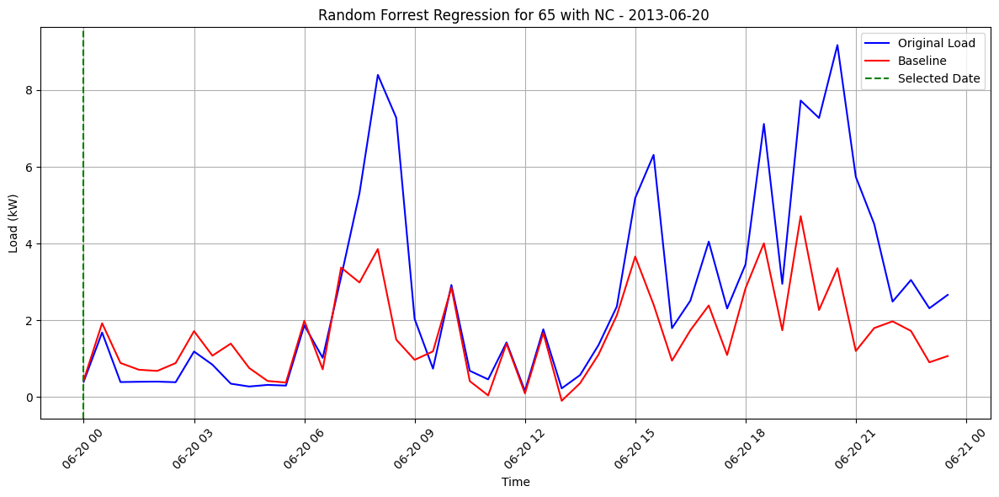

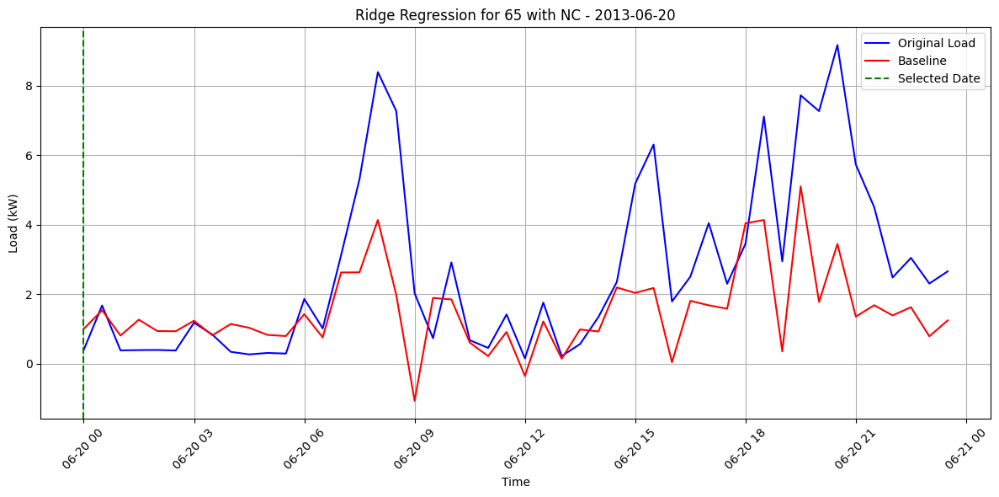

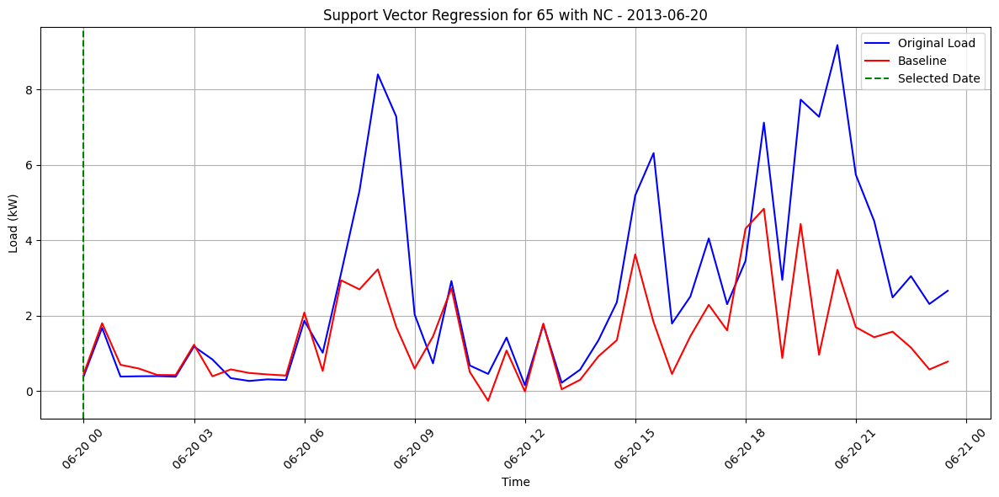

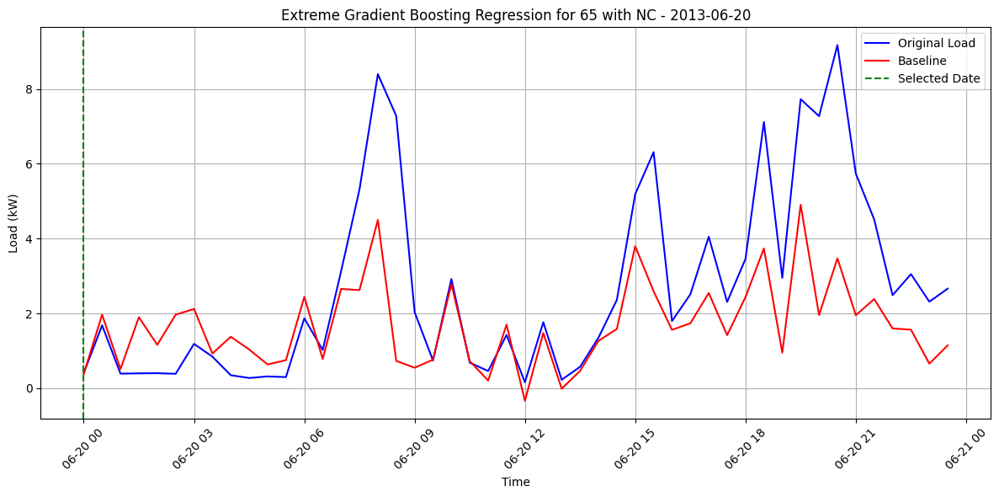

In [1598]:
predictions_rf_H11 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_H11 = predictions_rf_H11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVeval, predictions_rf_H11, "Random Forrest Regression for 65 with NC - 2013-06-20 ",  selected_date_1)

predictions_r_H11 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_H11 = predictions_r_H11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVeval, predictions_r_H11, "Ridge Regression for 65 with NC - 2013-06-20",  selected_date_1)

predictions_svr_H11 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_H11 = predictions_svr_H11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVeval, predictions_svr_H11, "Support Vector Regression for 65 with NC - 2013-06-20",  selected_date_1)

predictions_xgb_H11 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_H11 = predictions_xgb_H11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVeval, predictions_xgb_H11, "Extreme Gradient Boosting Regression for 65 with NC - 2013-06-20",  selected_date_1)


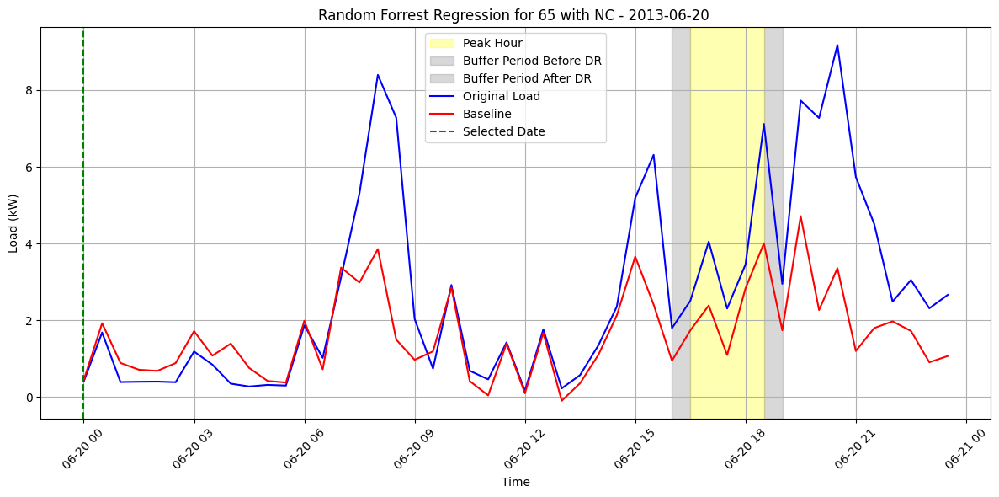

In [1705]:
start_peak_hour = pd.to_datetime('2013-06-20 16:30:00')
end_peak_hour = pd.to_datetime('2013-06-20 18:30:00')
plot_regression_peak(PVeval, predictions_rf_H11, "Random Forrest Regression for 65 with NC - 2013-06-20 ",  selected_date_1, start_peak_hour, end_peak_hour)

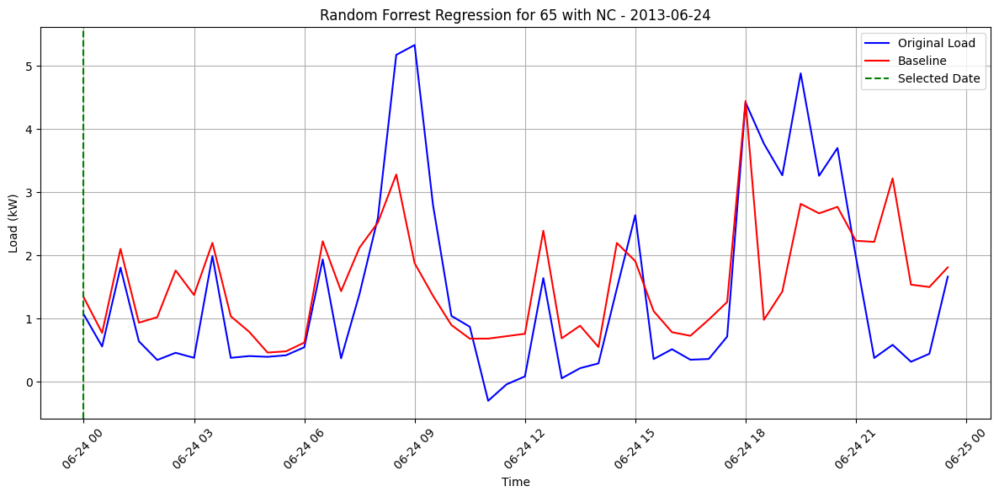

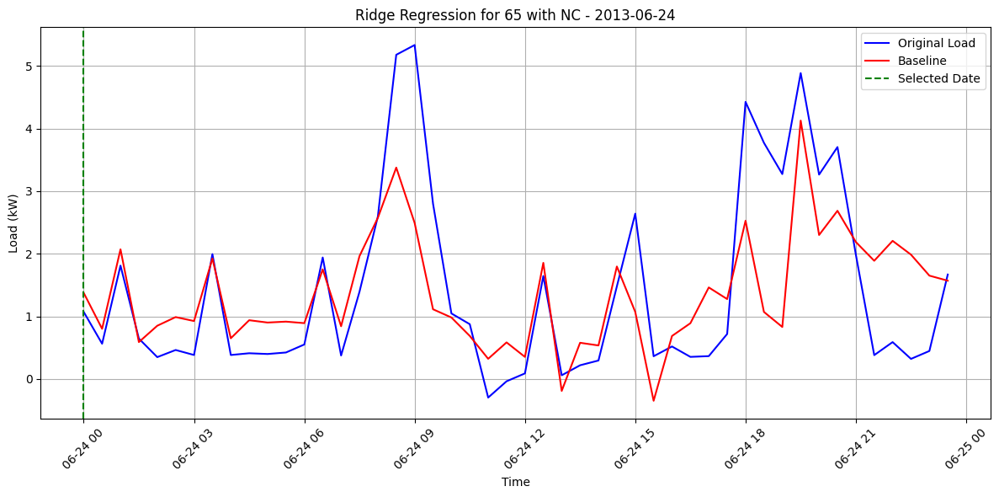

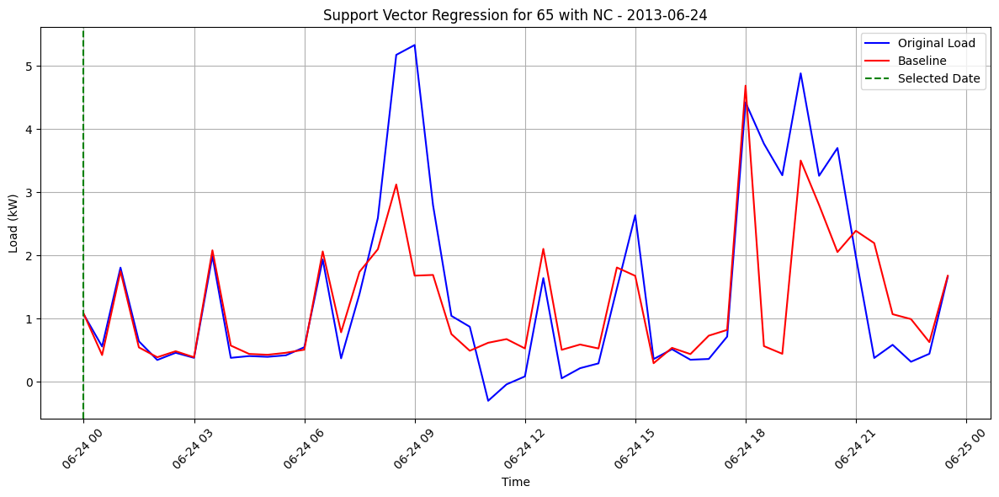

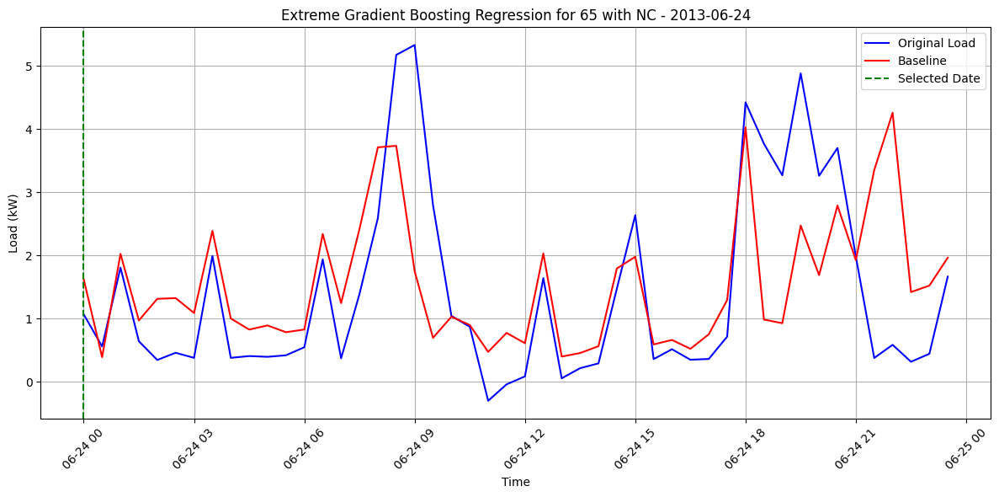

In [1597]:
predictions_rf_H12 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_H12 = predictions_rf_H12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVeval2, predictions_rf_H12, "Random Forrest Regression for 65 with NC - 2013-06-24",  selected_date_2)

predictions_r_H12 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_H12 = predictions_r_H12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVeval2, predictions_r_H12, "Ridge Regression for 65 with NC - 2013-06-24",  selected_date_2)

predictions_svr_H12 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_H12 = predictions_svr_H12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVeval2, predictions_svr_H12, "Support Vector Regression for 65 with NC - 2013-06-24",  selected_date_2)

predictions_xgb_H12 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_H12 = predictions_xgb_H12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVeval2, predictions_xgb_H12, "Extreme Gradient Boosting Regression for 65 with NC - 2013-06-24",  selected_date_2)

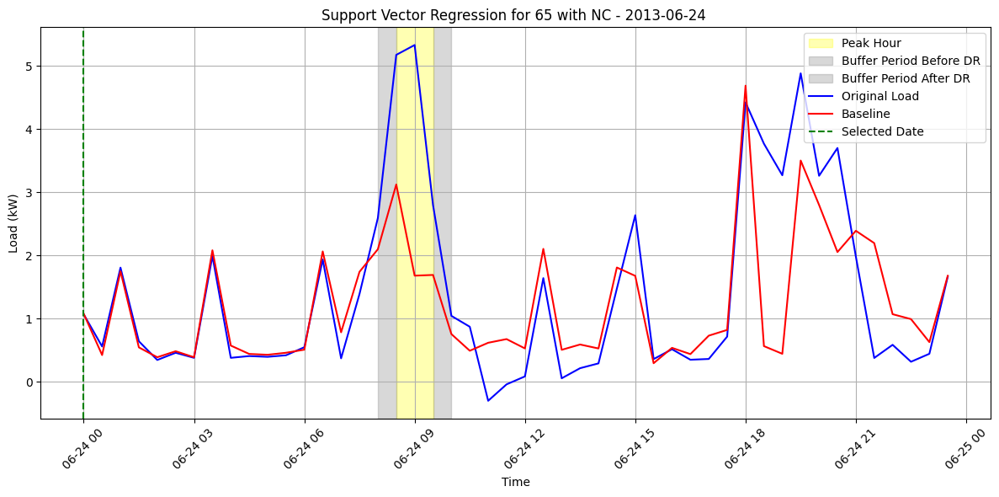

In [1708]:
start_peak_hour = pd.to_datetime('2013-06-24 08:30:00')
end_peak_hour = pd.to_datetime('2013-06-24 09:30:00')
plot_regression_peak(PVeval2, predictions_svr_H12, "Support Vector Regression for 65 with NC - 2013-06-24 ",  selected_date_2, start_peak_hour, end_peak_hour)

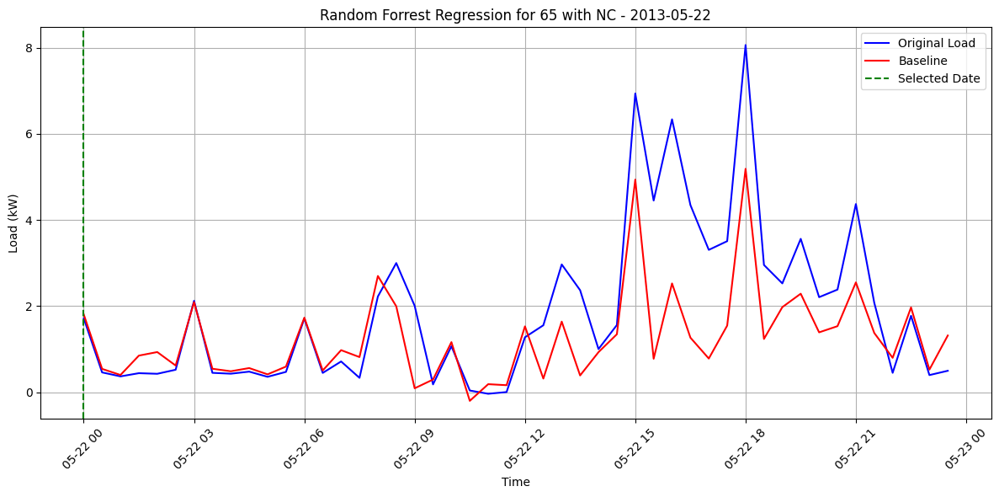

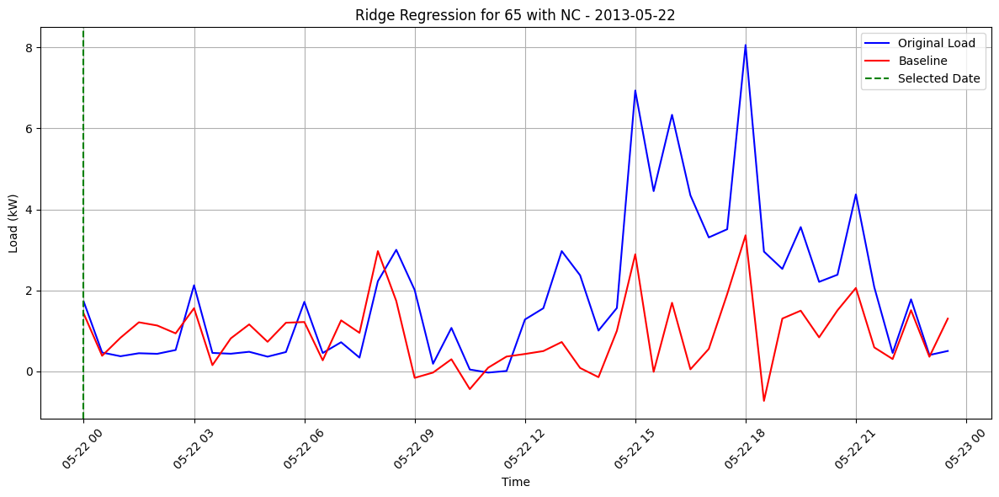

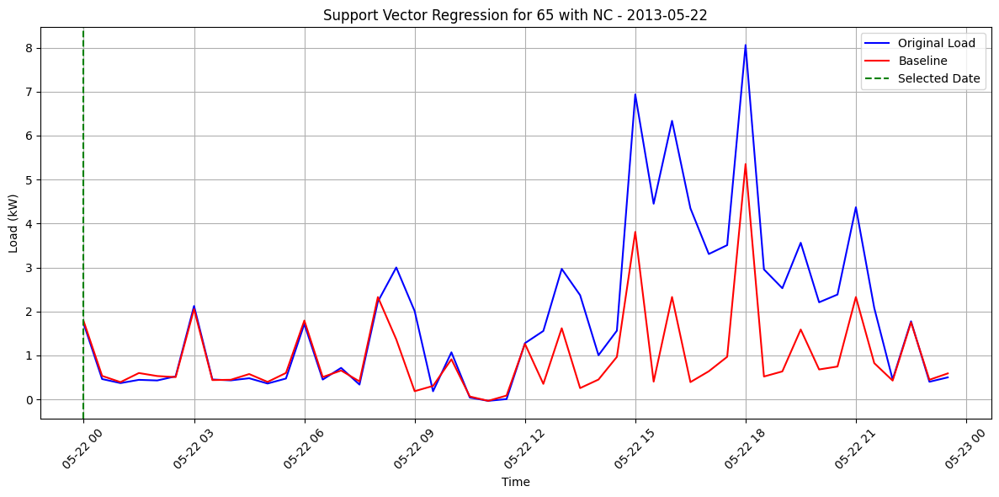

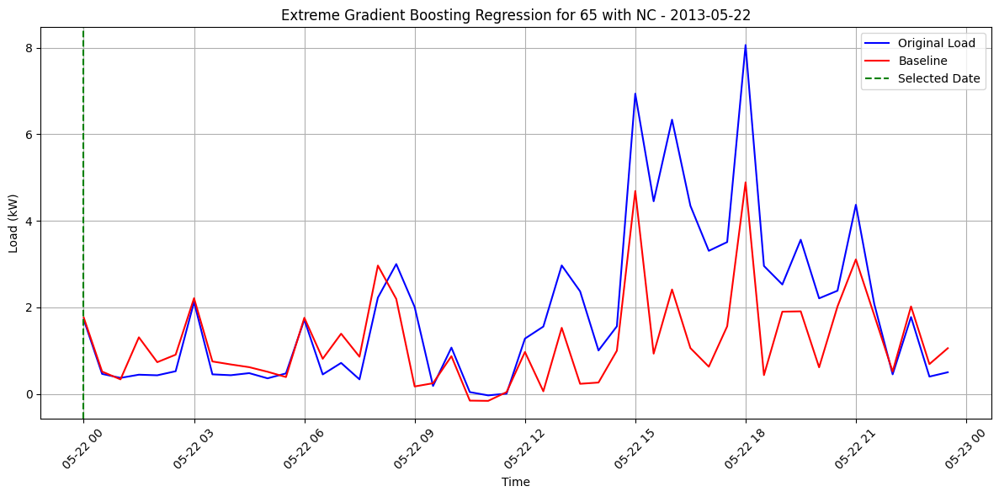

In [1596]:
predictions_rf_H13 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_H13 = predictions_rf_H13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVeval3, predictions_rf_H13, "Random Forrest Regression for 65 with NC - 2013-05-22",  selected_date_3)

predictions_r_H13 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_H13 = predictions_r_H13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVeval3, predictions_r_H13, "Ridge Regression for 65 with NC - 2013-05-22",  selected_date_3)

predictions_svr_H13 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_H13 = predictions_svr_H13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVeval3, predictions_svr_H13, "Support Vector Regression for 65 with NC - 2013-05-22",  selected_date_3)

predictions_xgb_H13 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_H13 = predictions_xgb_H13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVeval3, predictions_xgb_H13, "Extreme Gradient Boosting Regression for 65 with NC - 2013-05-22",  selected_date_3)

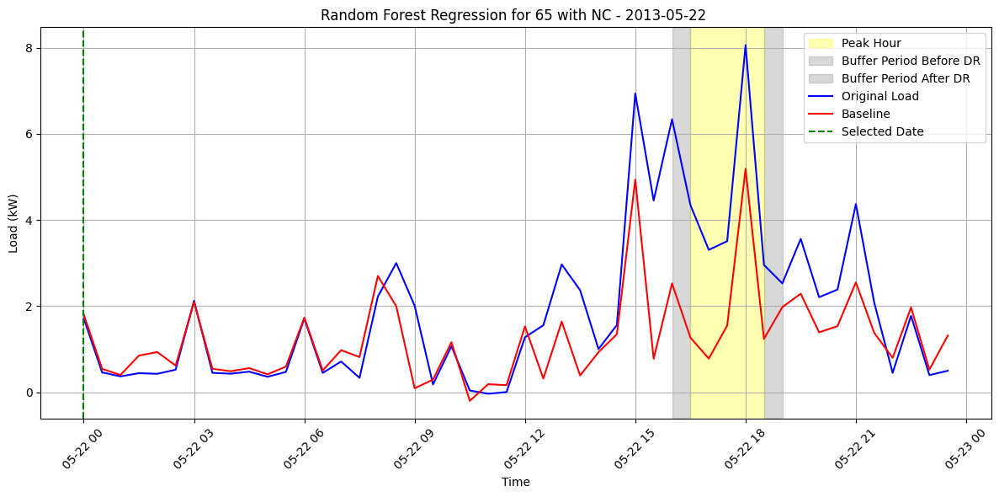

In [1709]:
start_peak_hour = pd.to_datetime('2013-05-22 16:30:00')
end_peak_hour = pd.to_datetime('2013-05-22 18:30:00')
plot_regression_peak(PVeval3, predictions_rf_H13, "Random Forest Regression for 65 with NC - 2013-05-22 ",  selected_date_3, start_peak_hour, end_peak_hour)

ML method - 65 with GC

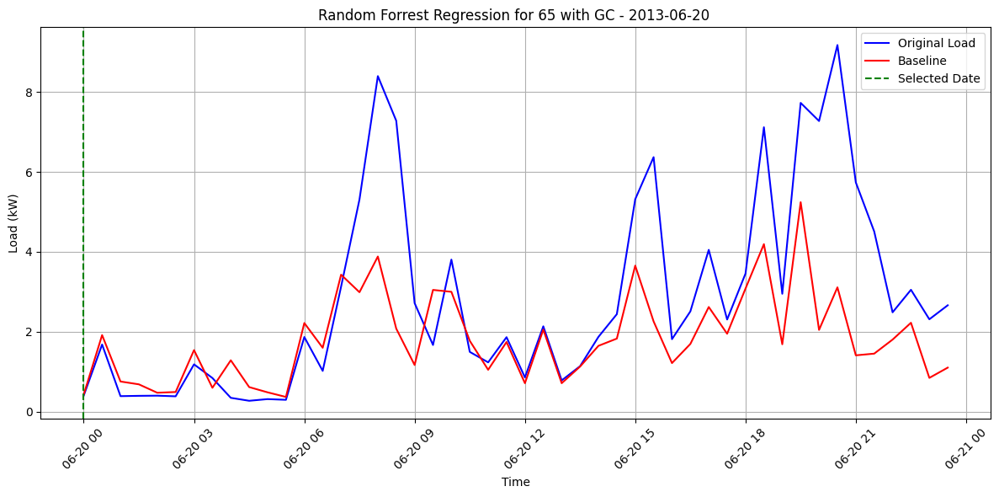

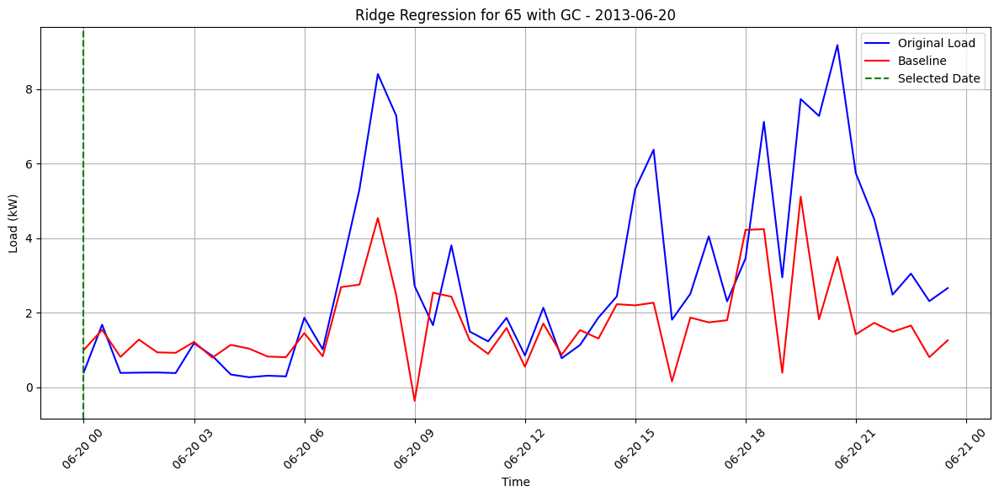

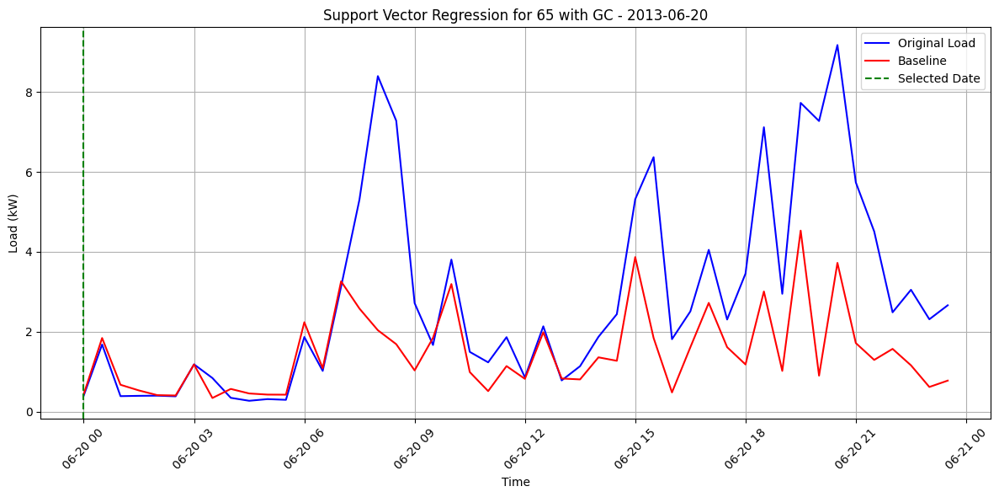

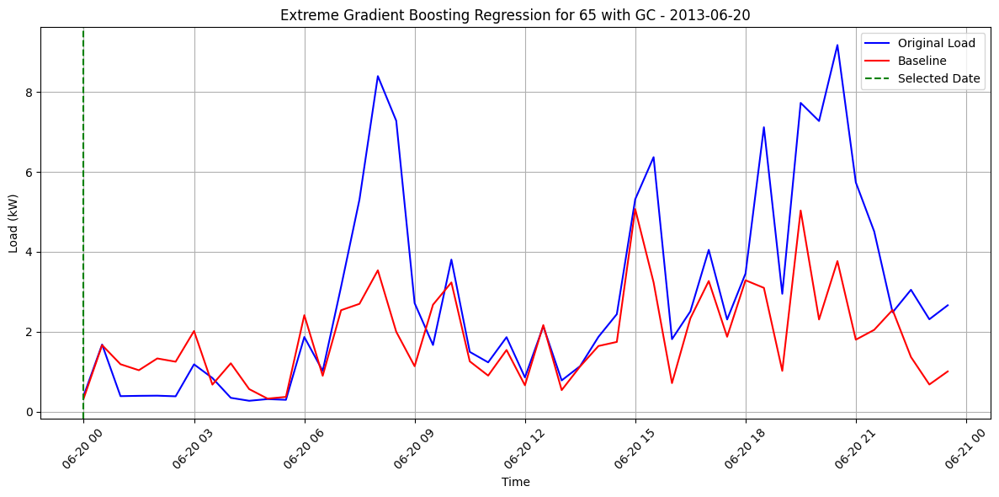

In [1452]:
predictions_rf_nH11 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nH11 = predictions_rf_nH11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVeval, predictions_rf_nH11, "Random Forrest Regression for 65 with GC - 2013-06-20 ",  selected_date_1)

predictions_r_nH11 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nH11 = predictions_r_nH11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVeval, predictions_r_nH11, "Ridge Regression for 65 with GC - 2013-06-20",  selected_date_1)

predictions_svr_nH11 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nH11 = predictions_svr_nH11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVeval, predictions_svr_nH11, "Support Vector Regression for 65 with GC - 2013-06-20",  selected_date_1)

predictions_xgb_nH11 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nH11 = predictions_xgb_nH11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVeval, predictions_xgb_nH11, "Extreme Gradient Boosting Regression for 65 with GC - 2013-06-20",  selected_date_1)


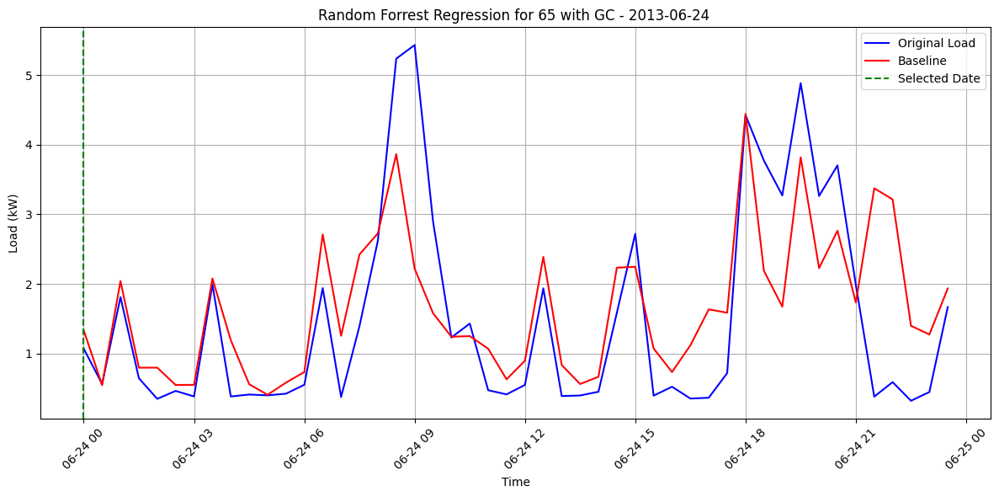

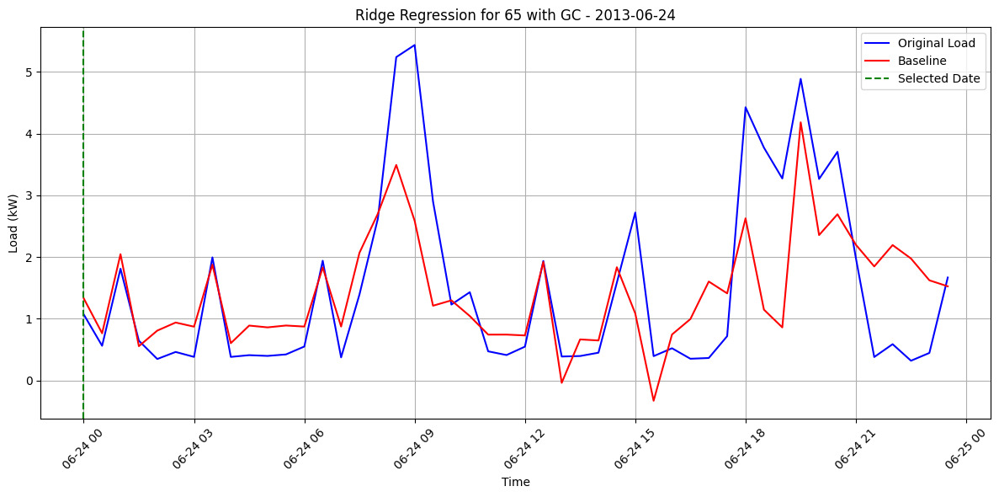

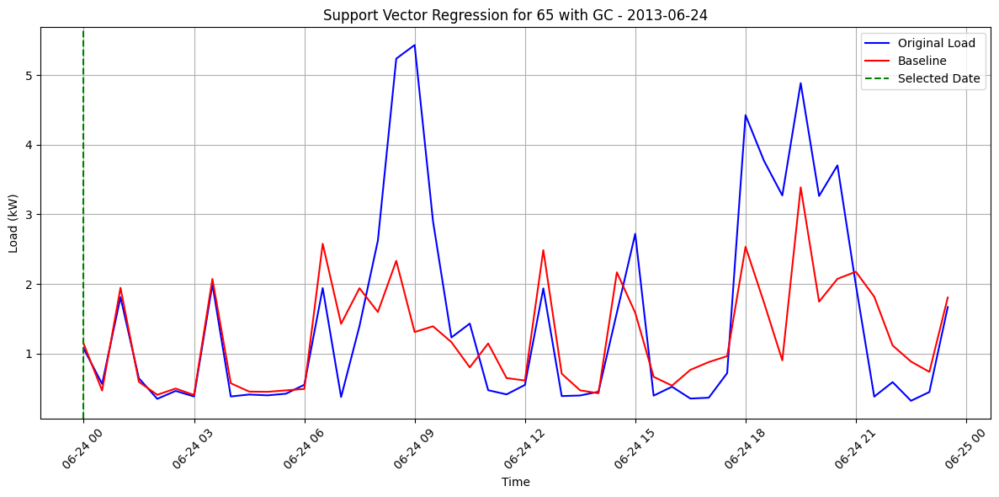

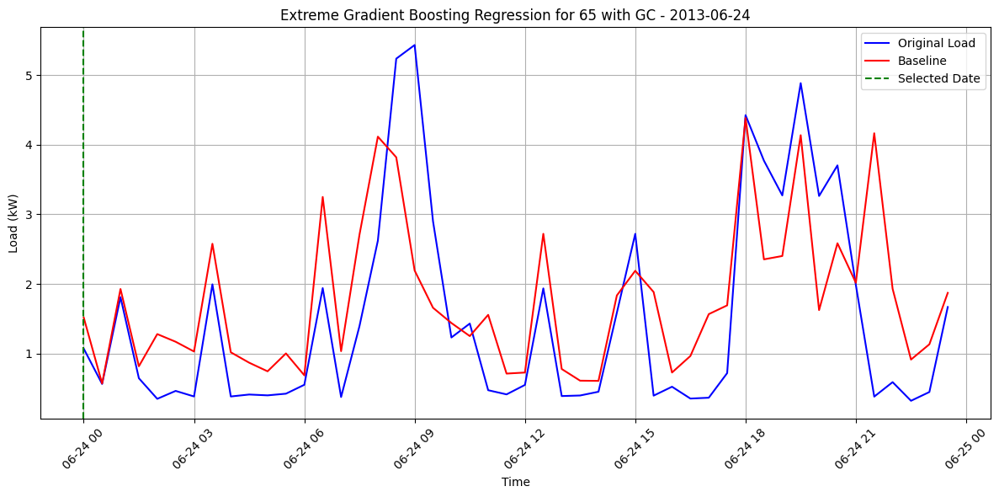

In [1453]:
predictions_rf_nH12 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nH12 = predictions_rf_nH12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVeval2, predictions_rf_nH12, "Random Forrest Regression for 65 with GC - 2013-06-24 ",  selected_date_2)

predictions_r_nH12 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nH12 = predictions_r_nH12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVeval2, predictions_r_nH12, "Ridge Regression for 65 with GC - 2013-06-24",  selected_date_2)

predictions_svr_nH12 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nH12 = predictions_svr_nH12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVeval2, predictions_svr_nH12, "Support Vector Regression for 65 with GC - 2013-06-24",  selected_date_2)

predictions_xgb_nH12 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nH12 = predictions_xgb_nH12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVeval2, predictions_xgb_nH12, "Extreme Gradient Boosting Regression for 65 with GC - 2013-06-24",  selected_date_2)

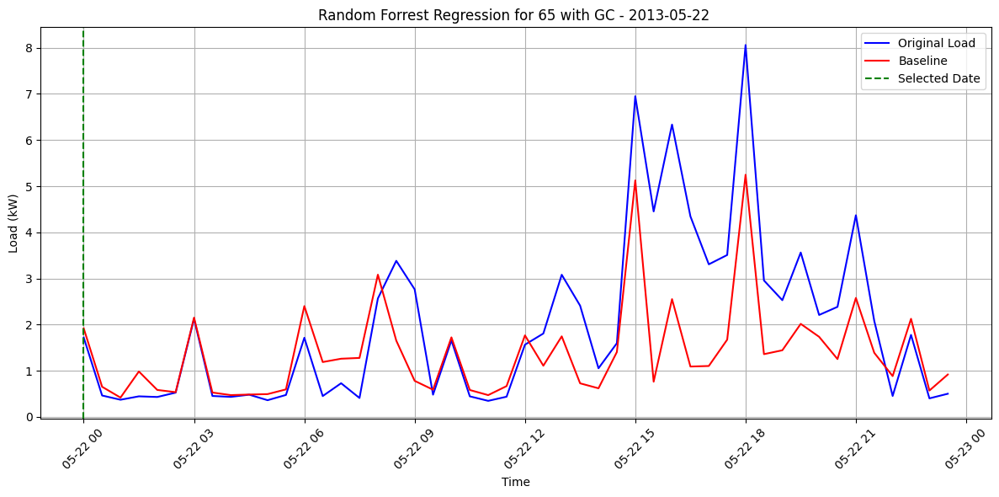

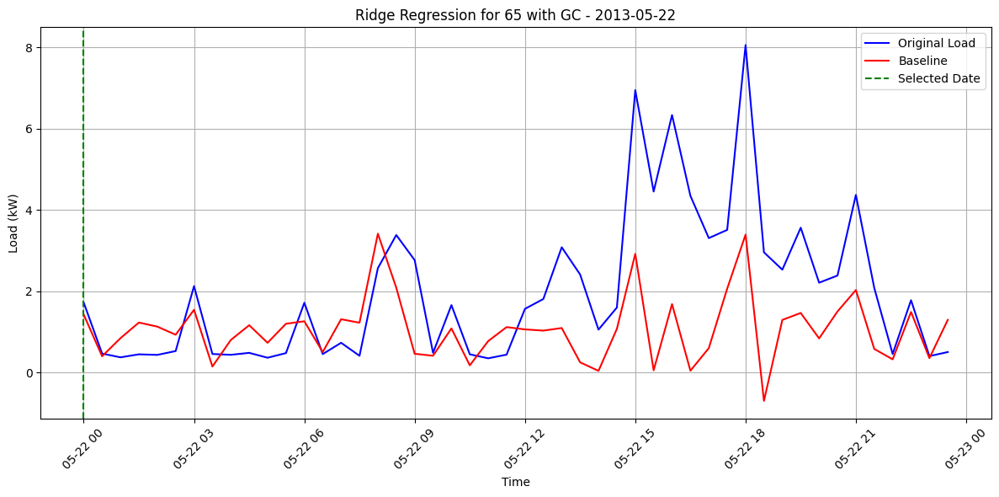

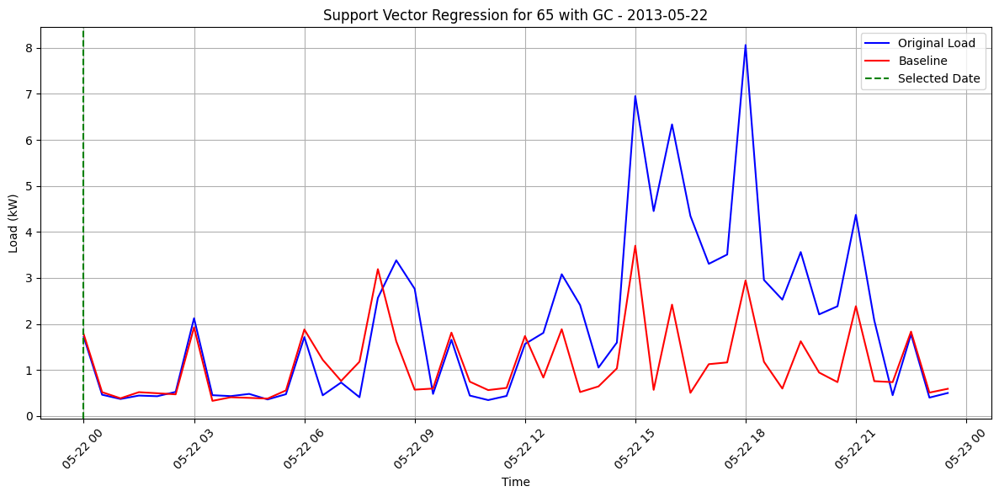

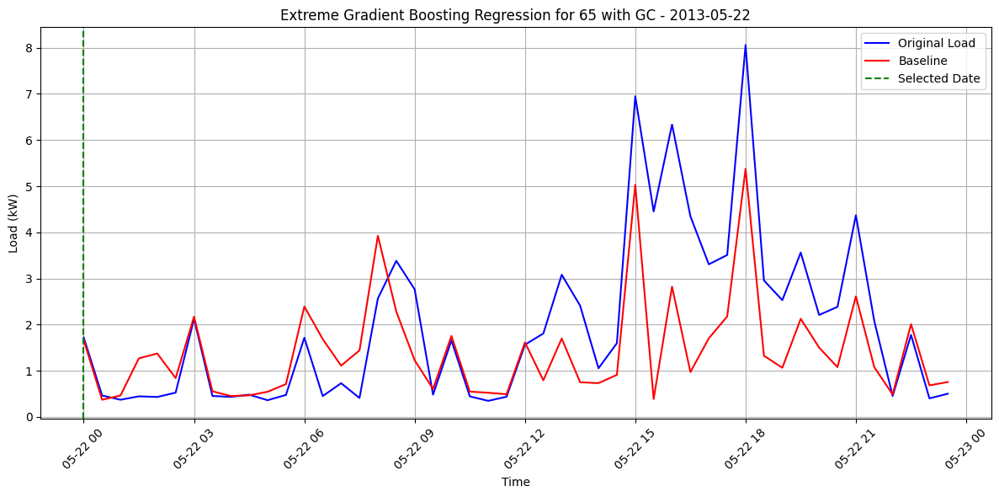

In [1454]:
predictions_rf_nH13 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nH13 = predictions_rf_nH13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVeval3, predictions_rf_nH13, "Random Forrest Regression for 65 with GC - 2013-05-22 ",  selected_date_3)

predictions_r_nH13 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nH13 = predictions_r_nH13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVeval3, predictions_r_nH13, "Ridge Regression for 65 with GC - 2013-05-22",  selected_date_3)

predictions_svr_nH13 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nH13 = predictions_svr_nH13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVeval3, predictions_svr_nH13, "Support Vector Regression for 65 with GC - 2013-05-22",  selected_date_3)

predictions_xgb_nH13 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nH13 = predictions_xgb_nH13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVeval3, predictions_xgb_nH13, "Extreme Gradient Boosting Regression for 65 with GC - 2013-05-22",  selected_date_3)

ML Method - 209 with NC

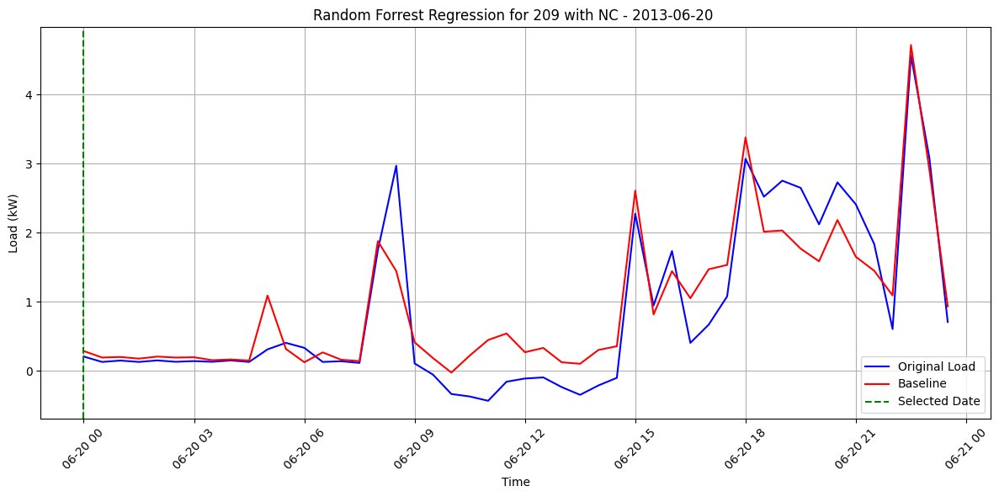

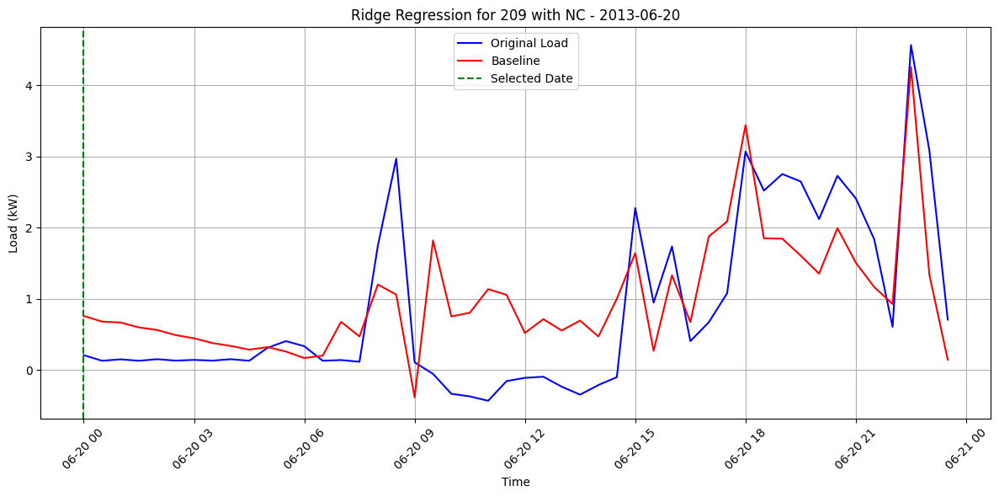

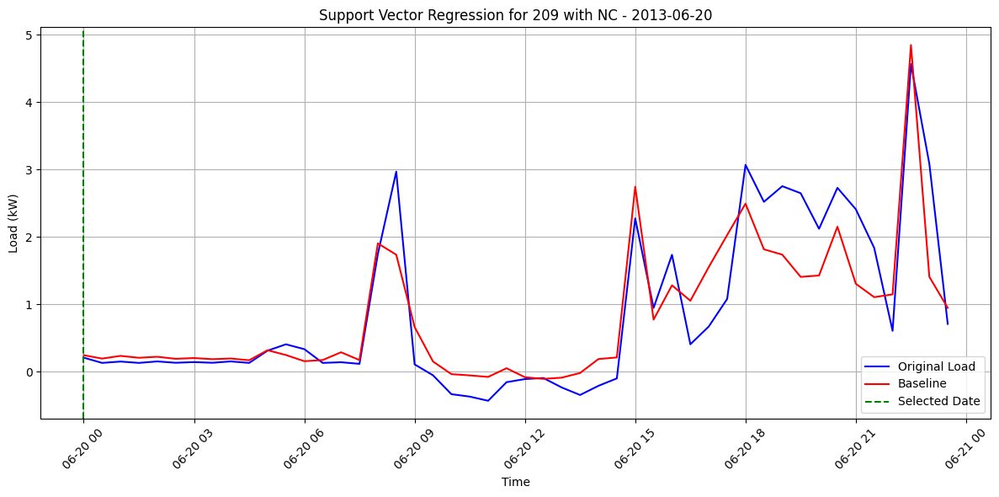

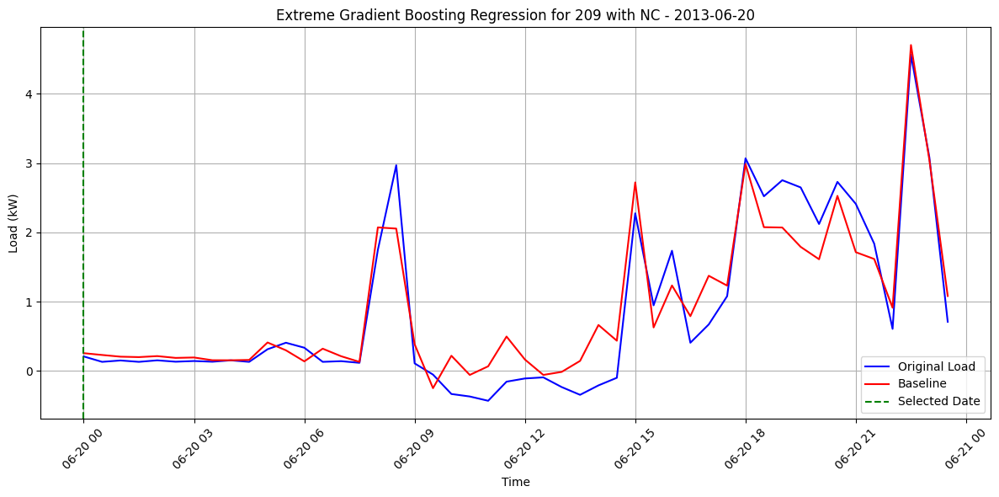

In [1490]:
predictions_rf_H31 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_H31 = predictions_rf_H31.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVevalh3, predictions_rf_H31, "Random Forrest Regression for 209 with NC - 2013-06-20 ",  selected_date_1)

predictions_r_H31 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_H31 = predictions_r_H31.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVevalh3, predictions_r_H31, "Ridge Regression for 209 with NC - 2013-06-20",  selected_date_1)

predictions_svr_H31 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_H31 = predictions_svr_H31.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVevalh3, predictions_svr_H31, "Support Vector Regression for 209 with NC - 2013-06-20",  selected_date_1)

predictions_xgb_H31 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_H31 = predictions_xgb_H31.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVevalh3, predictions_xgb_H31, "Extreme Gradient Boosting Regression for 209 with NC - 2013-06-20",  selected_date_1)



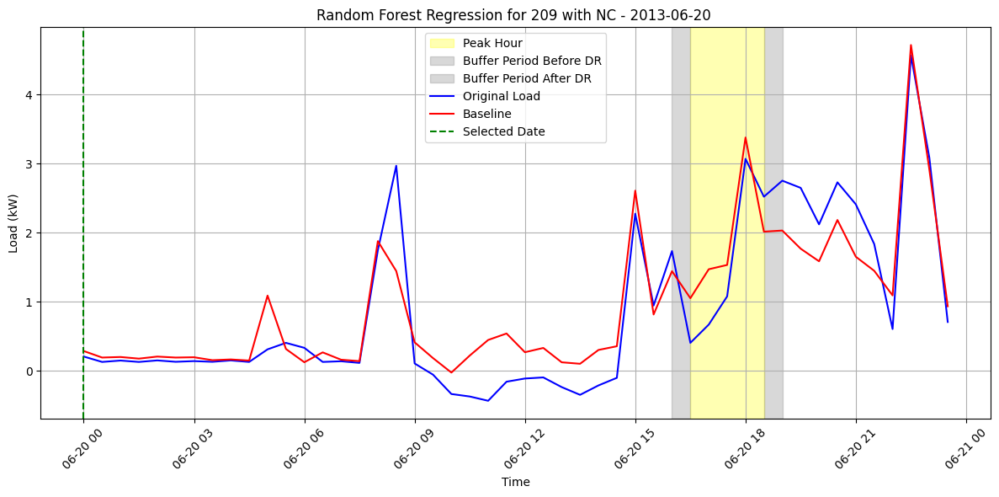

In [1710]:
start_peak_hour = pd.to_datetime('2013-06-20 16:30:00')
end_peak_hour = pd.to_datetime('2013-06-20 18:30:00')
plot_regression_peak(PVevalh3, predictions_rf_H31, "Random Forest Regression for 209 with NC - 2013-06-20 ",  selected_date_1, start_peak_hour, end_peak_hour)

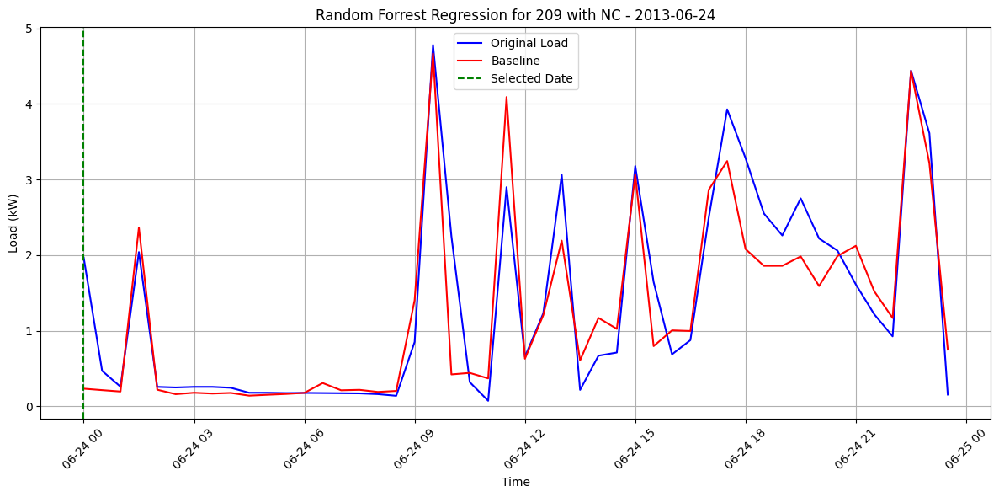

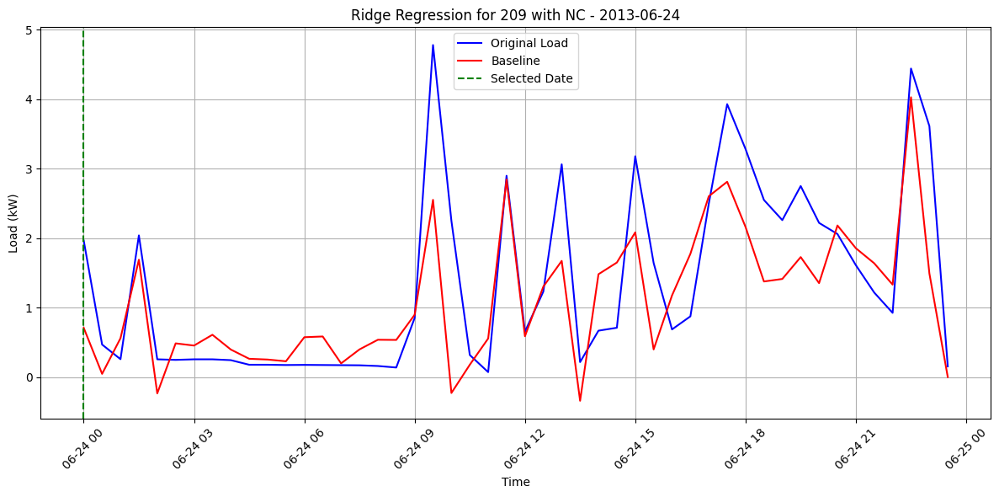

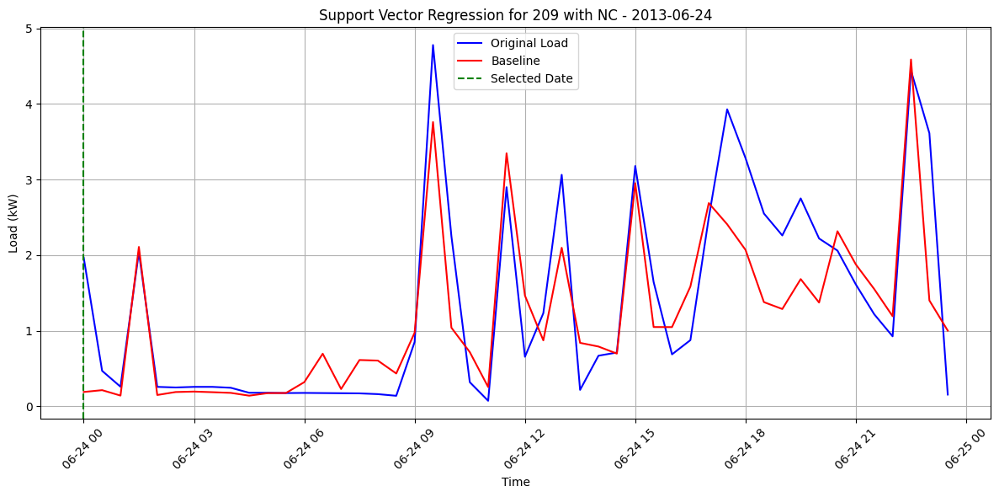

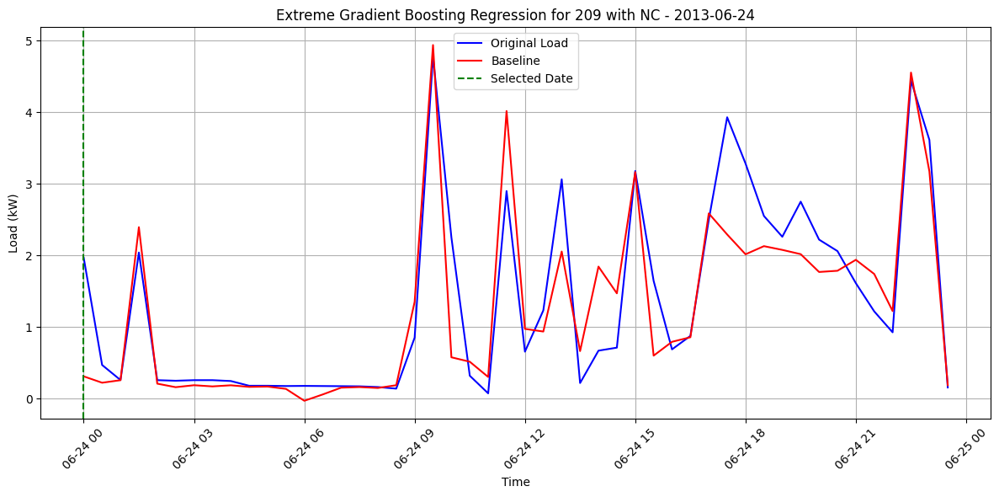

In [1491]:
predictions_rf_H32 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_H32 = predictions_rf_H32.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVevalh3_2, predictions_rf_H32, "Random Forrest Regression for 209 with NC - 2013-06-24",  selected_date_2)

predictions_r_H32 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_H32 = predictions_r_H32.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVevalh3_2, predictions_r_H32, "Ridge Regression for 209 with NC - 2013-06-24",  selected_date_2)

predictions_svr_H32 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_H32 = predictions_svr_H32.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVevalh3_2, predictions_svr_H32, "Support Vector Regression for 209 with NC - 2013-06-24",  selected_date_2)

predictions_xgb_H32 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_H32 = predictions_xgb_H32.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVevalh3_2, predictions_xgb_H32, "Extreme Gradient Boosting Regression for 209 with NC - 2013-06-24",  selected_date_2)

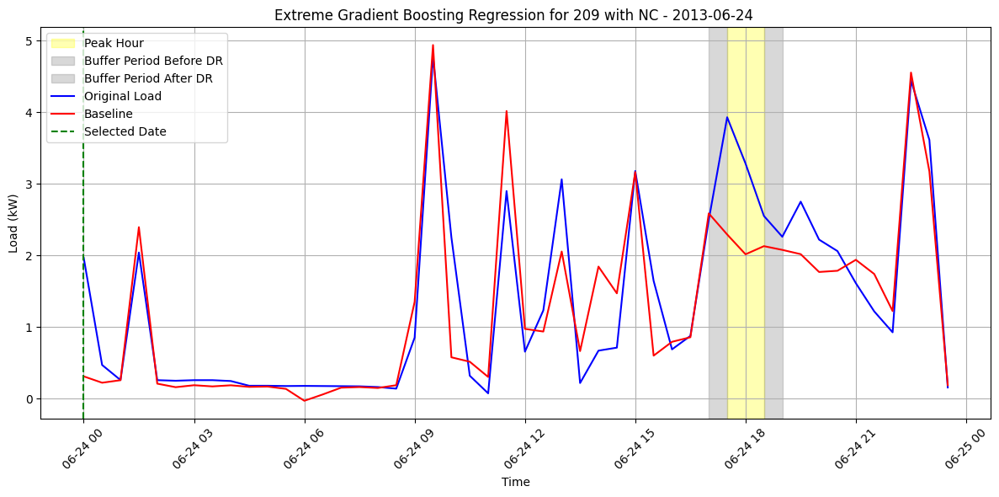

In [1713]:
start_peak_hour = pd.to_datetime('2013-06-24 17:30:00')
end_peak_hour = pd.to_datetime('2013-06-24 18:30:00')
plot_regression_peak(PVevalh3_2, predictions_xgb_H32, "Extreme Gradient Boosting Regression for 209 with NC - 2013-06-24 ",  selected_date_2, start_peak_hour, end_peak_hour)

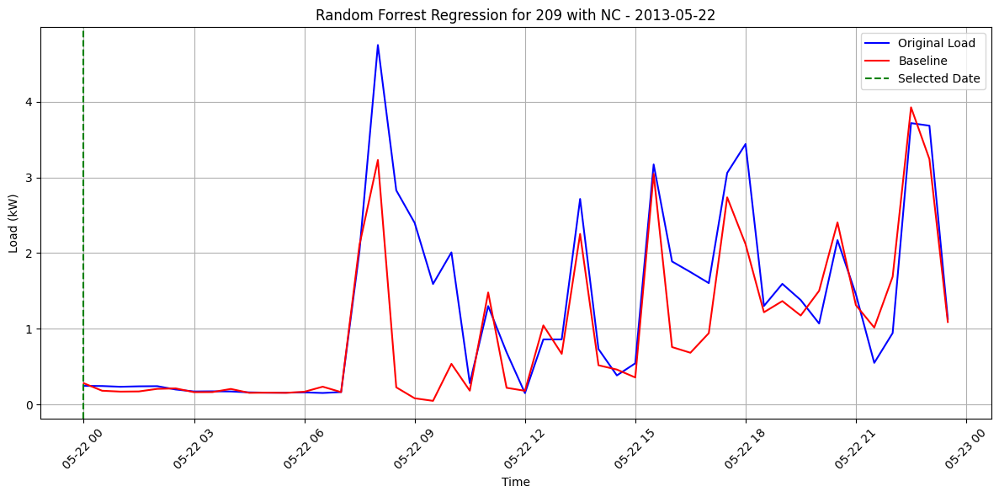

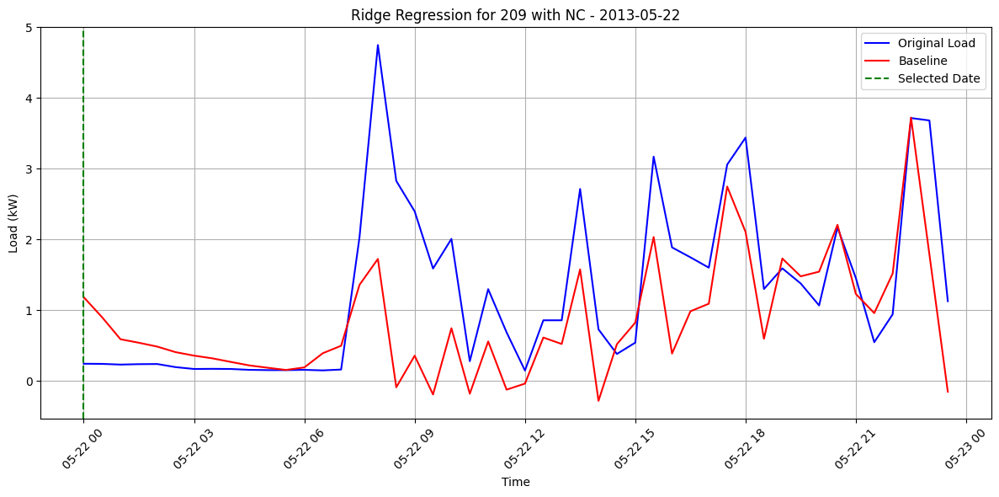

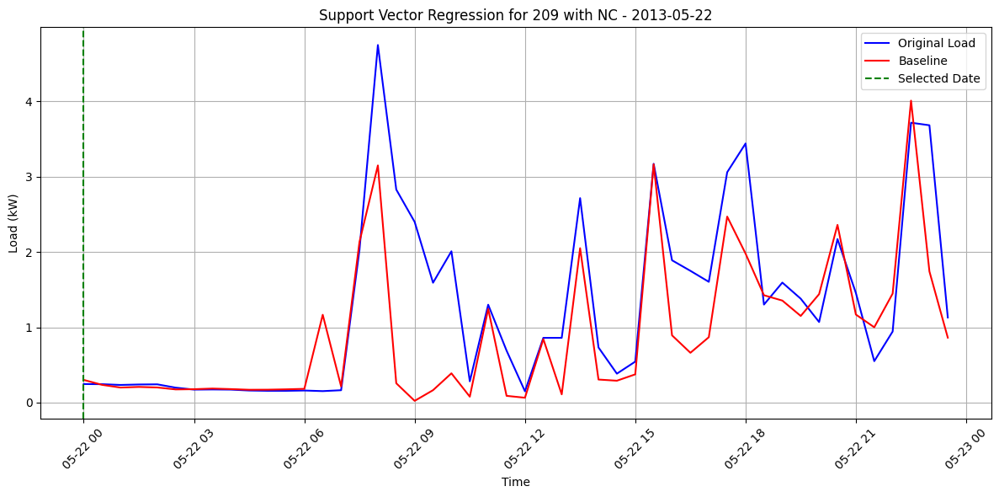

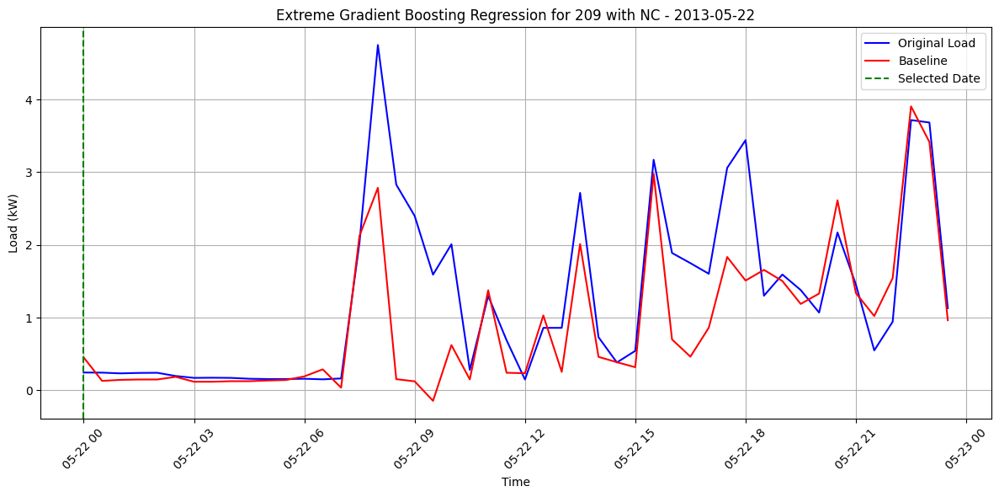

In [1492]:
predictions_rf_H33 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_H33 = predictions_rf_H33.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVevalh3_3, predictions_rf_H33, "Random Forrest Regression for 209 with NC - 2013-05-22",  selected_date_3)

predictions_r_H33 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_H33 = predictions_r_H33.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVevalh3_3, predictions_r_H33, "Ridge Regression for 209 with NC - 2013-05-22",  selected_date_3)

predictions_svr_H33 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_H33 = predictions_svr_H33.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVevalh3_3, predictions_svr_H33, "Support Vector Regression for 209 with NC - 2013-05-22",  selected_date_3)

predictions_xgb_H33 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_H33 = predictions_xgb_H33.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVevalh3_3, predictions_xgb_H33, "Extreme Gradient Boosting Regression for 209 with NC - 2013-05-22",  selected_date_3)

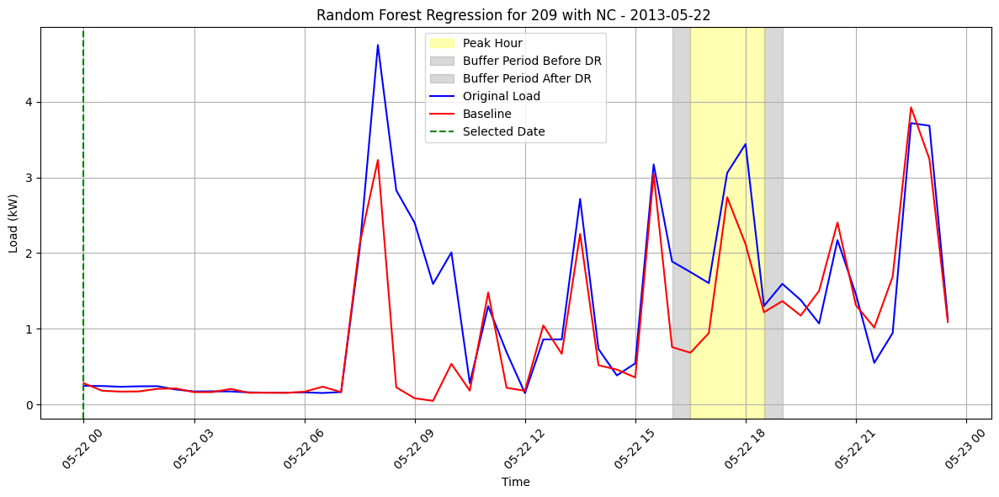

In [1714]:
start_peak_hour = pd.to_datetime('2013-06-20 16:30:00')
end_peak_hour = pd.to_datetime('2013-06-20 18:30:00')
plot_regression_peak(PVevalh3_3, predictions_rf_H33, "Random Forest Regression for 209 with NC - 2013-05-22 ",  selected_date_3, start_peak_hour, end_peak_hour)

ML Method - 209 with GC

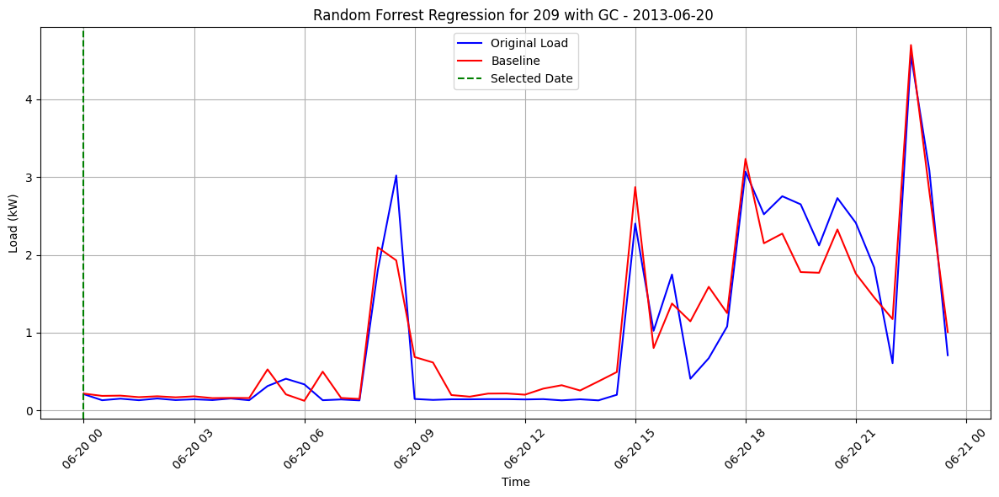

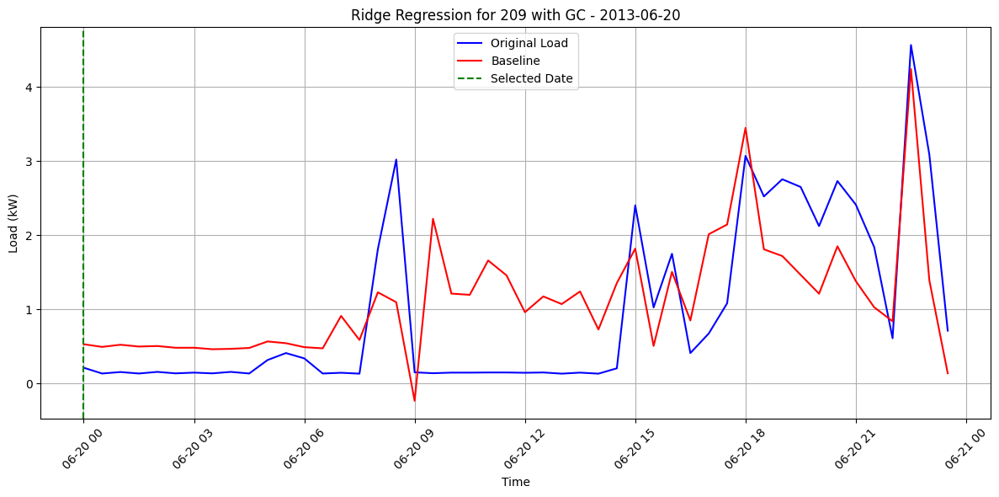

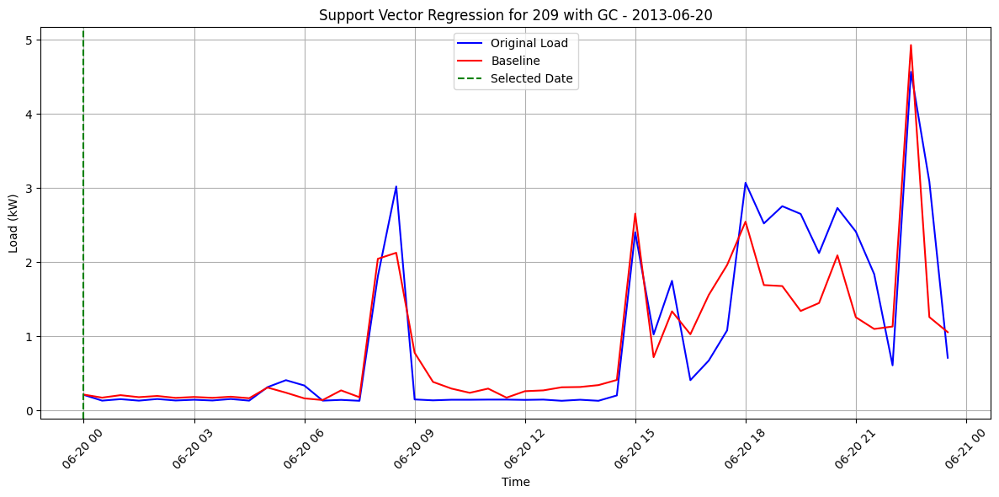

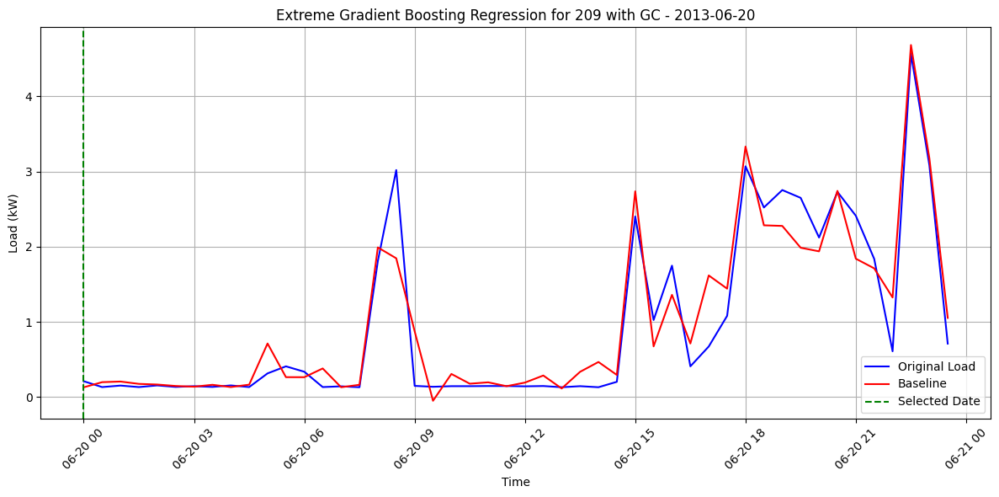

In [1530]:
predictions_rf_nH31 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nH31 = predictions_rf_nH31.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3, predictions_rf_nH31, "Random Forrest Regression for 209 with GC - 2013-06-20 ",  selected_date_1)

predictions_r_nH31 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nH31 = predictions_r_nH31.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3, predictions_r_nH31, "Ridge Regression for 209 with GC - 2013-06-20",  selected_date_1)

predictions_svr_nH31 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nH31 = predictions_svr_nH31.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3, predictions_svr_nH31, "Support Vector Regression for 209 with GC - 2013-06-20",  selected_date_1)

predictions_xgb_nH31 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nH31 = predictions_xgb_nH31.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3, predictions_xgb_nH31, "Extreme Gradient Boosting Regression for 209 with GC - 2013-06-20",  selected_date_1)



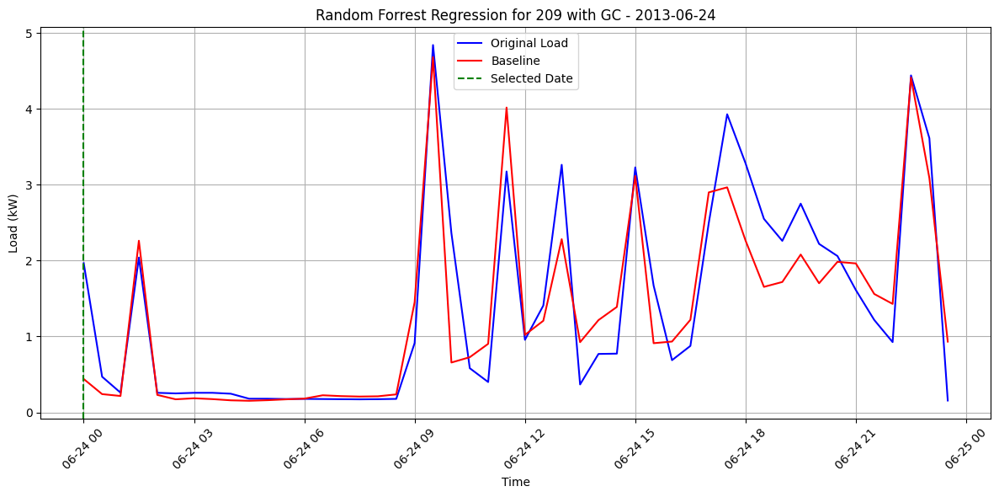

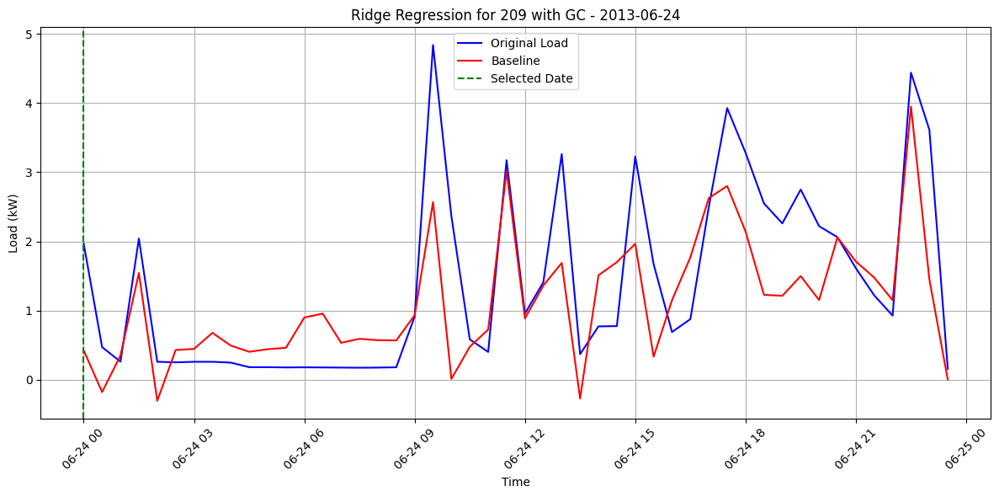

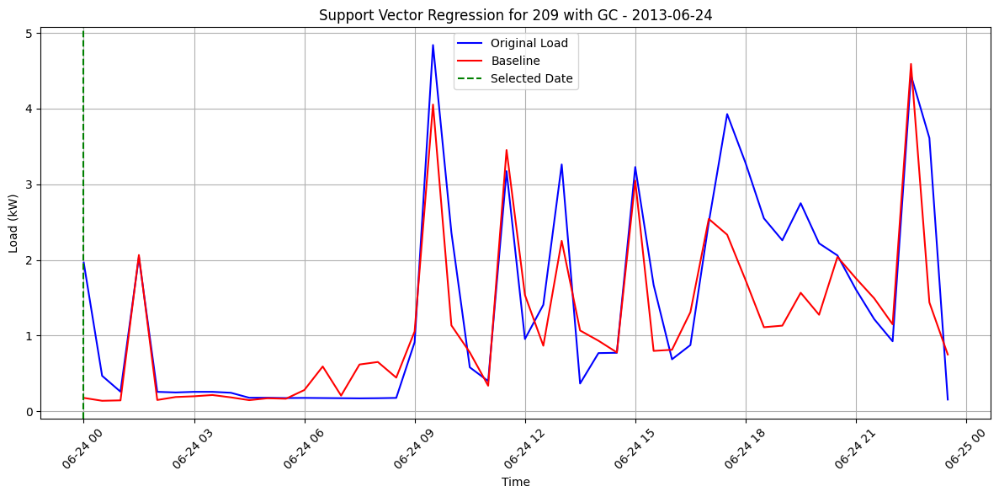

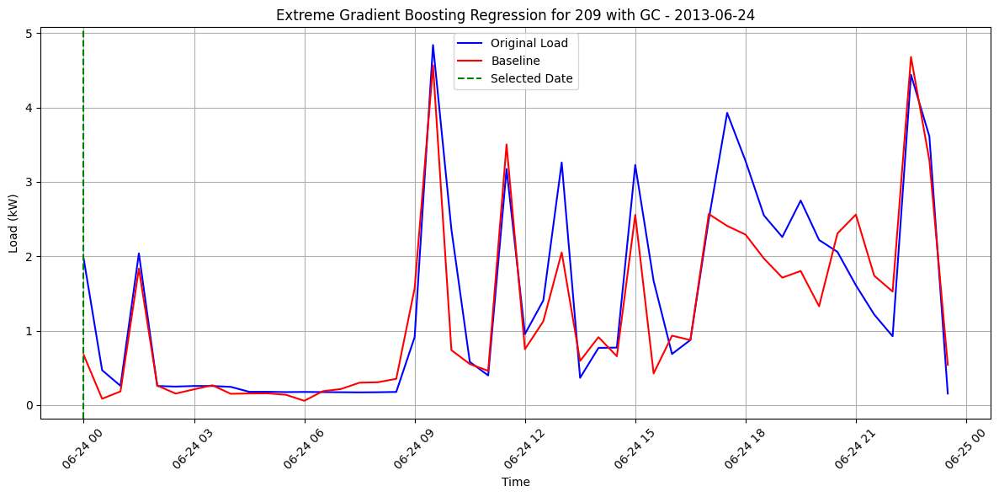

In [1533]:
predictions_rf_nH32 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nH32 = predictions_rf_nH32.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3_2, predictions_rf_nH32, "Random Forrest Regression for 209 with GC - 2013-06-24",  selected_date_2)

predictions_r_nH32 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nH32 = predictions_r_nH32.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3_2, predictions_r_nH32, "Ridge Regression for 209 with GC - 2013-06-24",  selected_date_2)

predictions_svr_nH32 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nH32 = predictions_svr_nH32.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3_2, predictions_svr_nH32, "Support Vector Regression for 209 with GC - 2013-06-24",  selected_date_2)

predictions_xgb_nH32 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nH32 = predictions_xgb_nH32.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3_2, predictions_xgb_nH32, "Extreme Gradient Boosting Regression for 209 with GC - 2013-06-24",  selected_date_2)

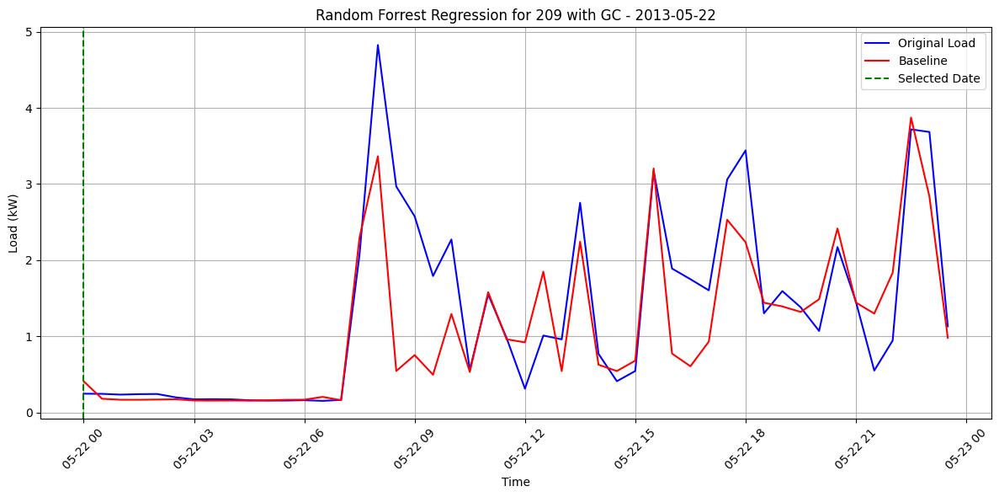

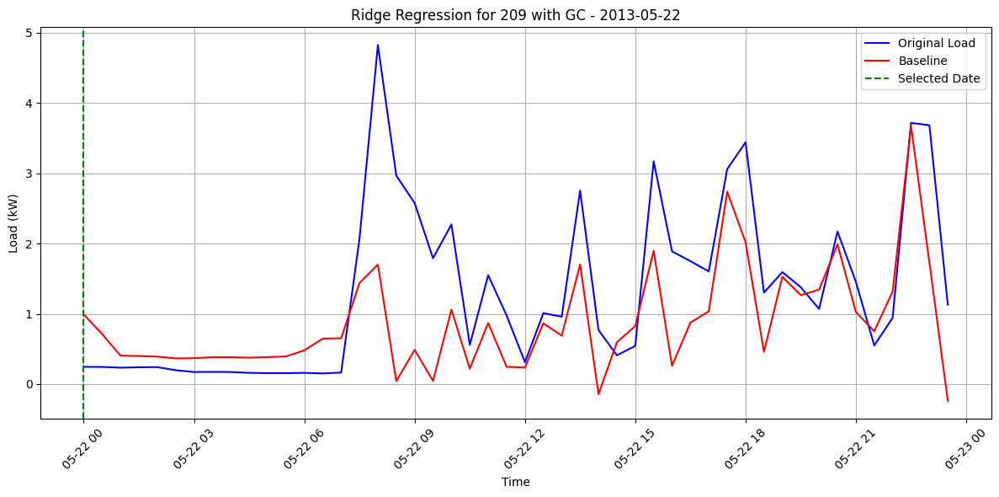

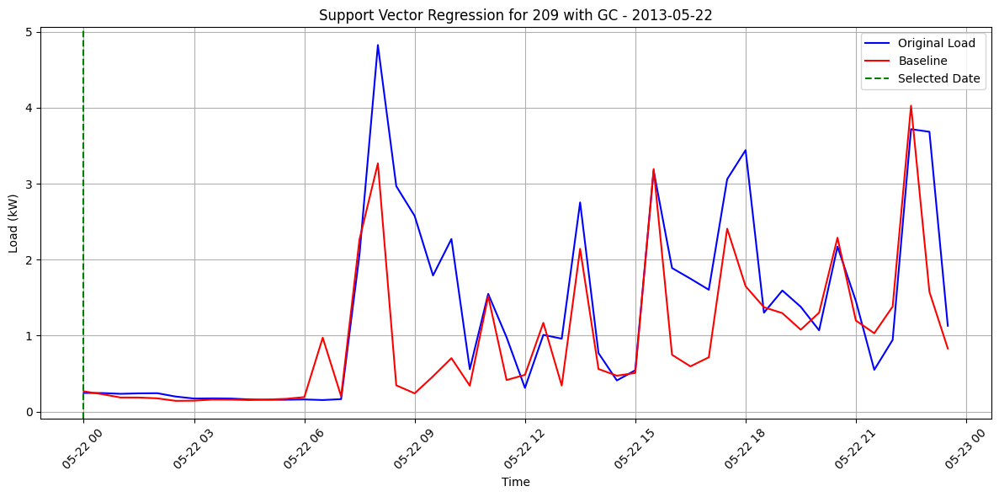

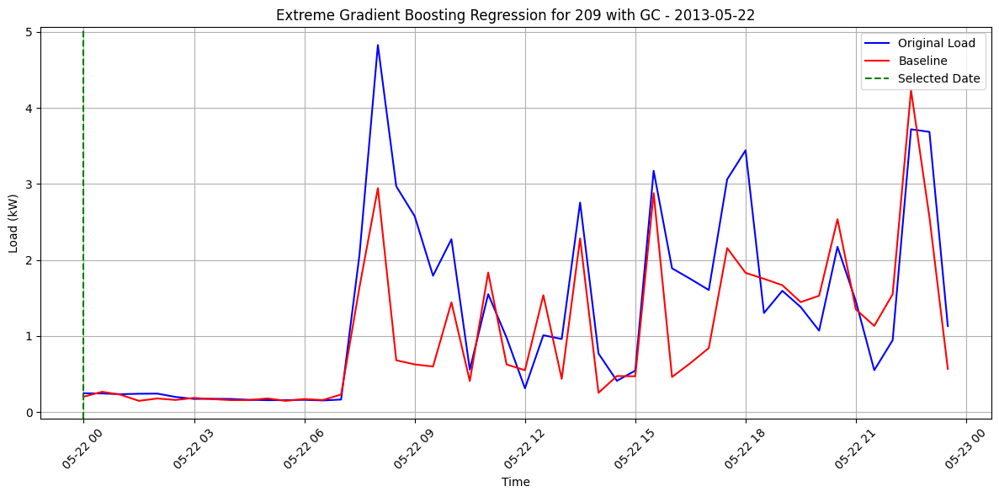

In [1534]:
predictions_rf_nH33 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nH33 = predictions_rf_nH33.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3_3, predictions_rf_nH33, "Random Forrest Regression for 209 with GC - 2013-05-22",  selected_date_3)

predictions_r_nH33 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nH33 = predictions_r_nH33.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3_3, predictions_r_nH33, "Ridge Regression for 209 with GC - 2013-05-22",  selected_date_3)

predictions_svr_nH33 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nH33 = predictions_svr_nH33.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3_3, predictions_svr_nH33, "Support Vector Regression for 209 with GC - 2013-05-22",  selected_date_3)

predictions_xgb_nH33 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nH33 = predictions_xgb_nH33.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVevalh3_3, predictions_xgb_nH33, "Extreme Gradient Boosting Regression for 209 with GC - 2013-05-22",  selected_date_3)

ML - 174 with NC

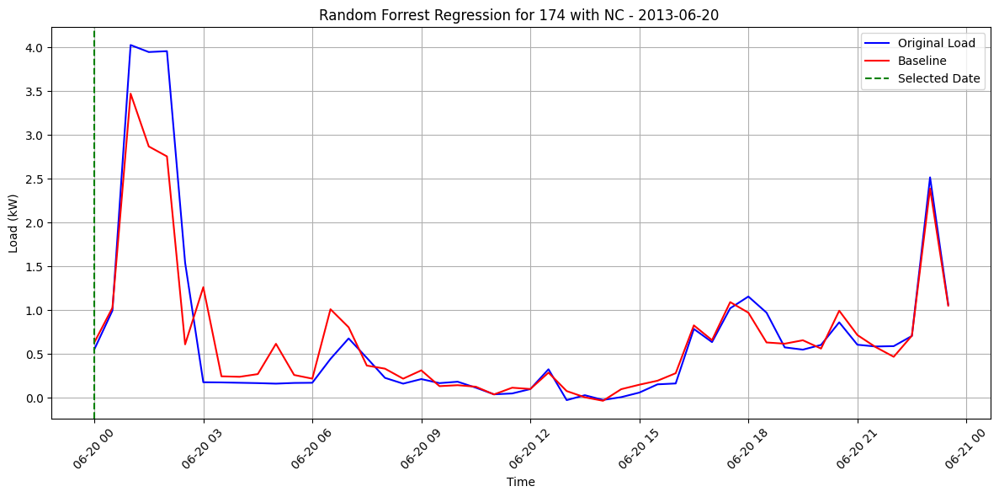

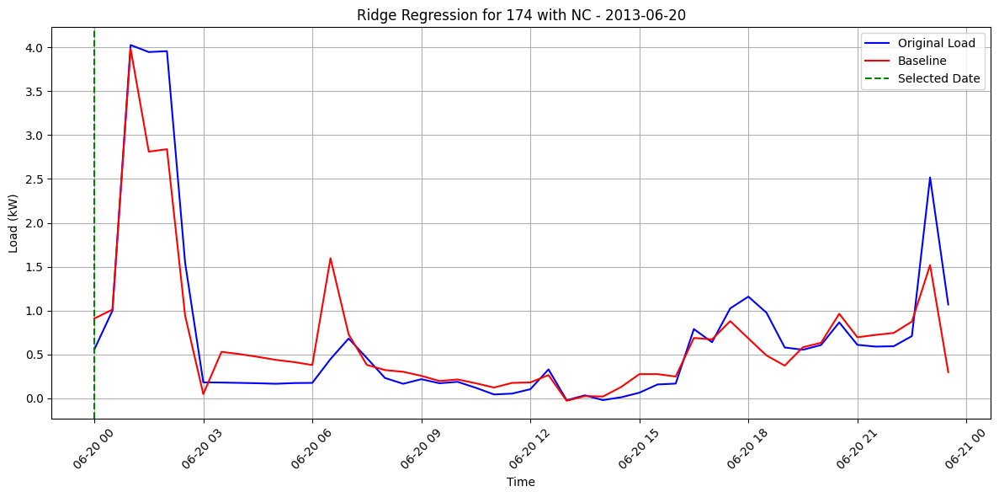

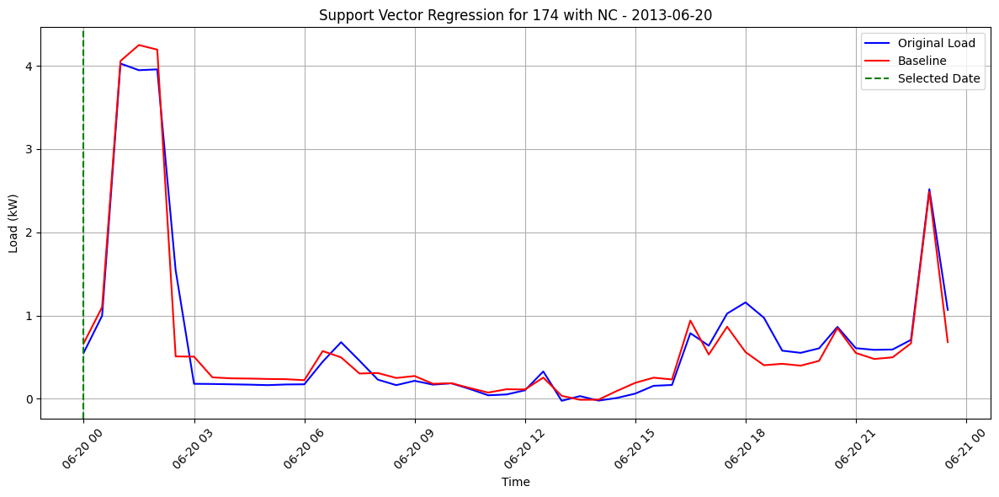

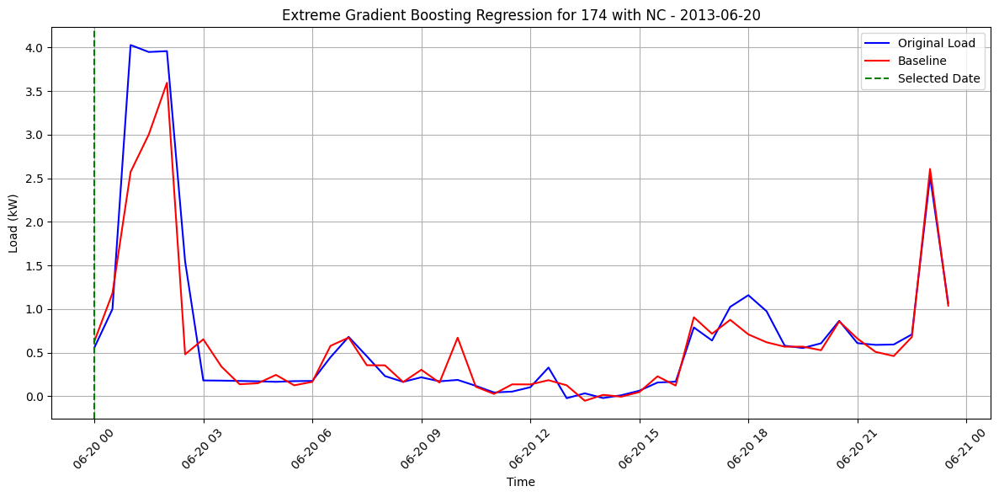

In [1550]:
predictions_rf_L11 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_L11 = predictions_rf_L11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVevall1, predictions_rf_L11, "Random Forrest Regression for 174 with NC - 2013-06-20 ",  selected_date_1)

predictions_r_L11 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_L11 = predictions_r_L11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVevall1, predictions_r_L11, "Ridge Regression for 174 with NC - 2013-06-20",  selected_date_1)

predictions_svr_L11 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_L11 = predictions_svr_L11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVevall1, predictions_svr_L11, "Support Vector Regression for 174 with NC - 2013-06-20",  selected_date_1)

predictions_xgb_L11 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_L11 = predictions_xgb_L11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(PVevall1, predictions_xgb_L11, "Extreme Gradient Boosting Regression for 174 with NC - 2013-06-20",  selected_date_1)



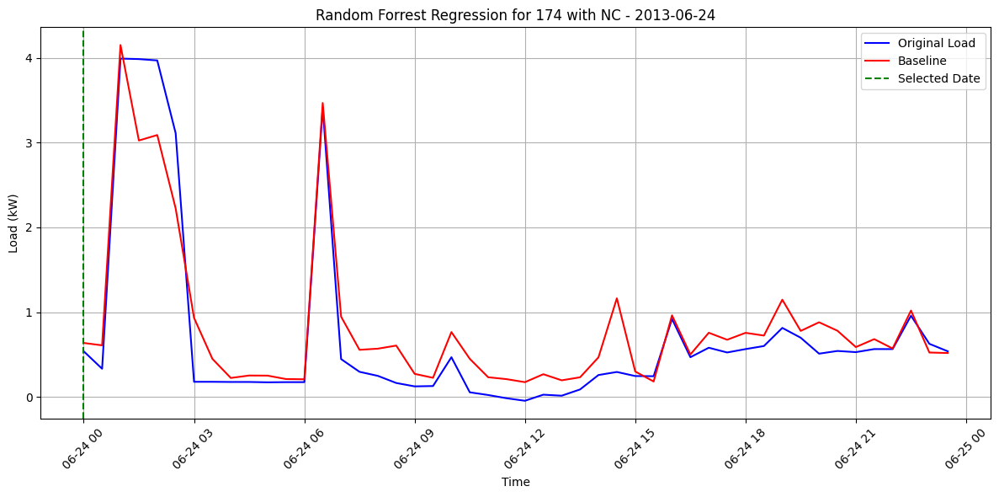

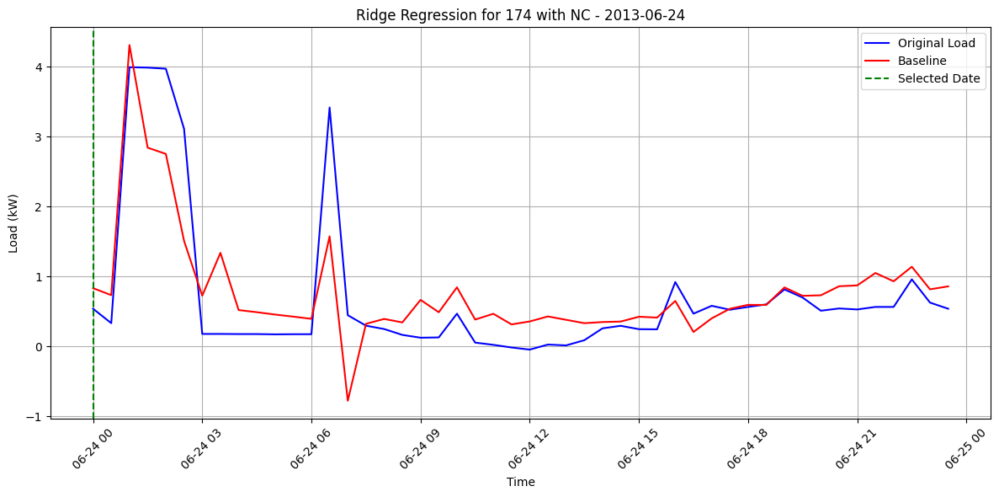

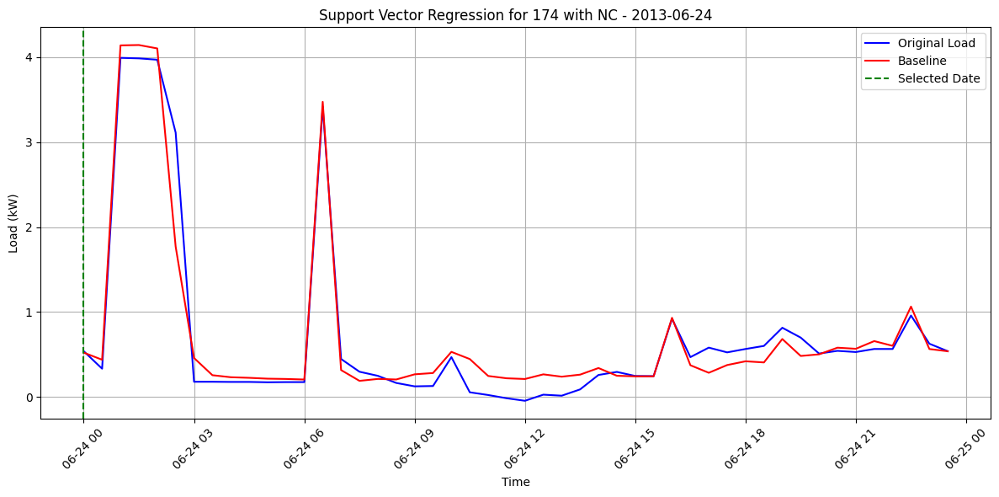

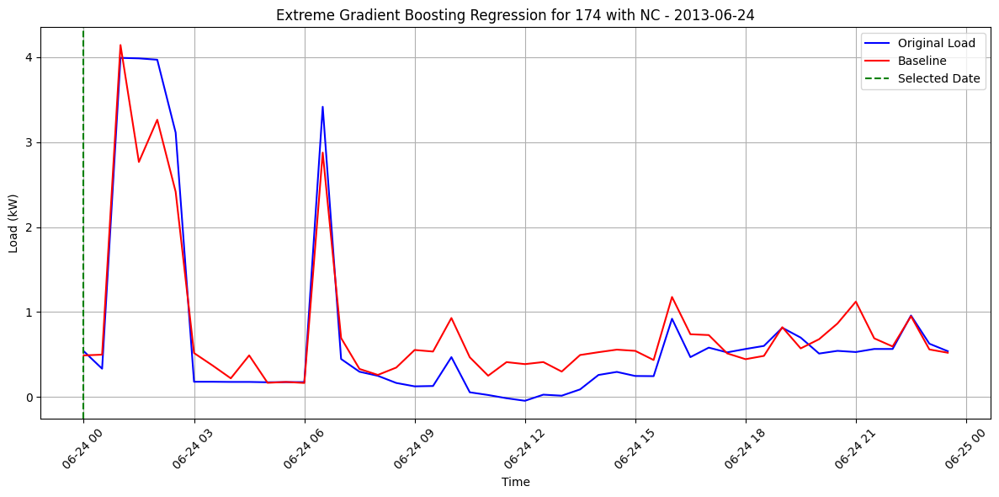

In [1551]:
predictions_rf_L12 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_L12 = predictions_rf_L12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVevall1_2, predictions_rf_L12, "Random Forrest Regression for 174 with NC - 2013-06-24",  selected_date_2)

predictions_r_L12 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_L12 = predictions_r_L12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVevall1_2, predictions_r_L12, "Ridge Regression for 174 with NC - 2013-06-24",  selected_date_2)

predictions_svr_L12 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_L12 = predictions_svr_L12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVevall1_2, predictions_svr_L12, "Support Vector Regression for 174 with NC - 2013-06-24",  selected_date_2)

predictions_xgb_L12 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_L12 = predictions_xgb_L12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(PVevall1_2, predictions_xgb_L12, "Extreme Gradient Boosting Regression for 174 with NC - 2013-06-24",  selected_date_2)

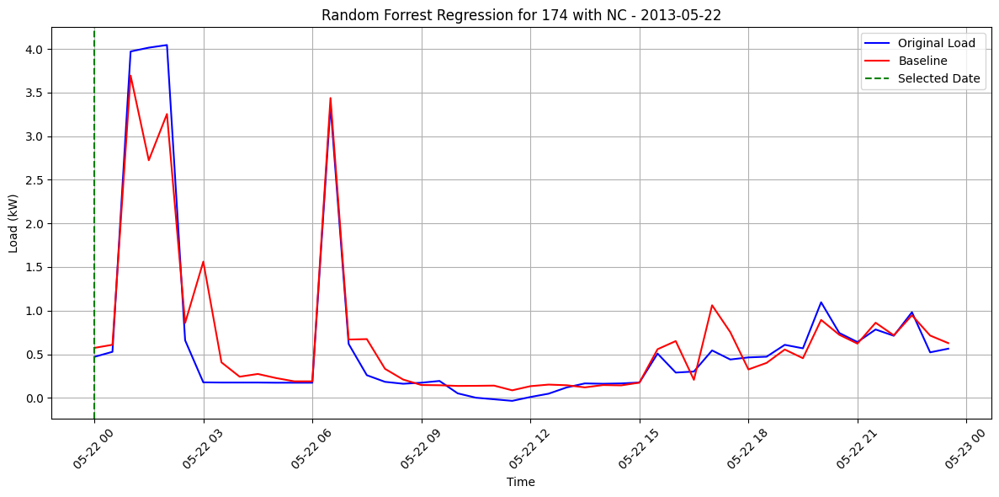

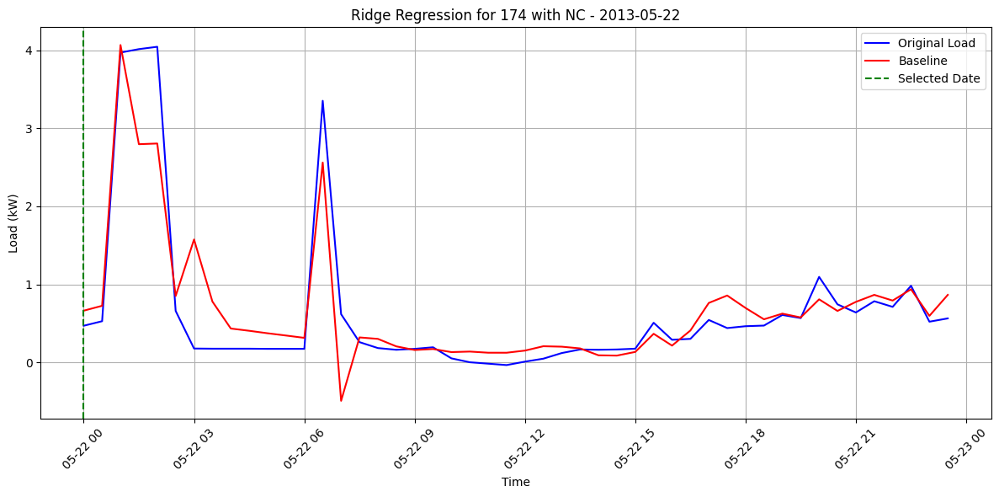

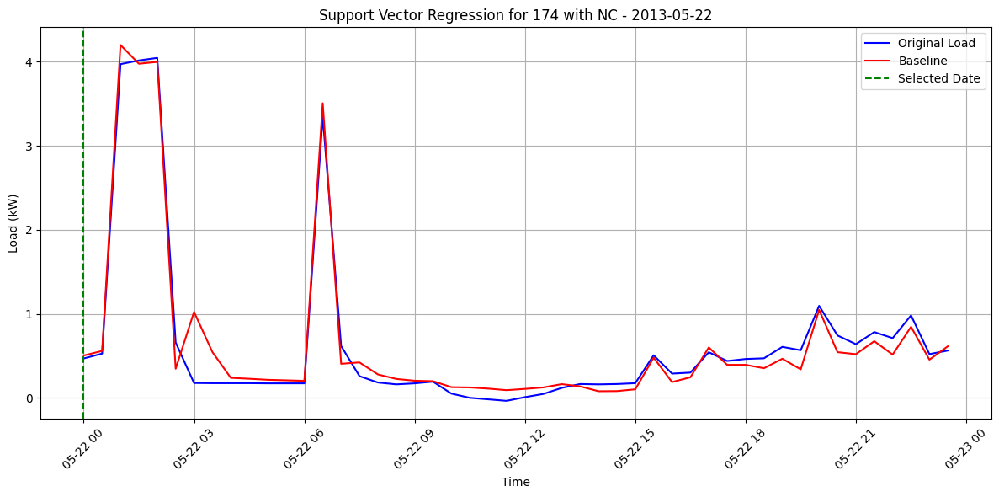

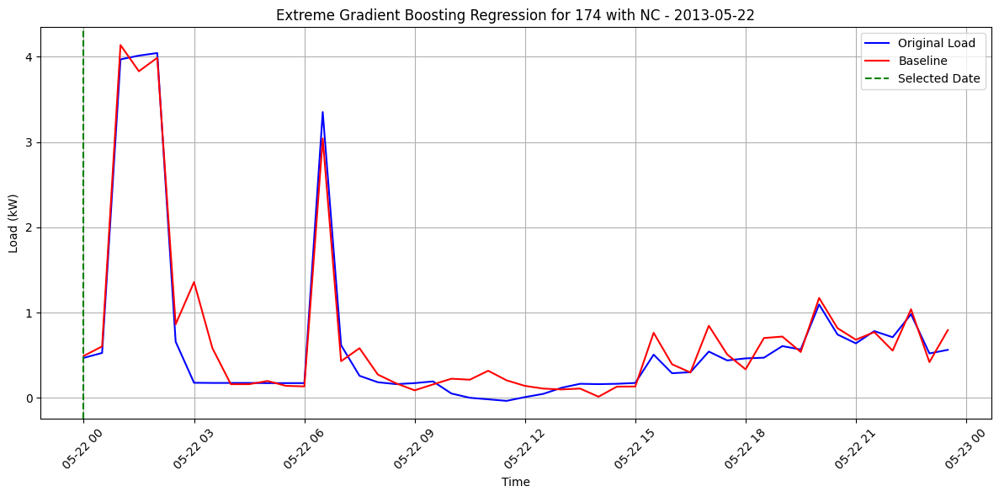

In [1552]:
predictions_rf_L13 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_L13 = predictions_rf_L13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVevall1_3, predictions_rf_L13, "Random Forrest Regression for 174 with NC - 2013-05-22",  selected_date_3)

predictions_r_L13 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_L13 = predictions_r_L13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVevall1_3, predictions_r_L13, "Ridge Regression for 174 with NC - 2013-05-22",  selected_date_3)

predictions_svr_L13 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_L13 = predictions_svr_L13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVevall1_3, predictions_svr_L13, "Support Vector Regression for 174 with NC - 2013-05-22",  selected_date_3)

predictions_xgb_L13 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_L13 = predictions_xgb_L13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(PVevall1_3, predictions_xgb_L13, "Extreme Gradient Boosting Regression for 174 with NC - 2013-05-22",  selected_date_3)

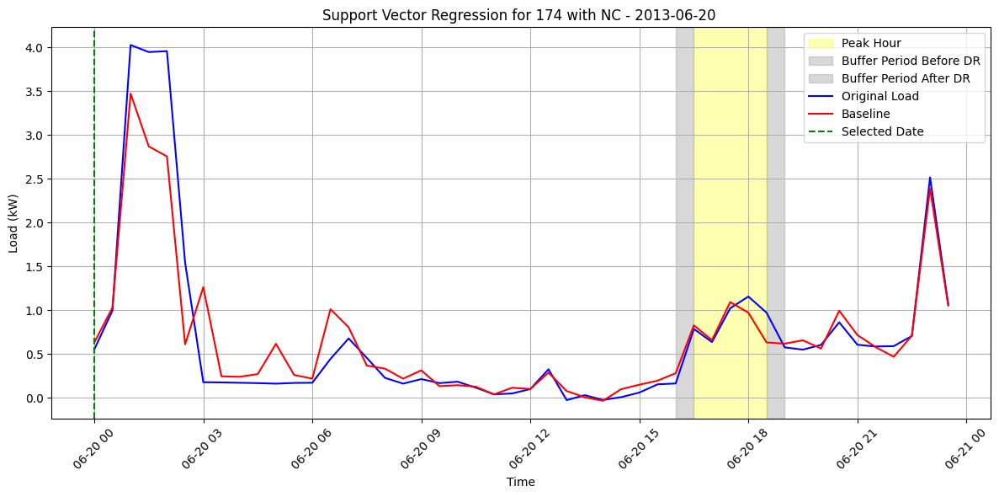

In [1720]:
start_peak_hour = pd.to_datetime('2013-06-20 16:30:00')
end_peak_hour = pd.to_datetime('2013-06-20 18:30:00')
plot_regression_peak(PVevall1, predictions_rf_L11, "Support Vector Regression for 174 with NC - 2013-06-20 ",  selected_date_1, start_peak_hour, end_peak_hour)

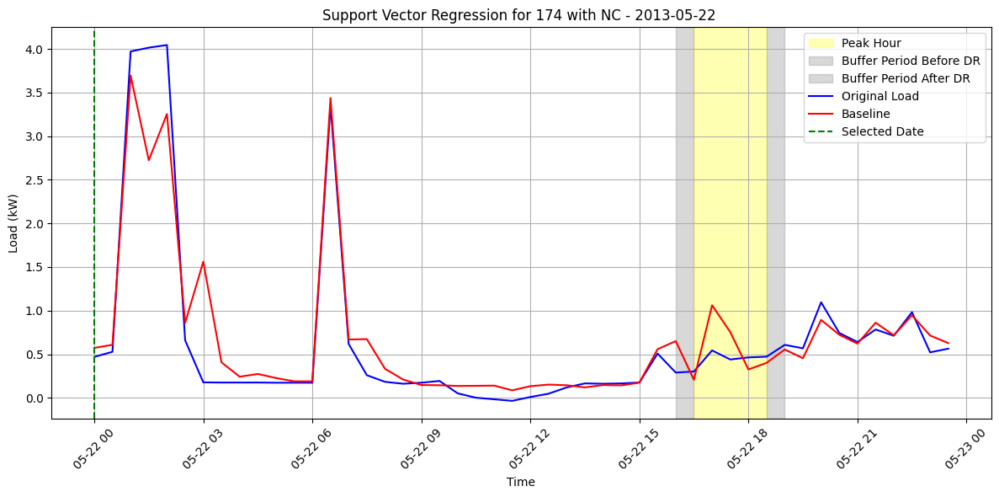

In [1722]:
start_peak_hour = pd.to_datetime('2013-05-22 16:30:00')
end_peak_hour = pd.to_datetime('2013-05-22 18:30:00')
plot_regression_peak(PVevall1_3, predictions_rf_L13, "Support Vector Regression for 174 with NC - 2013-05-22 ",  selected_date_3, start_peak_hour, end_peak_hour)

In [ ]:
start_peak_hour = pd.to_datetime('2013-06-24 15:00:00')
end_peak_hour = pd.to_datetime('2013-06-24 17:0:00')
plot_regression_peak(PVevall1_2, predictions_rf_L12, "Support Vector Regression for 174 with NC - 2013-06-24 ",  selected_date_2, start_peak_hour, end_peak_hour)

ML - 174 with GC

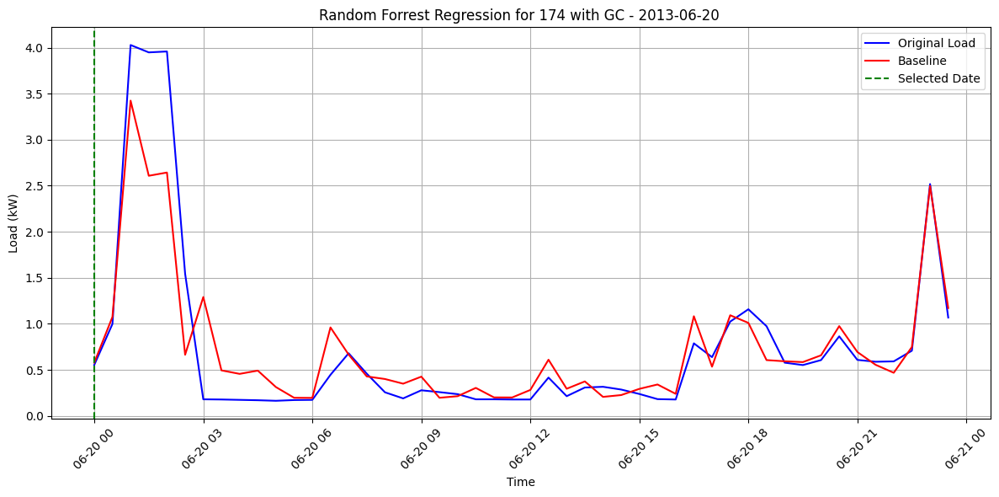

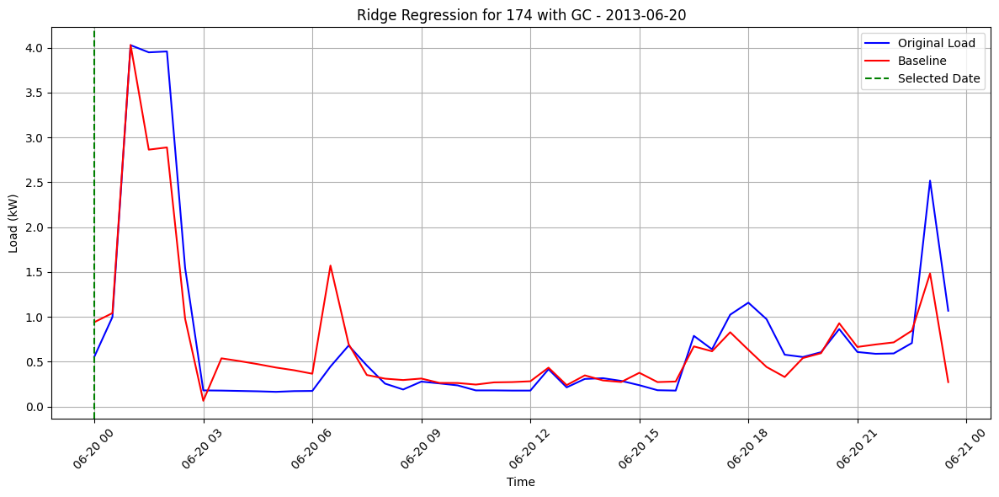

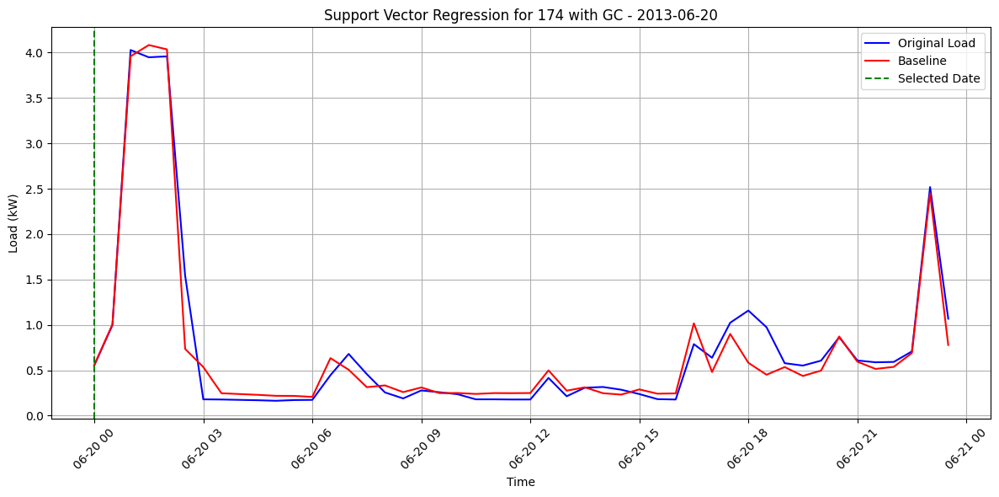

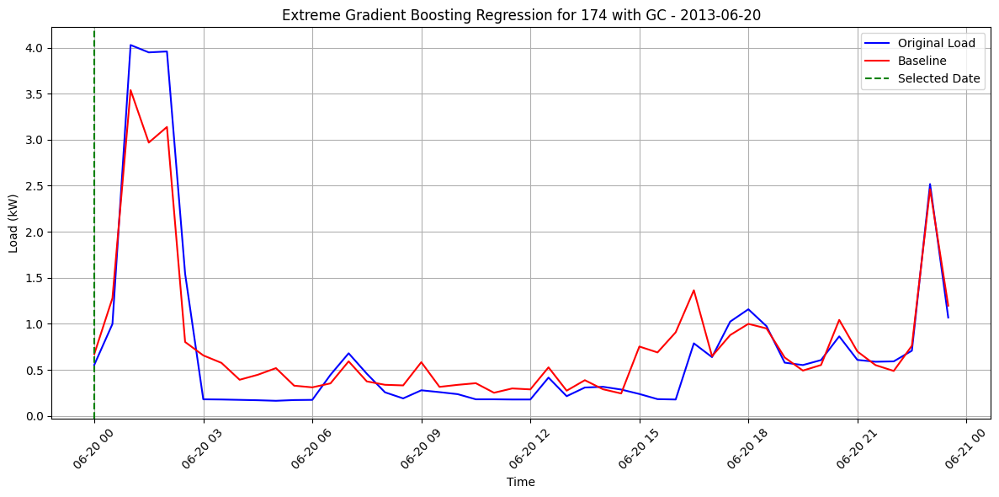

In [1578]:
predictions_rf_nL11 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nL11 = predictions_rf_nL11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVevall1, predictions_rf_nL11, "Random Forrest Regression for 174 with GC - 2013-06-20 ",  selected_date_1)

predictions_r_nL11 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nL11 = predictions_r_nL11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVevall1, predictions_r_nL11, "Ridge Regression for 174 with GC - 2013-06-20",  selected_date_1)

predictions_svr_nL11 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nL11 = predictions_svr_nL11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVevall1, predictions_svr_nL11, "Support Vector Regression for 174 with GC - 2013-06-20",  selected_date_1)

predictions_xgb_nL11 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nL11 = predictions_xgb_nL11.loc[selected_date_1.strftime('%Y-%m-%d')]
plot_regression(noPVevall1, predictions_xgb_nL11, "Extreme Gradient Boosting Regression for 174 with GC - 2013-06-20",  selected_date_1)



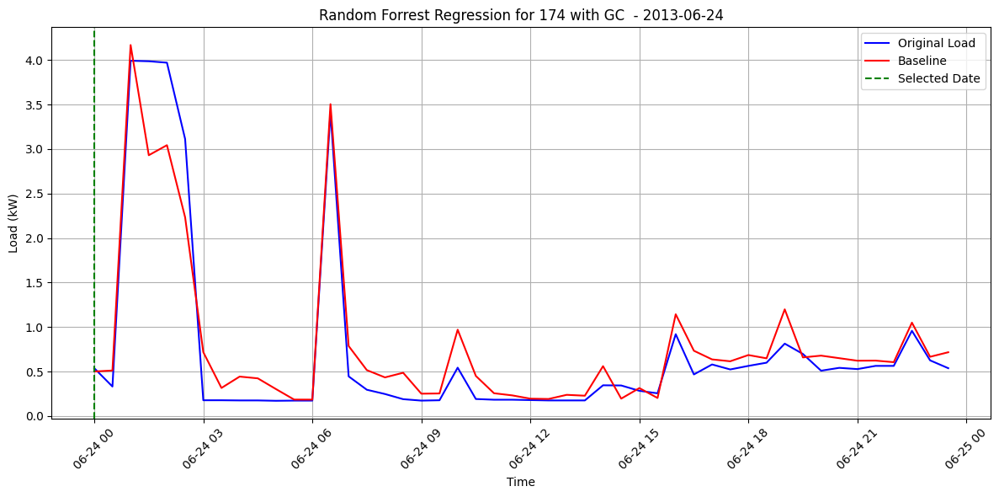

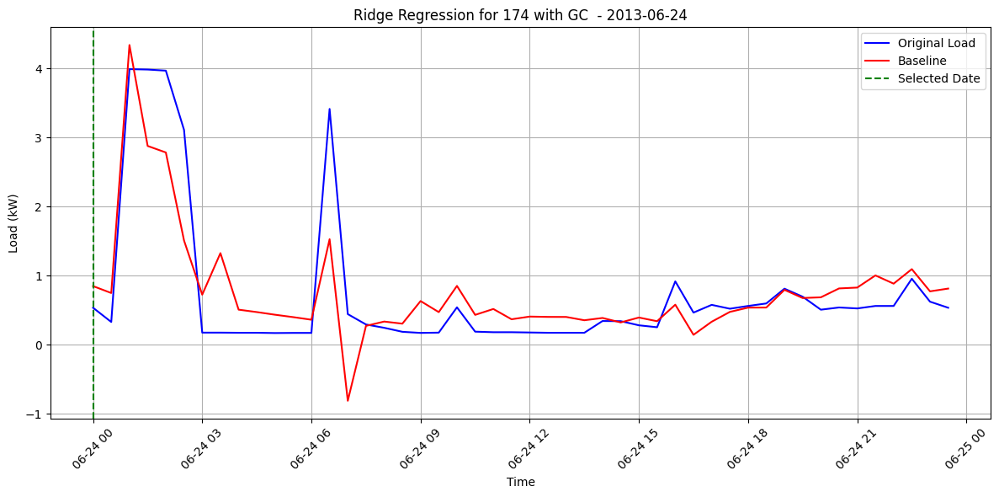

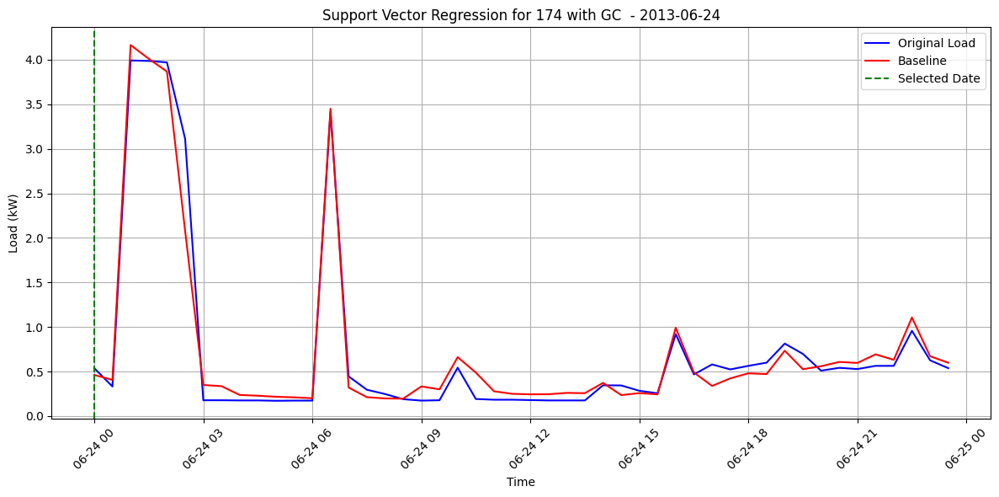

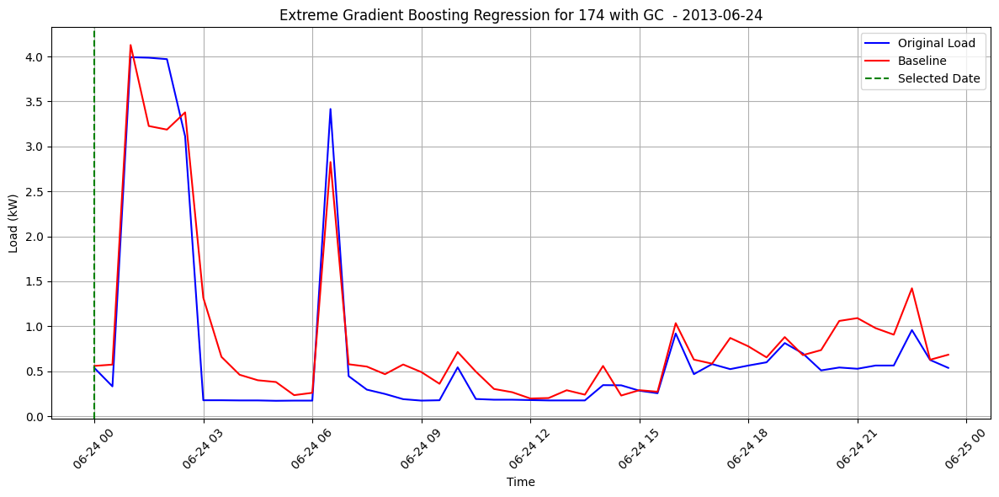

In [1576]:
predictions_rf_nL12 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nL12 = predictions_rf_nL12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVevall1_2, predictions_rf_nL12, "Random Forrest Regression for 174 with GC  - 2013-06-24",  selected_date_2)

predictions_r_nL12 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nL12 = predictions_r_nL12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVevall1_2, predictions_r_nL12, "Ridge Regression for 174 with GC  - 2013-06-24",  selected_date_2)

predictions_svr_nL12 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nL12 = predictions_svr_nL12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVevall1_2, predictions_svr_nL12, "Support Vector Regression for 174 with GC  - 2013-06-24",  selected_date_2)

predictions_xgb_nL12 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nL12 = predictions_xgb_nL12.loc[selected_date_2.strftime('%Y-%m-%d')]
plot_regression(noPVevall1_2, predictions_xgb_nL12, "Extreme Gradient Boosting Regression for 174 with GC  - 2013-06-24",  selected_date_2)

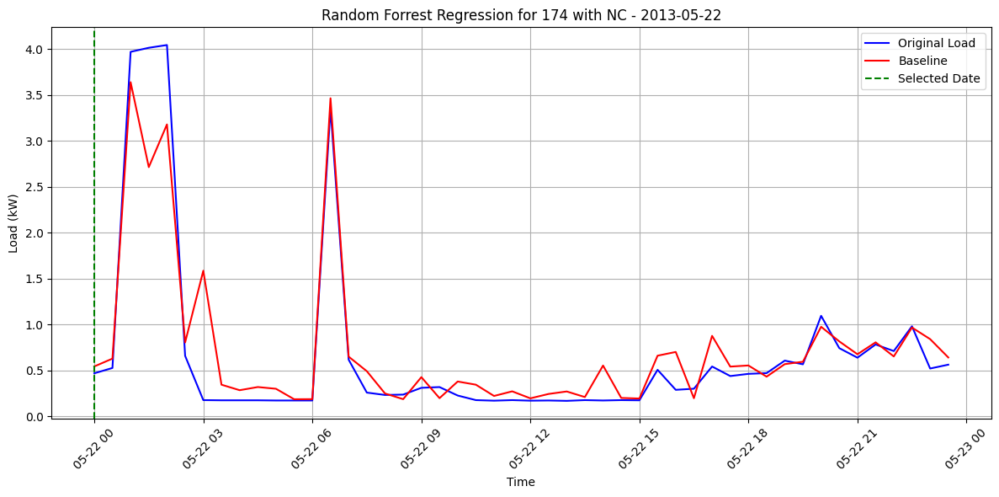

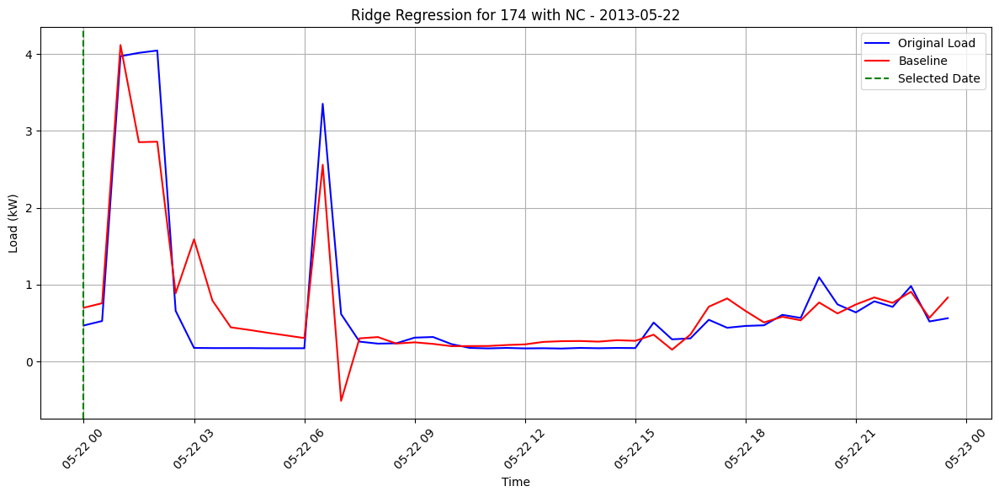

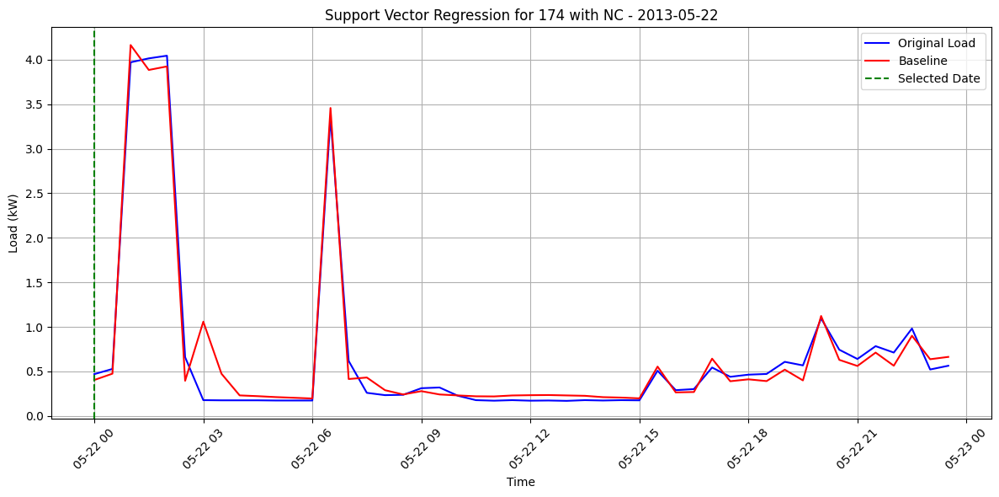

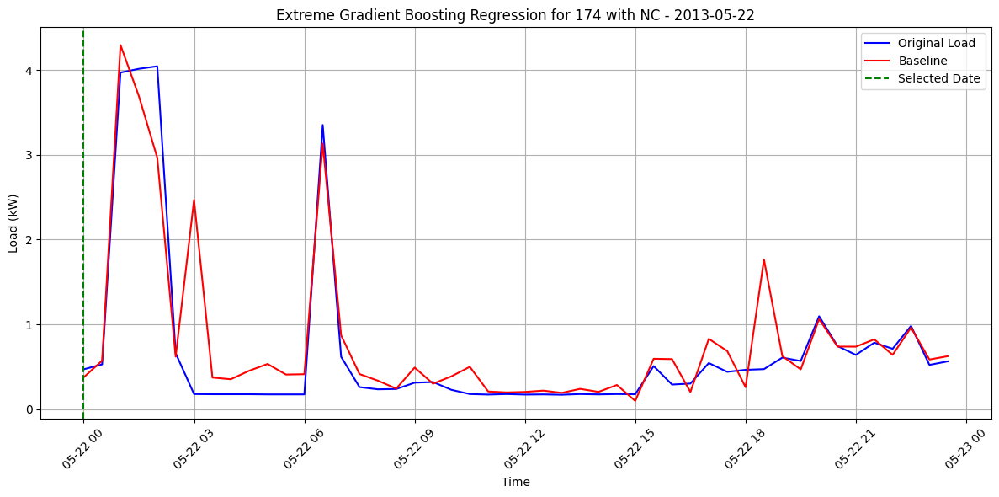

In [1575]:
predictions_rf_nL13 = pd.DataFrame(rf_p, index=y_test.index, columns=['Predictions'])
predictions_rf_nL13 = predictions_rf_nL13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVevall1_3, predictions_rf_nL13, "Random Forrest Regression for 174 with NC - 2013-05-22",  selected_date_3)

predictions_r_nL13 = pd.DataFrame(r_p, index=y_test.index, columns=['Predictions'])
predictions_r_nL13 = predictions_r_nL13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVevall1_3, predictions_r_nL13, "Ridge Regression for 174 with NC - 2013-05-22",  selected_date_3)

predictions_svr_nL13 = pd.DataFrame(svr_p, index=y_test.index, columns=['Predictions'])
predictions_svr_nL13 = predictions_svr_nL13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVevall1_3, predictions_svr_nL13, "Support Vector Regression for 174 with NC - 2013-05-22",  selected_date_3)

predictions_xgb_nL13 = pd.DataFrame(xgb_p, index=y_test.index, columns=['Predictions'])
predictions_xgb_nL13 = predictions_xgb_nL13.loc[selected_date_3.strftime('%Y-%m-%d')]
plot_regression(noPVevall1_3, predictions_xgb_nL13, "Extreme Gradient Boosting Regression for 174 with NC - 2013-05-22",  selected_date_3)

tunign for hyper parameters w/ RandomizedSearchCV

In [1455]:
print(f"Number of NaNs in dataset: {np.isnan(X).sum().sum()}")
print(f"Number of Infinities in dataset: {np.isinf(X).sum().sum()}")

Number of NaNs in dataset: 0
Number of Infinities in dataset: 0


Calculating the error metrics


In [1456]:
def calculate_errors(y_true, y_pred):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    if len(y_true) != len(y_pred):
        raise ValueError(f"Inconsistent number of samples: {len(y_true)} in y_true, {len(y_pred)} in y_pred")
    
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    mbe = mrbe(y_true, y_pred)
    bias_val = bias(y_true, y_pred)
    return mae, mse, mbe, bias_val

def metrics_table(models, y_true):
    errors = {'Model': [], 'MAE': [], 'MSE': [], 'MRBE': [], 'Bias': []}
    
    for model_name, y_pred in models.items():
        mae, mse, mbe, bias_val = calculate_errors(y_true, y_pred)
        errors['Model'].append(model_name)
        errors['MAE'].append(mae)
        errors['MSE'].append(mse)
        errors['MRBE'].append(mbe)
        errors['Bias'].append(bias_val)
    
    return pd.DataFrame(errors)

In [1677]:
def calculate_errors_peak(y_true, y_pred, peak_hour_start=None, peak_hour_end=None):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    if len(y_true) != len(y_pred):
        raise ValueError(f"Inconsistent number of samples: {len(y_true)} in y_true, {len(y_pred)} in y_pred")
    
    if peak_hour_start is not None and peak_hour_end is not None:
        mask = (y_true.index >= peak_hour_start) & (y_true.index <= peak_hour_end)
        y_true = y_true.loc[mask]
        y_pred = y_pred.loc[mask]
    
    mae = mean_absolute_error(y_true, y_pred)
    mse = mean_squared_error(y_true, y_pred)
    mbe = mrbe(y_true, y_pred)
    bias_val = bias(y_true, y_pred)
    return mae, mse, mbe, bias_val

def metrics_table_peak(models, y_true, peak_hour_start=None, peak_hour_end=None):
    errors = {'Model': [], 'MAE': [], 'MSE': [], 'MRBE': [], 'Bias': []}
    
    for model_name, y_pred in models.items():
        mae, mse, mbe, bias_val = calculate_errors_peak(y_true, y_pred, peak_hour_start, peak_hour_end)
        errors['Model'].append(model_name)
        errors['MAE'].append(mae)
        errors['MSE'].append(mse)
        errors['MRBE'].append(mbe)
        errors['Bias'].append(bias_val)
    
    return pd.DataFrame(errors)

H1PV

In [1599]:
h1_PV1 = {
    'Ridge': predictions_r_H11,
    'XGBoost': predictions_xgb_H11,
    'Random Forest': predictions_rf_H11,
    'SVR': predictions_svr_H11,
    'PJM High 4x5': H45_h1PV1,
    'NYISO High 5x10': H510_h1PV1,
    'Low 5x10': L510_h1PV1,
    'Mid 4x6': M46_h1PV1,
    'Nearest 5x10': N5_h1PV1
    #'Best RF model' : predictions_rfr_p
}

h1_PV1_errors = metrics_table(h1_PV1, PVeval)
print(h1_PV1_errors)


             Model       MAE       MSE       MRBE      Bias
0            Ridge  1.518898  4.744444  76.781636 -1.193071
1          XGBoost  1.390018  4.360234  96.535071 -1.025610
2    Random Forest  1.290648  4.190715  90.631838 -1.075655
3              SVR  1.396175  4.835758  69.172081 -1.257582
4     PJM High 4x5  1.586604  5.261577   7.261904 -1.143333
5  NYISO High 5x10  1.642042  5.393166  34.726304 -1.104558
6         Low 5x10  1.993525  8.648866 -22.866735 -1.808825
7          Mid 4x6  1.853052  7.828145 -27.704699 -1.722344
8     Nearest 5x10  1.605158  5.500467  65.661679 -1.287342


In [1600]:
h1_PV2 = {
    'Ridge': predictions_r_H12,
    'XGBoost': predictions_xgb_H12,
    'Random Forest': predictions_rf_H12,
    'SVR': predictions_svr_H12,
    'PJM High 4x5': H45_h1PV2,
    'NYISO High 5x10': H510_h1PV2,
    'Low 5x10': L510_h1PV2,
    'Mid 4x6': M46_h1PV2,
    'Nearest 5x10': N5_h1PV2
    #'Best RF model' : predictions_rfr_p
}

h1_PV2_errors = metrics_table(h1_PV2, PVeval2)
print(h1_PV2_errors)

             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.751346  1.071068   83.297952 -0.054305
1          XGBoost  0.884321  1.600176  106.220646  0.116271
2    Random Forest  0.811097  1.232281  109.231370  0.138675
3              SVR  0.595503  1.048908   65.089169 -0.189803
4     PJM High 4x5  1.196958  2.351773   85.382352  0.863792
5  NYISO High 5x10  1.091142  1.812562   83.774454  0.719908
6         Low 5x10  0.911283  1.968240   20.709204 -0.604700
7          Mid 4x6  0.900479  1.418408   94.522002  0.130125
8     Nearest 5x10  1.108392  1.901065  186.446162  0.713258


In [1601]:
h1_PV3 = {
    'Ridge': predictions_r_H13,
    'XGBoost': predictions_xgb_H13,
    'Random Forest': predictions_rf_H13,
    'SVR': predictions_svr_H13,
    'PJM High 4x5': H45_h1PV3,
    'NYISO High 5x10': H510_h1PV3,
    'Low 5x10': L510_h1PV3,
    'Mid 4x6': M46_h1PV3,
    'Nearest 5x10': N5_h1PV3
    #'Best RF model' : predictions_rfr_p
}

h1_PV3_errors = metrics_table(h1_PV3, PVeval3)
print(h1_PV3_errors)

             Model       MAE       MSE        MRBE      Bias
0            Ridge  1.305580  3.433752  306.045304 -0.986640
1          XGBoost  0.941601  1.989823  441.356623 -0.684491
2    Random Forest  0.852307  1.749653  464.258881 -0.633351
3              SVR  0.975499  2.447396  336.204712 -0.919294
4     PJM High 4x5  1.146698  3.034573  -56.868162 -0.869719
5  NYISO High 5x10  1.014017  2.774878  140.954821 -0.775533
6         Low 5x10  1.244258  3.739585   77.436742 -1.004425
7          Mid 4x6  1.226354  3.496065  -73.977975 -1.020667
8     Nearest 5x10  1.155142  3.180533  330.839285 -0.931275


H1noPV

In [1458]:
h1_noPV1 = {
    'Ridge': predictions_r_nH11,
    'XGBoost': predictions_xgb_nH11,
    'Random Forest': predictions_rf_nH11,
    'SVR': predictions_svr_nH11,
    'PJM High 4x5': H45_h1noPV1,
    'NYISO High 5x10': H510_h1noPV1,
    'Low 5x10': L510_h1noPV1,
    'Mid 4x6': M46_h1noPV1,
    'Nearest 5x10': N5_h1noPV1
    #'Best RF model' : predictions_rfr_p
}

h1_noPV1_errors = metrics_table(h1_noPV1, noPVeval)
print(h1_noPV1_errors)


             Model       MAE       MSE       MRBE      Bias
0            Ridge  1.476167  4.472557  54.594634 -1.153367
1          XGBoost  1.281306  3.974388  69.362335 -0.991407
2    Random Forest  1.274763  4.118558  65.800399 -1.030472
3              SVR  1.477194  5.358538  33.031179 -1.389857
4     PJM High 4x5  1.552927  5.066620  -4.703455 -1.105865
5  NYISO High 5x10  1.613508  5.248072  14.929315 -1.103192
6         Low 5x10  1.972242  8.461544 -27.193279 -1.813708
7          Mid 4x6  1.832615  7.592108 -29.709213 -1.714740
8     Nearest 5x10  1.568142  5.248159  46.741704 -1.239492


In [1459]:
h1_noPV2 = {
    'Ridge': predictions_r_nH12,
    'XGBoost': predictions_xgb_nH12,
    'Random Forest': predictions_rf_nH12,
    'SVR': predictions_svr_nH12,
    'PJM High 4x5': H45_h1noPV2,
    'NYISO High 5x10': H510_h1noPV2,
    'Low 5x10': L510_h1noPV2,
    'Mid 4x6': M46_h1noPV2,
    'Nearest 5x10': N5_h1noPV2
    #'Best RF model' : predictions_rfr_p
}

h1_noPV2_errors = metrics_table(h1_noPV2, noPVeval2)
print(h1_noPV2_errors)

             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.733404  1.041991  108.641058 -0.074288
1          XGBoost  0.784814  1.155736  158.461597  0.265983
2    Random Forest  0.693478  1.013896  141.390551  0.149389
3              SVR  0.679745  1.199556   81.315107 -0.260922
4     PJM High 4x5  1.256010  2.566287  174.106982  0.967177
5  NYISO High 5x10  1.123575  1.949091  166.701777  0.817225
6         Low 5x10  0.865617  1.702292   18.171514 -0.498750
7          Mid 4x6  0.917531  1.390845   94.871321  0.243677
8     Nearest 5x10  1.144325  2.046742  238.131765  0.810125


In [1460]:
h1_noPV3 = {
    'Ridge': predictions_r_nH13,
    'XGBoost': predictions_xgb_nH13,
    'Random Forest': predictions_rf_nH13,
    'SVR': predictions_svr_nH13,
    'PJM High 4x5': H45_h1noPV3,
    'NYISO High 5x10': H510_h1noPV3,
    'Low 5x10': L510_h1noPV3,
    'Mid 4x6': M46_h1noPV3,
    'Nearest 5x10': N5_h1noPV3
    #'Best RF model' : predictions_rfr_p
}

h1_noPV3_errors = metrics_table(h1_noPV3, noPVeval3)
print(h1_noPV3_errors)

             Model       MAE       MSE       MRBE      Bias
0            Ridge  1.284738  3.365772  25.220206 -0.923140
1          XGBoost  0.927173  1.783778  68.153550 -0.558754
2    Random Forest  0.893499  1.770845  63.587259 -0.597509
3              SVR  1.047325  2.690824  32.259829 -0.863393
4     PJM High 4x5  1.083469  2.799455  12.691962 -0.710635
5  NYISO High 5x10  0.998658  2.459935  13.777291 -0.652458
6         Low 5x10  1.230725  3.557883   9.906545 -0.841658
7          Mid 4x6  1.187552  3.222854   3.588942 -0.865573
8     Nearest 5x10  1.111608  2.958081  42.420336 -0.777158


H3_pv

In [1493]:
h3_PV1 = {
    'Ridge': predictions_r_H31,
    'XGBoost': predictions_xgb_H31,
    'Random Forest': predictions_rf_H31,
    'SVR': predictions_svr_H31,
    'PJM High 4x5': H45_h3PV1,
    'NYISO High 5x10': H510_h3PV1,
    'Low 5x10': L510_h3PV1,
    'Mid 4x6': M46_h3PV1,
    'Nearest 5x10': N5_h3PV1
    #'Best RF model' : predictions_rfr_p
}

h3_PV1_errors = metrics_table(h3_PV1, PVevalh3)
print(h3_PV1_errors)


             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.690425  0.680918    0.791390  0.136895
1          XGBoost  0.299423  0.153832   -7.895018  0.050539
2    Random Forest  0.360971  0.224940   -4.929076  0.080025
3              SVR  0.389047  0.302383  -17.972012 -0.049642
4     PJM High 4x5  0.739229  1.045014 -161.960813  0.217083
5  NYISO High 5x10  0.833950  1.340478 -213.030228  0.286133
6         Low 5x10  0.569867  0.557321  -34.959386 -0.040633
7          Mid 4x6  0.598885  0.653299  -89.808086  0.109510
8     Nearest 5x10  0.630892  0.761424    3.309097  0.161925


In [1494]:
h3_PV2 = {
    'Ridge': predictions_r_H32,
    'XGBoost': predictions_xgb_H32,
    'Random Forest': predictions_rf_H32,
    'SVR': predictions_svr_H32,
    'PJM High 4x5': H45_h3PV2,
    'NYISO High 5x10': H510_h3PV2,
    'Low 5x10': L510_h3PV2,
    'Mid 4x6': M46_h3PV2,
    'Nearest 5x10': N5_h3PV2
    #'Best RF model' : predictions_rfr_p
}

h3_PV2_errors = metrics_table(h3_PV2, PVevalh3_2)
print(h3_PV2_errors)

             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.602578  0.699413  186.193033 -0.255374
1          XGBoost  0.394515  0.372355  223.419231 -0.112011
2    Random Forest  0.367050  0.314956  227.110993 -0.097794
3              SVR  0.499881  0.500808  209.716475 -0.164782
4     PJM High 4x5  0.605115  0.800774   68.022269 -0.235302
5  NYISO High 5x10  0.631683  0.984215  113.555313 -0.195667
6         Low 5x10  0.841192  1.627859   42.940248 -0.522508
7          Mid 4x6  0.699260  1.237985   32.706237 -0.382031
8     Nearest 5x10  0.600792  0.832598  178.052377 -0.286725


In [1495]:
h3_PV3 = {
    'Ridge': predictions_r_H33,
    'XGBoost': predictions_xgb_H33,
    'Random Forest': predictions_rf_H33,
    'SVR': predictions_svr_H33,
    'PJM High 4x5': H45_h3PV3,
    'NYISO High 5x10': H510_h3PV3,
    'Low 5x10': L510_h3PV3,
    'Mid 4x6': M46_h3PV3,
    'Nearest 5x10': N5_h3PV3
    #'Best RF model' : predictions_rfr_p
}

h3_PV3_errors = metrics_table(h3_PV3, PVevalh3_3)
print(h3_PV3_errors)

             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.672952  0.952726  104.593480 -0.421488
1          XGBoost  0.493618  0.678392  118.657131 -0.363219
2    Random Forest  0.415005  0.537121  134.419908 -0.297910
3              SVR  0.497866  0.670104  118.782055 -0.362701
4     PJM High 4x5  0.744698  1.129512    4.581127 -0.437052
5  NYISO High 5x10  0.689033  0.994484    6.736247 -0.434983
6         Low 5x10  0.770633  1.334318  -29.442318 -0.625367
7          Mid 4x6  0.790521  1.401549  -17.567396 -0.591271
8     Nearest 5x10  0.734775  1.125370   90.396734 -0.480308


h3_noPV

In [1535]:
h3_noPV1 = {
    'Ridge': predictions_r_nH31,
    'XGBoost': predictions_xgb_nH31,
    'Random Forest': predictions_rf_nH31,
    'SVR': predictions_svr_nH31,
    'PJM High 4x5': H45_h3noPV1,
    'NYISO High 5x10': H510_h3noPV1,
    'Low 5x10': L510_h3noPV1,
    'Mid 4x6': M46_h3noPV1,
    'Nearest 5x10': N5_h3noPV1
    #'Best RF model' : predictions_rfr_p
}

h3_noPV1_errors = metrics_table(h3_noPV1, noPVevalh3)
print(h3_noPV1_errors)


             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.729749  0.751738  363.574544  0.171019
1          XGBoost  0.231101  0.120356  307.485818  0.034553
2    Random Forest  0.267613  0.138426  302.484009  0.022384
3              SVR  0.368608  0.299072  260.920791 -0.078741
4     PJM High 4x5  0.742896  1.050039  259.654248  0.218812
5  NYISO High 5x10  0.824733  1.295717  307.636243  0.275167
6         Low 5x10  0.559042  0.548728  122.459503 -0.057492
7          Mid 4x6  0.603531  0.657598  199.370162  0.111052
8     Nearest 5x10  0.639700  0.772543  362.525380  0.168467


In [1536]:
h3_noPV2 = {
    'Ridge': predictions_r_nH32,
    'XGBoost': predictions_xgb_nH32,
    'Random Forest': predictions_rf_nH32,
    'SVR': predictions_svr_nH32,
    'PJM High 4x5': H45_h3noPV2,
    'NYISO High 5x10': H510_h3noPV2,
    'Low 5x10': L510_h3noPV2,
    'Mid 4x6': M46_h3noPV2,
    'Nearest 5x10': N5_h3noPV2
    #'Best RF model' : predictions_rfr_p
}

h3_noPV2_errors = metrics_table(h3_noPV2, noPVevalh3_2)
print(h3_noPV2_errors)

             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.663866  0.799373  149.480920 -0.288087
1          XGBoost  0.396351  0.343116  173.663252 -0.179953
2    Random Forest  0.384927  0.305307  194.219679 -0.088033
3              SVR  0.482274  0.526328  160.472053 -0.238939
4     PJM High 4x5  0.592083  0.763316   39.889032 -0.186771
5  NYISO High 5x10  0.638417  0.970235   50.357721 -0.154133
6         Low 5x10  0.809392  1.492672   42.600682 -0.469175
7          Mid 4x6  0.680865  1.153021   38.872933 -0.335427
8     Nearest 5x10  0.590725  0.779128  160.508793 -0.238775


In [1537]:
h3_noPV3 = {
    'Ridge': predictions_r_nH33,
    'XGBoost': predictions_xgb_nH33,
    'Random Forest': predictions_rf_nH33,
    'SVR': predictions_svr_nH33,
    'PJM High 4x5': H45_h3noPV3,
    'NYISO High 5x10': H510_h3noPV3,
    'Low 5x10': L510_h3noPV3,
    'Mid 4x6': M46_h3noPV3,
    'Nearest 5x10': N5_h3noPV3
    #'Best RF model' : predictions_rfr_p
}

h3_noPV3_errors = metrics_table(h3_noPV3, noPVevalh3_3)
print(h3_noPV3_errors)

             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.683566  0.979083   98.888874 -0.442489
1          XGBoost  0.483311  0.555983  131.002841 -0.301547
2    Random Forest  0.421692  0.475221  149.517308 -0.220290
3              SVR  0.501784  0.695142  115.656830 -0.368897
4     PJM High 4x5  0.689958  1.000454   13.807060 -0.351729
5  NYISO High 5x10  0.684008  1.009921    9.062847 -0.367275
6         Low 5x10  0.685892  1.241086  -15.765648 -0.545008
7          Mid 4x6  0.743708  1.300930   -7.014933 -0.517229
8     Nearest 5x10  0.681283  1.009762  109.386495 -0.396417


l1_PV

In [1553]:
l1_PV1 = {
    'Ridge': predictions_r_L11,
    'XGBoost': predictions_xgb_L11,
    'Random Forest': predictions_rf_L11,
    'SVR': predictions_svr_L11,
    'PJM High 4x5': H45_l1PV1,
    'NYISO High 5x10': H510_l1PV1,
    'Low 5x10': L510_l1PV1,
    'Mid 4x6': M46_l1PV1,
    'Nearest 5x10': N5_l1PV1
    #'Best RF model' : predictions_rfr_p
}

l1_PV1_errors = metrics_table(l1_PV1, PVevall1)
print(l1_PV1_errors)


             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.241185  0.150865  223.596864 -0.024749
1          XGBoost  0.171842  0.111322  202.955899 -0.067127
2    Random Forest  0.184688  0.121921  227.504317 -0.016727
3              SVR  0.140065  0.052360  220.312712 -0.031492
4     PJM High 4x5  0.206167  0.161749   46.953024  0.026812
5  NYISO High 5x10  0.209558  0.174609   47.263821  0.056992
6         Low 5x10  0.286017  0.265006   78.887141  0.051700
7          Mid 4x6  0.168865  0.098920  -11.408446 -0.044969
8     Nearest 5x10  0.174633  0.135917  233.037626 -0.005367


In [1554]:
l1_PV2 = {
    'Ridge': predictions_r_L12,
    'XGBoost': predictions_xgb_L12,
    'Random Forest': predictions_rf_L12,
    'SVR': predictions_svr_L12,
    'PJM High 4x5': H45_l1PV2,
    'NYISO High 5x10': H510_l1PV2,
    'Low 5x10': L510_l1PV2,
    'Mid 4x6': M46_l1PV2,
    'Nearest 5x10': N5_l1PV2
    #'Best RF model' : predictions_rfr_p
}

l1_PV2_errors = metrics_table(l1_PV2, PVevall1_2)
print(l1_PV2_errors)


             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.396698  0.317820  259.841865  0.073779
1          XGBoost  0.253653  0.118323  271.789202  0.099490
2    Random Forest  0.241555  0.117992  281.388673  0.120149
3              SVR  0.139620  0.058198  232.618881  0.015193
4     PJM High 4x5  0.210083  0.133804   32.714657  0.057583
5  NYISO High 5x10  0.253708  0.222593   45.812417  0.086775
6         Low 5x10  0.298250  0.335538   23.427380  0.011033
7          Mid 4x6  0.215958  0.193656    6.865685 -0.041979
8     Nearest 5x10  0.207917  0.132354  233.435343  0.016950


In [1555]:
l1_PV3 = {
    'Ridge': predictions_r_L13,
    'XGBoost': predictions_xgb_L13,
    'Random Forest': predictions_rf_L13,
    'SVR': predictions_svr_L13,
    'PJM High 4x5': H45_l1PV3,
    'NYISO High 5x10': H510_l1PV3,
    'Low 5x10': L510_l1PV3,
    'Mid 4x6': M46_l1PV3,
    'Nearest 5x10': N5_l1PV3
    #'Best RF model' : predictions_rfr_p
}

l1_PV3_errors = metrics_table(l1_PV3, PVevall1_3)
print(l1_PV3_errors)


             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.241185  0.150865  223.596864 -0.024749
1          XGBoost  0.171842  0.111322  202.955899 -0.067127
2    Random Forest  0.184688  0.121921  227.504317 -0.016727
3              SVR  0.140065  0.052360  220.312712 -0.031492
4     PJM High 4x5  0.206167  0.161749   46.953024  0.026812
5  NYISO High 5x10  0.209558  0.174609   47.263821  0.056992
6         Low 5x10  0.286017  0.265006   78.887141  0.051700
7          Mid 4x6  0.168865  0.098920  -11.408446 -0.044969
8     Nearest 5x10  0.174633  0.135917  233.037626 -0.005367


l1_noPV

In [1579]:
l1_noPV1 = {
    'Ridge': predictions_r_nL11,
    'XGBoost': predictions_xgb_nL11,
    'Random Forest': predictions_rf_nL11,
    'SVR': predictions_svr_nL11,
    'PJM High 4x5': H45_l1noPV1,
    'NYISO High 5x10': H510_l1noPV1,
    'Low 5x10': L510_l1noPV1,
    'Mid 4x6': M46_l1noPV1,
    'Nearest 5x10': N5_l1noPV1
    #'Best RF model' : predictions_rfr_p
}

l1_noPV1_errors = metrics_table(l1_noPV1, noPVevall1)
print(l1_noPV1_errors)


             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.233590  0.147866  111.710483 -0.036151
1          XGBoost  0.222472  0.103238  139.620769  0.055656
2    Random Forest  0.212879  0.145523  121.114121 -0.005219
3              SVR  0.116875  0.037388  114.030209 -0.028521
4     PJM High 4x5  0.201802  0.161047   15.877524  0.016948
5  NYISO High 5x10  0.202242  0.136966   19.408506  0.041392
6         Low 5x10  0.276025  0.261260   47.961873  0.041908
7          Mid 4x6  0.164448  0.098875   -1.984215 -0.054740
8     Nearest 5x10  0.169333  0.135389  118.383848 -0.014200


In [1580]:
l1_noPV2 = {
    'Ridge': predictions_r_nL12,
    'XGBoost': predictions_xgb_nL12,
    'Random Forest': predictions_rf_nL12,
    'SVR': predictions_svr_nL12,
    'PJM High 4x5': H45_l1noPV2,
    'NYISO High 5x10': H510_l1noPV2,
    'Low 5x10': L510_l1noPV2,
    'Mid 4x6': M46_l1noPV2,
    'Nearest 5x10': N5_l1noPV2
    #'Best RF model' : predictions_rfr_p
}

l1_noPV2_errors = metrics_table(l1_noPV2, noPVevall1_2)
print(l1_noPV2_errors)


             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.364230  0.300928  141.185403  0.025087
1          XGBoost  0.243437  0.112800  180.680671  0.149098
2    Random Forest  0.193943  0.089843  153.323431  0.063199
3              SVR  0.108294  0.033259  135.538889  0.007358
4     PJM High 4x5  0.195740  0.130416   43.155507  0.064219
5  NYISO High 5x10  0.240858  0.223750   47.621102  0.083908
6         Low 5x10  0.246308  0.225263   40.688921  0.011658
7          Mid 4x6  0.196500  0.188257    9.789583 -0.038917
8     Nearest 5x10  0.189833  0.127591  140.738327  0.023683


In [1586]:
l1_noPV3 = {
    'Ridge': predictions_r_L13,
    'XGBoost': predictions_xgb_L13,
    'Random Forest': predictions_rf_L13,
    'SVR': predictions_svr_L13,
    'PJM High 4x5': H45_l1PV3,
    'NYISO High 5x10': H510_l1PV3,
    'Low 5x10': L510_l1PV3,
    'Mid 4x6': M46_l1PV3,
    'Nearest 5x10': N5_l1PV3
    #'Best RF model' : predictions_rfr_p
}

l1_noPV3_errors = metrics_table(l1_noPV3, noPVevall1_3)
print(l1_noPV3_errors)

             Model       MAE       MSE        MRBE      Bias
0            Ridge  0.237997  0.169869  124.323952 -0.003513
1          XGBoost  0.133688  0.050468  139.535164  0.042113
2    Random Forest  0.175136  0.110892  129.290581  0.011384
3              SVR  0.113151  0.029949  118.421387 -0.021218
4     PJM High 4x5  0.260333  0.186230    7.071311  0.017396
5  NYISO High 5x10  0.294133  0.327313   24.411433  0.071883
6         Low 5x10  0.229033  0.292706  -15.704756 -0.121433
7          Mid 4x6  0.286208  0.378869    8.116090 -0.035062
8     Nearest 5x10  0.242467  0.193479  125.584141  0.000267


hyperparameter tuning

In [1472]:
#usign window size as 6 and usign a seasonality approach 

def evaluate_model_seasonal(model, X, y, window_size, n_splits):
    tscv = TimeSeriesSplit(n_splits=n_splits)
    mse_scores = []
    mae_scores = []
    mrbe_scores = []
    bias_scores = []

    # Perform TimeSeriesSplit Cross-Validation with sliding window
    for train_index, val_index in tscv.split(X[:-window_size]):
        X_train_fold = X.iloc[train_index]
        X_val_fold = X.iloc[val_index + window_size]
        y_train_fold = y.iloc[train_index]
        y_val_fold = y.iloc[val_index + window_size]

        # Train the model on the training fold
        model.fit(X_train_fold, y_train_fold)

        # Evaluate on the validation fold
        y_val_pred = model.predict(X_val_fold)
        mse_scores.append(mean_squared_error(y_val_fold, y_val_pred))
        mrbe_scores.append(mrbe(y_val_fold, y_val_pred))
        mae_scores.append(mean_absolute_error(y_val_fold, y_val_pred))
        bias_scores.append(bias(y_val_fold, y_val_pred))

    # Compute average metrics from cross-validation
    avg_mse = np.mean(mse_scores)
    avg_mrbe = np.mean(mrbe_scores)
    avg_mae = np.mean(mae_scores)
    avg_bias = np.mean(bias_scores)

    print(f"Average Validation MSE: {avg_mse}, MRBE: {avg_mrbe}, MAE: {avg_mae}, 'Bias': {avg_bias}")

    # Train the final model on the entire training set
    model.fit(X, y)

    # Evaluate on the test set using the sliding window
    X_train_final = X[:-window_size]
    X_test_final = X[-window_size:]
    y_train_final = y[:-window_size]
    y_test_final = y[-window_size:]

    model.fit(X_train_final, y_train_final)
    y_test_pred = model.predict(X_test_final)
    test_mse = mean_squared_error(y_test_final, y_test_pred)
    test_mrbe = mrbe(y_test_final, y_test_pred)
    test_mae = mean_absolute_error(y_test_final, y_test_pred)
    test_bias = bias(y_test_final, y_test_pred)

    print(f"Test MSE: {test_mse}, MRBE: {test_mrbe},  MAE: {test_mae}, 'Bias': {test_bias}")

    return y_test_pred


rf


In [1602]:

# Define the parameter distribution for Random Forest
rf_param_dist = {
    'rf__n_estimators': [50, 100, 150, 200, 500],
    'rf__max_features': ['sqrt', 'log2'],
    'rf__max_depth': [10, 20, 30],
    'rf__min_samples_split': [2, 5, 10],
    'rf__min_samples_leaf': [1, 2, 4],
    'rf__bootstrap': [True, False]
}

# Create the pipeline
pipeline = Pipeline([
    ('scaler',  StandardScaler()),  # Step to robust scale features
    ('rf', RandomForestRegressor(random_state=42))  # Random Forest Regressor
])

# TimeSeriesSplit for cross-validation
tscv = TimeSeriesSplit(n_splits=10)

# Initialize RandomizedSearchCV
rf_reg = RandomizedSearchCV(
   estimator=pipeline,
   param_distributions=rf_param_dist,
   n_iter=100,
   cv=tscv,
   scoring='neg_mean_squared_error',
   n_jobs=-1,
   random_state=42
)

#rf_reg = GridSearchCV(
   # estimator= pipeline,
   # param_grid= rf_param_dist,
   # cv=tscv,
   # scoring='neg_mean_squared_error',
   # n_jobs=-1,
   # verbose = 2
#)

# Fit the model
rf_reg.fit(X_train, y_train)

# Get the best parameters and estimator
best_params = rf_reg.best_params_
print(f'Best Parameters for Random Forest: {best_params}')

best_score = rf_reg.best_score_
print(f'Best Score: {best_score}')

rf_best = rf_reg.best_estimator_

# Predict on the test data
rf_h1pv = evaluate_model(rf_best, X_train, y_train, X_test, y_test, tscv)



Best Parameters for Random Forest: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 4, 'rf__max_features': 'sqrt', 'rf__max_depth': 20, 'rf__bootstrap': False}
Best Score: -0.48142718785213406
Average Validation MSE: 0.48142718785213406, MRBE: 9.246558806362371, MAE: 0.4272405674526872, 'Bias': 0.02135203222415117
Test MSE: 0.7684030682035249, MRBE: 10.397915007061908,  MAE: 0.510696318781663, 'Bias': -0.05844610692158804


h1pv
Best Parameters for Random Forest: {'rf__n_estimators': 100, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 4, 'rf__max_features': 'sqrt', 'rf__max_depth': 20, 'rf__bootstrap': False}
Best Score: -0.48142718785213406
Average Validation MSE: 0.48142718785213406, MRBE: 9.246558806362371, MAE: 0.4272405674526872, 'Bias': 0.02135203222415117
Test MSE: 0.7684030682035249, MRBE: 10.397915007061908,  MAE: 0.510696318781663, 'Bias': -0.05844610692158804

h1nopv

Best Parameters for Random Forest: {'rf__n_estimators': 100, 'rf__min_samples_split': 10, 'rf__min_samples_leaf': 2, 'rf__max_features': 'log2', 'rf__max_depth': None, 'rf__bootstrap': False}
Best Score: -0.44414952012010545
Average Validation MSE: 0.44414952012010545, MRBE: 40.543135955208065, MAE: 0.4004707694982673, 'Bias': 0.03334845993657863
Test MSE: 0.745022287336765, MRBE: 27.348880810942394,  MAE: 0.46149371136275624, 'Bias': -0.11331246491921743
                     Predictions

h3pv random

Best Parameters for Random Forest: {'rf__n_estimators': 100, 'rf__min_samples_split': 10, 'rf__min_samples_leaf': 4, 'rf__max_features': 'log2', 'rf__max_depth': 20, 'rf__bootstrap': False}
Best Score: -0.22143217542825727
Average Validation MSE: 0.22143217542825727, MRBE: -0.3838594404615748, MAE: 0.28641829851282413, 'Bias': 0.04311744035150937
Test MSE: 0.21413997421124398, MRBE: 4.951802622323701,  MAE: 0.27937633114589266, 'Bias': -0.008025189559355828


h3_nopv random

Best Parameters for Random Forest: {'rf__n_estimators': 200, 'rf__min_samples_split': 5, 'rf__min_samples_leaf': 4, 'rf__max_features': 'sqrt', 'rf__max_depth': 30, 'rf__bootstrap': False}
Best Score: -0.2085990511395815
Average Validation MSE: 0.2085990511395815, MRBE: 42.299186923662866, MAE: 0.27454045817511413, 'Bias': 0.04577997737706625
Test MSE: 0.20703884060946878, MRBE: 32.86604502609398,  MAE: 0.2677715885675981, 'Bias': -0.01760608952718113

l1_pv random

Best Parameters for Random Forest: {'rf__n_estimators': 500, 'rf__min_samples_split': 10, 'rf__min_samples_leaf': 4, 'rf__max_features': 'sqrt', 'rf__max_depth': 30, 'rf__bootstrap': False}
Best Score: -0.16299462843061835

Average Validation MSE: 0.16299462843061835, MRBE: 27.48385205754166, MAE: 0.21830644738372448, 'Bias': 0.05004585423041648
Test MSE: 0.2145533747954857, MRBE: 48.48752802423048,  MAE: 0.23455017059319316, 'Bias': 0.003537909740523759

h1_pv

In [1606]:
# Ensure that the predictions and test data have the same indices
rf_h1pv1= pd.DataFrame(rf_h1pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h1pv1 = rf_h1pv1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(PVeval, rf_h1pv1)

(1.3914860332699643, 4.65654698077438, 85.50864732864522, -1.119087618452749)

In [1607]:
# Ensure that the predictions and test data have the same indices
rf_h1pv2= pd.DataFrame(rf_h1pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h1pv2 = rf_h1pv2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(PVeval2, rf_h1pv2)

(0.8453779927109982,
 1.4454009583135867,
 107.24484082387136,
 0.12389251597365246)

In [1608]:
# Ensure that the predictions and test data have the same indices
rf_h1pv3= pd.DataFrame(rf_h1pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h1pv3 = rf_h1pv3.loc[selected_date_3.strftime('%Y-%m-%d')]

calculate_errors(PVeval3, rf_h1pv3)

(0.9630314004713781, 2.234513917293643, 404.4954930804888, -0.7668016760727201)

H1_NOPV

In [1466]:
# Ensure that the predictions and test data have the same indices
rf_h1nopv1= pd.DataFrame(rf_h1nopv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h1nopv1 = rf_h1nopv1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(noPVeval, rf_h1nopv1)

(1.3635616998119773, 4.58872751935753, 54.96260600419407, -1.1493316153432676)

In [1467]:
# Ensure that the predictions and test data have the same indices
rf_h1nopv2= pd.DataFrame(rf_h1nopv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h1nopv2 = rf_h1nopv2.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(noPVeval2, rf_h1nopv2)

(1.0406673813765843,
 1.8569380128370014,
 148.83145785113467,
 0.2002100513233988)

In [1468]:
# Ensure that the predictions and test data have the same indices
rf_h1nopv3= pd.DataFrame(rf_h1nopv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h1nopv3 = rf_h1nopv3.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(noPVeval3, rf_h1nopv3)

(1.1575278002729399,
 2.6852768388190866,
 100.24152014466716,
 -0.2864149486766011)

H3_PV

In [1518]:
# Ensure that the predictions and test data have the same indices
rf_h3pv1= pd.DataFrame(rf_h3pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h3pv1 = rf_h3pv1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(PVevalh3, rf_h3pv1)

(0.3860248114630858,
 0.24352640528491012,
 -3.790137225490289,
 0.09134778387354928)

In [1519]:
# Ensure that the predictions and test data have the same indices
rf_h3pv2= pd.DataFrame(rf_h3pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h3pv2 = rf_h3pv2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(PVevalh3_2, rf_h3pv2)

(0.41368928278600076,
 0.37098215195754775,
 214.82719023967664,
 -0.14510030568169288)

In [1520]:
# Ensure that the predictions and test data have the same indices
rf_h3pv3= pd.DataFrame(rf_h3pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h3pv3 = rf_h3pv3.loc[selected_date_3.strftime('%Y-%m-%d')]

calculate_errors(PVevalh3_3, rf_h3pv3)

(0.44703257059454976,
 0.5888204384073955,
 131.16990064304935,
 -0.31137554082651026)

H3_NOPV

In [1539]:
# Ensure that the predictions and test data have the same indices
rf_h3nopv1= pd.DataFrame(rf_h3nopv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h3nopv1 = rf_h3nopv1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(noPVevalh3, rf_h3nopv1)

(0.33505574840474833,
 0.20206903397161127,
 313.96051644711287,
 0.05030652422055789)

In [1540]:
# Ensure that the predictions and test data have the same indices
rf_h3nopv2= pd.DataFrame(rf_h3nopv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h3nopv2 = rf_h3nopv2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(noPVevalh3_2, rf_h3nopv2)

(0.41539214945561814,
 0.3859005351332887,
 176.25888327416519,
 -0.16834686374133245)

In [1541]:
# Ensure that the predictions and test data have the same indices
rf_h3nopv3= pd.DataFrame(rf_h3nopv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_h3nopv3 = rf_h3nopv3.loc[selected_date_3.strftime('%Y-%m-%d')]

calculate_errors(noPVevalh3_3, rf_h3nopv3)

(0.4548438267508568,
 0.5577939423073639,
 138.50883433643278,
 -0.26860414170098473)

l1_pv

In [1557]:
# Ensure that the predictions and test data have the same indices
rf_l1pv1= pd.DataFrame(rf_l1pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_l1pv1 = rf_l1pv1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(PVevall1, rf_l1pv1)

(0.1873817088440143,
 0.10336490969505636,
 233.03962935705957,
 -0.005362553018586878)

In [1558]:
# Ensure that the predictions and test data have the same indices
rf_l1pv2= pd.DataFrame(rf_l1pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_l1pv2 = rf_l1pv2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(PVevall1_2, rf_l1pv2)

(0.2747498989050687,
 0.1492581498860022,
 276.1897029127963,
 0.10896022166730769)

In [1559]:
# Ensure that the predictions and test data have the same indices
rf_l1pv3= pd.DataFrame(rf_l1pv, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
rf_l1pv3 = rf_l1pv3.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(PVevall1_3, rf_l1pv3)

(0.3405235877442753,
 0.35269990546869123,
 878.0289888231174,
 0.03897078031474645)

svr


In [1617]:
# Define the parameter distribution
svr_param_dist = {
    'svr__kernel': ['linear', 'rbf'],  # Most effective kernels
    'svr__C': [0.01, 0.1, 1, 10],  # Wider range of C values
    'svr__epsilon': [0.01, 0.1, 1],  # Effective range of epsilon
    'svr__gamma': ['scale', 'auto', 0.01]  # More options for gamma
}

# Create the pipeline
pipeline = Pipeline([
    ('scaler', RobustScaler()),
    ('svr', SVR())
])
 
# Initialize RandomizedSearchCV
svr_reg = RandomizedSearchCV(estimator=pipeline, param_distributions=svr_param_dist, n_iter=50, cv=TimeSeriesSplit(n_splits = 5), n_jobs=-1, verbose = 2, random_state=42)

# Fit the model
svr_reg.fit(X_train, y_train)

# Get the best parameters and estimator
print(f'Best Parameters for SVR: {svr_reg.best_params_}')
svr_best = svr_reg.best_estimator_

# Predict on the test data
svr_predictions = svr_best.predict(X_test)


Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] END svr__C=0.01, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=linear; total time=   0.5s
[CV] END svr__C=0.01, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=linear; total time=   1.1s
[CV] END svr__C=0.01, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=linear; total time=   1.8s
[CV] END svr__C=0.1, svr__epsilon=0.01, svr__gamma=scale, svr__kernel=linear; total time=   0.2s
[CV] END svr__C=10, svr__epsilon=0.1, svr__gamma=auto, svr__kernel=linear; total time=   2.2s
[CV] END svr__C=0.01, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=linear; total time=   2.6s
[CV] END svr__C=0.1, svr__epsilon=0.01, svr__gamma=scale, svr__kernel=linear; total time=   0.7s
[CV] END svr__C=0.01, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=linear; total time=   3.7s
[CV] END svr__C=0.01, svr__epsilon=0.01, svr__gamma=scale, svr__kernel=linear; total time=   0.1s
[CV] END svr__C=0.1, svr__epsilon=0.01, svr__gamma=scale, svr__kern

/Users/kevinbinzvarghese/anaconda3/lib/python3.11/site-packages/joblib/externals/loky/process_executor.py:702: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


[CV] END svr__C=10, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=linear; total time=   8.9s
[CV] END svr__C=0.01, svr__epsilon=1, svr__gamma=scale, svr__kernel=rbf; total time=   0.1s
[CV] END svr__C=0.01, svr__epsilon=1, svr__gamma=scale, svr__kernel=rbf; total time=   0.3s
[CV] END svr__C=0.01, svr__epsilon=1, svr__gamma=scale, svr__kernel=rbf; total time=   0.4s
[CV] END svr__C=0.01, svr__epsilon=1, svr__gamma=scale, svr__kernel=rbf; total time=   0.5s
[CV] END svr__C=1, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=linear; total time=   3.8s
[CV] END svr__C=0.01, svr__epsilon=1, svr__gamma=scale, svr__kernel=rbf; total time=   0.7s
[CV] END svr__C=10, svr__epsilon=0.1, svr__gamma=0.01, svr__kernel=linear; total time=   1.3s
[CV] END svr__C=1, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=linear; total time=   7.1s
[CV] END svr__C=10, svr__epsilon=0.1, svr__gamma=0.01, svr__kernel=linear; total time=   7.6s
[CV] END svr__C=1, svr__epsilon=0.01, svr__gamma=0.01, svr__kernel=li

In [1611]:
# Ensure that the predictions and test data have the same indices
svr_h1PV2 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_h1PV2 = svr_h1PV2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(PVeval2, svr_h1PV2)

(0.5844707735764746,
 0.9779458228856587,
 66.42664135956896,
 -0.17985054140456475)

h1nopv

In [1477]:
# Ensure that the predictions and test data have the same indices
svr_h1noPV1 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_h1noPV1 = svr_h1noPV1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(noPVeval, svr_h1noPV1)

(1.4649816557419078, 5.34828445781337, 32.512767607929554, -1.3955428782205732)

In [1478]:
# Ensure that the predictions and test data have the same indices
svr_h1noPV2 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_h1noPV2 = svr_h1noPV2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(noPVeval2, svr_h1noPV2)

(0.662140783554198,
 1.2016407518057026,
 76.94253621045807,
 -0.29078633188260006)

In [1479]:
# Ensure that the predictions and test data have the same indices
svr_h1noPV3 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_h1noPV3 = svr_h1noPV3.loc[selected_date_3.strftime('%Y-%m-%d')]

calculate_errors(noPVeval3, svr_h1noPV3)

(1.0393196426303053,
 2.702046428165815,
 29.152670689660976,
 -0.8897644522732343)

l1_pv

In [1561]:
# Ensure that the predictions and test data have the same indices
svr_l1PV1 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_l1PV1 = svr_l1PV1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(PVevall1, svr_l1PV1)

(0.1400653618230848,
 0.05236008292462834,
 220.31271161174305,
 -0.0314921413707855)

In [1562]:
# Ensure that the predictions and test data have the same indices
svr_l1PV2 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_l1PV2 = svr_l1PV2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(PVevall1_2, svr_l1PV2)

(0.13962026834761493,
 0.05819847961547885,
 232.61888123011695,
 0.015192920071666973)

In [1563]:
# Ensure that the predictions and test data have the same indices
svr_l1PV3 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_l1PV3 = svr_l1PV3.loc[selected_date_3.strftime('%Y-%m-%d')]

calculate_errors(PVevall1_3, svr_l1PV3)

(0.11601461576090218,
 0.03041680771273114,
 837.1126828003539,
 0.010365254458881503)

l1_noPV

In [1588]:
# Ensure that the predictions and test data have the same indices
svr_l1noPV1 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_l1noPV1 = svr_l1noPV1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(noPVevall1, svr_l1noPV1)

(0.10922753978857352,
 0.03645953329872776,
 108.9752957265249,
 -0.04514805387722219)

In [1589]:
# Ensure that the predictions and test data have the same indices
svr_l1noPV2 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_l1noPV2 = svr_l1noPV2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(noPVevall1_2, svr_l1noPV2)

(0.10074327745043898,
 0.0383876001773198,
 130.52625291944662,
 -0.008381446779316367)

In [1590]:
# Ensure that the predictions and test data have the same indices
svr_l1noPV3 = pd.DataFrame(svr_predictions, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
svr_l1noPV3 = svr_l1noPV3.loc[selected_date_3.strftime('%Y-%m-%d')]

calculate_errors(noPVevall1_3, svr_l1noPV3)

(0.08828155944100131,
 0.020691953091341864,
 126.60276310015337,
 0.0033220337364236402)

xgb

In [1564]:
import timeit

# Start timer
time_start = timeit.default_timer()

param_grid_xgb = {
    'n_estimators': [500, 750, 1000],
    'max_depth': [1, 3, 5],
    'learning_rate': [0.01, 0.1, 1],
    'subsample': [0.8, 1.0],
    'colsample_bytree': [0.8, 1.0],
    'gamma': [0, 0.1, 0.2]
}

# Initialize the XGBRegressor
xgbr = XGBRegressor(objective='reg:squarederror')

# Initialize GridSearchCV
gbr = RandomizedSearchCV(estimator=xgbr, param_distributions=param_grid_xgb, n_iter=50, cv=TimeSeriesSplit(n_splits=5), scoring='neg_mean_squared_error', refit=True,n_jobs=-1,)

# Fit the model
gbr.fit(X_train, y_train)

# Print the best parameters
print(gbr.best_params_)

xgbr = evaluate_model(gbr, X_train, y_train, X_test, y_test, tscv)
# End timer
time_end = timeit.default_timer()
time_elapsed = time_end - time_start
print('Execution time (hour:min:sec): {}'.format(str(dt.timedelta(seconds=time_elapsed))))



{'subsample': 0.8, 'n_estimators': 750, 'max_depth': 3, 'learning_rate': 0.01, 'gamma': 0.1, 'colsample_bytree': 0.8}
Average Validation MSE: 0.15845574424681122, MRBE: 22.810760177706502, MAE: 0.21508089537674965, 'Bias': 0.05170084663668993
Test MSE: 0.20278771793294795, MRBE: 34.92840820628228,  MAE: 0.2259816086142246, 'Bias': -0.017587403541641494
Execution time (hour:min:sec): 0:02:25.424174


h3_pv

{'subsample': 0.8, 'n_estimators': 750, 'max_depth': 5, 'learning_rate': 0.01, 'gamma': 0, 'colsample_bytree': 0.8}
Average Validation MSE: 0.21130977176361618, MRBE: -4.0781994584111505, MAE: 0.2785007655457246, 'Bias': 0.031213209359122113
Test MSE: 0.2033896599110574, MRBE: 2.5673065273079043,  MAE: 0.26746168726188796, 'Bias': -0.022346116554203616
Execution time (hour:min:sec): 0:02:29.780432

h3_nopv

{'subsample': 0.8, 'n_estimators': 500, 'max_depth': 5, 'learning_rate': 0.01, 'gamma': 0.1, 'colsample_bytree': 1.0}
Average Validation MSE: 0.20376291217989723, MRBE: 36.67090754169219, MAE: 0.26612503494184486, 'Bias': 0.04172443642982998
Test MSE: 0.19546926384891747, MRBE: 28.640857807222268,  MAE: 0.25774039845078717, 'Bias': -0.02308677678485124
Execution time (hour:min:sec): 0:02:41.316070

h3_pv

In [1542]:
# Ensure that the predictions and test data have the same indices
xgb_h3PV1 = pd.DataFrame(xgbr, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
xgb_h3PV1 = xgb_h3PV1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(PVevalh3, xgb_h3PV1)

(0.3642210071391116,
 0.21419781380235067,
 -4.754997743778219,
 0.08175559863013529)

h3_nopv

In [1544]:
# Ensure that the predictions and test data have the same indices
xgb_h3noPV1 = pd.DataFrame(xgbr, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
xgb_h3noPV1 = xgb_h3noPV1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(noPVevalh3, xgb_h3noPV1)

(0.3141697495182355,
 0.1756742700912386,
 310.50249757000097,
 0.041893034080664325)

l1_pv

In [1565]:
# Ensure that the predictions and test data have the same indices
xgb_l1PV1 = pd.DataFrame(xgbr, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
xgb_l1PV1 = xgb_l1PV1.loc[selected_date_1.strftime('%Y-%m-%d')]

calculate_errors(PVevall1, xgb_l1PV1)

(0.18781715069290172,
 0.10549085805863338,
 224.42696188961202,
 -0.023045189147950937)

In [1566]:
#Ensure that the predictions and test data have the same indices
xgb_l1PV2 = pd.DataFrame(xgbr, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
xgb_l1PV2 = xgb_l1PV2.loc[selected_date_2.strftime('%Y-%m-%d')]

calculate_errors(PVevall1_2, xgb_l1PV2)

(0.23072163031498594,
 0.12012165464574516,
 254.15315033656697,
 0.06153609717885655)

In [1567]:
#Ensure that the predictions and test data have the same indices
xgb_l1PV3 = pd.DataFrame(xgbr, index=X_test.index, columns=['Predictions'])

# Extract predictions for the selected date
xgb_l1PV3 = xgb_l1PV3.loc[selected_date_3.strftime('%Y-%m-%d')]

calculate_errors(PVevall1_3, xgb_l1PV3)

(0.17190252721752522,
 0.10905095968145169,
 790.2913908900274,
 -0.02236858215874234)

Metrics visualisation

In [ ]:

# Data for the first table
data_first = {
    'Model': ['SVR', 'Ridge', 'Low 4of5'],
    'MAE': [0.25, 0.23, 0.16],
    'RMSE': [0.30, 0.37, 0.34],
    'R2': [0.89, 0.84, 0.87]
}

# Data for the second table
data_second = {
    'Model': ['SVR', 'RF', 'Low 4of5'],
    'MAE': [0.20, 0.168, 0.169],
    'RMSE': [0.272, 0.220, 0.343],
    'R2': [0.92, 0.94, 0.87]
}

df_first = pd.DataFrame(data_first)
df_second = pd.DataFrame(data_second)

def add_value_labels(ax):
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.4f}', 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha='center', 
                    va='bottom', 
                    fontsize=10,
                    color='black')

# Plotting the bar charts with gridlines
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# First Table Plot
df_first.plot(kind='bar', x='Model', ax=axes[0], title='174 with GC', grid=True)
axes[0].set_ylabel('Values')
axes[0].legend(loc='best')
axes[0].set_title('174 with GC')
add_value_labels(axes[0])

# Second Table Plot
df_second.plot(kind='bar', x='Model', ax=axes[1], title='174 with NC', grid=True)
axes[1].set_ylabel('Values')
axes[1].legend(loc='best')
axes[1].set_title('174 with NC')
add_value_labels(axes[1])

plt.tight_layout()
plt.show()

IBDR Mechanism 

start with H1PV, H3PV and the L1PV 

In [ ]:
event_data['RRP']

In [1665]:
from scipy.stats import zscore

In [ ]:
# Define the event date and peak hours
event_date = pd.to_datetime('2013-05-22')
start_peak_hour = pd.to_datetime('2013-05-22 16:30:00')
end_peak_hour = pd.to_datetime('2013-05-22 18:30:00')

# Define buffer periods
buffer_start_before = start_peak_hour - pd.Timedelta(hours=0.5)
buffer_end_before = start_peak_hour
buffer_start_after = end_peak_hour
buffer_end_after = end_peak_hour + pd.Timedelta(hours=0.5)

# Define midday hours
start_midday_hour = pd.to_datetime('2013-05-22 12:30:00')
end_midday_hour = pd.to_datetime('2013-05-22 13:30:00')

# Filter data for the event date
event_data = df_eval.loc[event_date.strftime('%Y-%m-%d')]

# Define base incentive rates
base_incentive_rates = [2, 1.3, 0.63]

# Function to calculate elasticity
def calculate_elasticity(data, target_column, method='original'):
    if method == 'smoothed':
        data[f'{target_column}_smoothed'] = data[target_column].rolling(window=3, center=True).mean()
        data['RRP_smoothed'] = data['RRP'].rolling(window=3, center=True).mean()
        pct_change_quantity = data.loc[start_peak_hour:end_peak_hour, f'{target_column}_smoothed'].pct_change().dropna()
        pct_change_price = data.loc[start_peak_hour:end_peak_hour, 'RRP_smoothed'].pct_change().dropna()
    elif method == 'window':
        pct_change_quantity = data[target_column].pct_change().dropna()
        pct_change_price = data['RRP'].pct_change().dropna()
    elif method == 'filtered':
        pct_change_quantity = data[target_column].pct_change().dropna()
        pct_change_price = data['RRP'].pct_change().dropna()
        z_scores_quantity = zscore(pct_change_quantity)
        z_scores_price = zscore(pct_change_price)
        pct_change_quantity = pct_change_quantity[(z_scores_quantity < 3) & (z_scores_quantity > -3)]
        pct_change_price = pct_change_price[(z_scores_price < 3) & (z_scores_price > -3)]
    else:
        pct_change_quantity = data.loc[start_peak_hour:end_peak_hour, target_column].pct_change().dropna()
        pct_change_price = data.loc[start_peak_hour:end_peak_hour, 'RRP'].pct_change().dropna()

    if pct_change_price.empty or pct_change_price.mean() == 0:
        return float('inf')
    else:
        return pct_change_quantity.mean() / pct_change_price.mean()

# Calculate elasticities using different methods
elasticity_original = calculate_elasticity(event_data, 'l1_PV',  method='original')
elasticity_smoothed = calculate_elasticity(event_data, 'l1_PV', method='smoothed')
elasticity_window = calculate_elasticity(event_data,'l1_PV', method='window')
elasticity_filtered = calculate_elasticity(event_data,'l1_PV', method='filtered')

print(f'Original Demand Response Elasticity: {elasticity_original}')
print(f'Smoothed Demand Response Elasticity: {elasticity_smoothed}')
print(f'Window-based Demand Response Elasticity: {elasticity_window}')
print(f'Filtered Demand Response Elasticity: {elasticity_filtered}')

# Choose the elasticity method to use in your analysis (e.g., 'smoothed')
chosen_elasticity = elasticity_original
# Prepare to store results
results = {}
DRresults = {}

# Prepare to store profit and benefit calculations
profits = []
benefits = []
total_load_reductions = []

# Iterate through different incentive rates
for base_incentive in base_incentive_rates:
    # Set incentives for peak hours
    event_data['Incentive'] = 0
    event_data.loc[start_peak_hour:end_peak_hour, 'Incentive'] = base_incentive

    # Calculate load reduction based on elasticity and incentives
    event_data['Load_Reduction'] = event_data['l1_PV'] * chosen_elasticity * event_data['Incentive'] / event_data['RRP']
    event_data['DR_Load'] = event_data['l1_PV'] - event_data['Load_Reduction']
    
    # Calculate the original cost without DR
    original_cost = (event_data['l1_PV'] * event_data['RRP']).sum()
    
    # Calculate the reduced cost with DR
    reduced_cost = (event_data['DR_Load'] * event_data['RRP']).sum()

    # Store the results for this incentive rate
    results[base_incentive] = event_data.loc[start_peak_hour:end_peak_hour, ['l1_PV', 'RRP', 'Incentive', 'Load_Reduction', 'DR_Load']]

    # Calculate retailer/aggregator profit
    cost_savings = original_cost - reduced_cost
    incentive_costs = event_data['Incentive'] * event_data['Load_Reduction']
    profit = cost_savings - incentive_costs.sum()
    profits.append(profit)
    
    # Calculate customer benefit
    customer_incentive = event_data['Incentive'] * event_data['Load_Reduction']
    customer_savings = event_data['Load_Reduction'] * event_data['RRP']
    benefit = customer_incentive.sum() + customer_savings.sum()
    benefits.append(benefit)

    # Calculate total load reduction
    total_load_reduction = event_data['Load_Reduction'].sum()
    total_load_reductions.append(total_load_reduction)

    DRresults[f'DR_Load_{base_incentive}'] = event_data['DR_Load'].copy()

    # Shift the load reduction to midday hours
    total_load_reduction = event_data['Load_Reduction'].sum()
    midday_data = event_data.loc[start_midday_hour:end_midday_hour]
    shift_hours = len(midday_data)
    if shift_hours > 0:
        load_increase_per_hour = total_load_reduction / shift_hours
        event_data.loc[start_midday_hour:end_midday_hour, 'Shifted_Load'] = event_data.loc[start_midday_hour:end_midday_hour, 'l1_PV'] + load_increase_per_hour

# Display the results for each incentive rate
for incentive, result in results.items():
    print(f'\nResults for Incentive Rate: {incentive} cAUD/kW')
    print(result)

# Output the profit and benefit calculations
print("\nRetailer Profits for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Profit: {profits[i]} cAUD")

print("\nCustomer Benefits for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Benefit: {benefits[i]} cAUD")

# Output the total load reductions
print("\nTotal Load Reduction for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Total Load Reduction: {total_load_reductions[i]} kW")

# Display the shifted load
print("\nShifted Load to Midday:")
print(event_data.loc[start_midday_hour:end_midday_hour, ['l1_PV', 'Shifted_Load']])

# Plot the original load and the DR loads for the whole day
plt.figure(figsize=(14, 8))

# Plot the original load first
plt.plot(event_data.index, event_data['l1_PV'], label='Original Load', color='black', linewidth=2, zorder=5)

# Plot the DR loads
colors = ['blue', 'orange', 'green']
for idx, (incentive, dr_load) in enumerate(DRresults.items()):
    plt.plot(dr_load.index, dr_load, label=f'DR Load {incentive} cAUD/kW', color=colors[idx])

# Shade the buffer periods
plt.axvspan(buffer_start_before, buffer_end_before, color='grey', alpha=0.3, label='Buffer Period Before DR')
plt.axvspan(buffer_start_after, buffer_end_after, color='grey', alpha=0.3, label='Buffer Period After DR')

# Shade the peak hours
plt.axvspan(start_peak_hour, end_peak_hour, color='yellow', alpha=0.3, label='Peak Hour')

plt.xlabel('Time')
plt.ylabel('Load (kW)')
plt.title('Original Load vs DR Load with Different Incentives for the Whole Day')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


Original Demand Response Elasticity: 1.5244185744100627
Smoothed Demand Response Elasticity: 2.050059235166958
Window-based Demand Response Elasticity: 13.711436887215843
Filtered Demand Response Elasticity: 7.3848954911280895

Results for Incentive Rate: 2 cAUD/kW
                     l1_PV     RRP  Incentive  Load_Reduction   DR_Load
datetime                                                               
2013-05-22 16:30:00  0.302   6.088          2        0.151240  0.150760
2013-05-22 17:00:00  0.544   8.196          2        0.202363  0.341637
2013-05-22 17:30:00  0.440  13.045          2        0.102835  0.337165
2013-05-22 18:00:00  0.464   9.074          2        0.155903  0.308097
2013-05-22 18:30:00  0.472   7.385          2        0.194861  0.277139

Results for Incentive Rate: 1.3 cAUD/kW
                     l1_PV     RRP  Incentive  Load_Reduction   DR_Load
datetime                                                               
2013-05-22 16:30:00  0.302   6.088        1.3

/var/folders/vr/m1r9dgb57y77413yf7mxj4300000gn/T/ipykernel_9040/3017480911.py:74: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.3' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  event_data.loc[start_peak_hour:end_peak_hour, 'Incentive'] = base_incentive
/var/folders/vr/m1r9dgb57y77413yf7mxj4300000gn/T/ipykernel_9040/3017480911.py:74: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.63' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  event_data.loc[start_peak_hour:end_peak_hour, 'Incentive'] = base_incentive


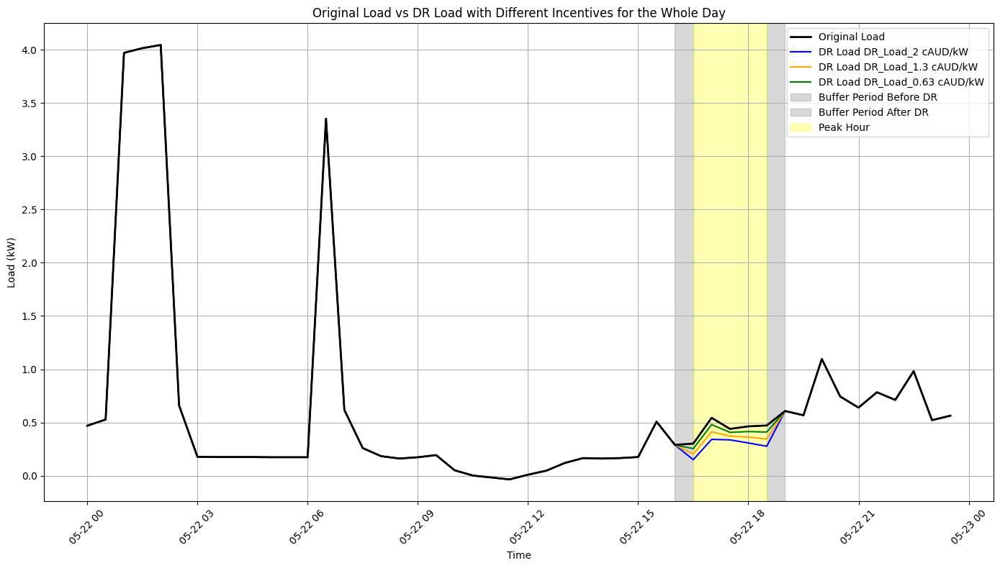

In [1666]:
# Define the event date and peak hours
event_date = pd.to_datetime('2013-05-22')
start_peak_hour = pd.to_datetime('2013-05-22 16:30:00')
end_peak_hour = pd.to_datetime('2013-05-22 18:30:00')

# Define buffer periods
buffer_start_before = start_peak_hour - pd.Timedelta(hours=0.5)
buffer_end_before = start_peak_hour
buffer_start_after = end_peak_hour
buffer_end_after = end_peak_hour + pd.Timedelta(hours=0.5)

# Define midday hours
start_midday_hour = pd.to_datetime('2013-05-22 12:30:00')
end_midday_hour = pd.to_datetime('2013-05-22 13:30:00')

# Filter data for the event date
event_data = df_eval.loc[event_date.strftime('%Y-%m-%d')]

# Define base incentive rates
base_incentive_rates = [2, 1.3, 0.63]

# Function to calculate elasticity
def calculate_elasticity(data, target_column, method='original'):
    if method == 'smoothed':
        data[f'{target_column}_smoothed'] = data[target_column].rolling(window=3, center=True).mean()
        data['RRP_smoothed'] = data['RRP'].rolling(window=3, center=True).mean()
        pct_change_quantity = data.loc[start_peak_hour:end_peak_hour, f'{target_column}_smoothed'].pct_change().dropna()
        pct_change_price = data.loc[start_peak_hour:end_peak_hour, 'RRP_smoothed'].pct_change().dropna()
    elif method == 'window':
        pct_change_quantity = data[target_column].pct_change().dropna()
        pct_change_price = data['RRP'].pct_change().dropna()
    elif method == 'filtered':
        pct_change_quantity = data[target_column].pct_change().dropna()
        pct_change_price = data['RRP'].pct_change().dropna()
        z_scores_quantity = zscore(pct_change_quantity)
        z_scores_price = zscore(pct_change_price)
        pct_change_quantity = pct_change_quantity[(z_scores_quantity < 3) & (z_scores_quantity > -3)]
        pct_change_price = pct_change_price[(z_scores_price < 3) & (z_scores_price > -3)]
    else:
        pct_change_quantity = data.loc[start_peak_hour:end_peak_hour, target_column].pct_change().dropna()
        pct_change_price = data.loc[start_peak_hour:end_peak_hour, 'RRP'].pct_change().dropna()

    if pct_change_price.empty or pct_change_price.mean() == 0:
        return float('inf')
    else:
        return pct_change_quantity.mean() / pct_change_price.mean()

# Calculate elasticities using different methods
elasticity_original = calculate_elasticity(event_data, 'l1_PV',  method='original')
elasticity_smoothed = calculate_elasticity(event_data, 'l1_PV', method='smoothed')
elasticity_window = calculate_elasticity(event_data,'l1_PV', method='window')
elasticity_filtered = calculate_elasticity(event_data,'l1_PV', method='filtered')

print(f'Original Demand Response Elasticity: {elasticity_original}')
print(f'Smoothed Demand Response Elasticity: {elasticity_smoothed}')
print(f'Window-based Demand Response Elasticity: {elasticity_window}')
print(f'Filtered Demand Response Elasticity: {elasticity_filtered}')

# Choose the elasticity method to use in your analysis (e.g., 'smoothed')
chosen_elasticity = elasticity_original
# Prepare to store results
results = {}
DRresults = {}

# Prepare to store profit and benefit calculations
profits = []
benefits = []
total_load_reductions = []

# Iterate through different incentive rates
for base_incentive in base_incentive_rates:
    # Set incentives for peak hours
    event_data['Incentive'] = 0
    event_data.loc[start_peak_hour:end_peak_hour, 'Incentive'] = base_incentive

    # Calculate load reduction based on elasticity and incentives
    event_data['Load_Reduction'] = event_data['l1_PV'] * chosen_elasticity * event_data['Incentive'] / event_data['RRP']
    event_data['DR_Load'] = event_data['l1_PV'] - event_data['Load_Reduction']
    
    # Calculate the original cost without DR
    original_cost = (event_data['l1_PV'] * event_data['RRP']).sum()
    
    # Calculate the reduced cost with DR
    reduced_cost = (event_data['DR_Load'] * event_data['RRP']).sum()

    # Store the results for this incentive rate
    results[base_incentive] = event_data.loc[start_peak_hour:end_peak_hour, ['l1_PV', 'RRP', 'Incentive', 'Load_Reduction', 'DR_Load']]

    # Calculate retailer/aggregator profit
    cost_savings = original_cost - reduced_cost
    incentive_costs = event_data['Incentive'] * event_data['Load_Reduction']
    profit = cost_savings - incentive_costs.sum()
    profits.append(profit)
    
    # Calculate customer benefit
    customer_incentive = event_data['Incentive'] * event_data['Load_Reduction']
    customer_savings = event_data['Load_Reduction'] * event_data['RRP']
    benefit = customer_incentive.sum() + customer_savings.sum()
    benefits.append(benefit)

    # Calculate total load reduction
    total_load_reduction = event_data['Load_Reduction'].sum()
    total_load_reductions.append(total_load_reduction)

    DRresults[f'DR_Load_{base_incentive}'] = event_data['DR_Load'].copy()

    # Shift the load reduction to midday hours
    total_load_reduction = event_data['Load_Reduction'].sum()
    midday_data = event_data.loc[start_midday_hour:end_midday_hour]
    shift_hours = len(midday_data)
    if shift_hours > 0:
        load_increase_per_hour = total_load_reduction / shift_hours
        event_data.loc[start_midday_hour:end_midday_hour, 'Shifted_Load'] = event_data.loc[start_midday_hour:end_midday_hour, 'l1_PV'] + load_increase_per_hour

# Display the results for each incentive rate
for incentive, result in results.items():
    print(f'\nResults for Incentive Rate: {incentive} cAUD/kW')
    print(result)

# Output the profit and benefit calculations
print("\nRetailer Profits for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Profit: {profits[i]} cAUD")

print("\nCustomer Benefits for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Benefit: {benefits[i]} cAUD")

# Output the total load reductions
print("\nTotal Load Reduction for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Total Load Reduction: {total_load_reductions[i]} kW")

# Display the shifted load
print("\nShifted Load to Midday:")
print(event_data.loc[start_midday_hour:end_midday_hour, ['l1_PV', 'Shifted_Load']])

# Plot the original load and the DR loads for the whole day
plt.figure(figsize=(14, 8))

# Plot the original load first
plt.plot(event_data.index, event_data['l1_PV'], label='Original Load', color='black', linewidth=2, zorder=5)

# Plot the DR loads
colors = ['blue', 'orange', 'green']
for idx, (incentive, dr_load) in enumerate(DRresults.items()):
    plt.plot(dr_load.index, dr_load, label=f'DR Load {incentive} cAUD/kW', color=colors[idx])

# Shade the buffer periods
plt.axvspan(buffer_start_before, buffer_end_before, color='grey', alpha=0.3, label='Buffer Period Before DR')
plt.axvspan(buffer_start_after, buffer_end_after, color='grey', alpha=0.3, label='Buffer Period After DR')

# Shade the peak hours
plt.axvspan(start_peak_hour, end_peak_hour, color='yellow', alpha=0.3, label='Peak Hour')

plt.xlabel('Time')
plt.ylabel('Load (kW)')
plt.title('Original Load vs DR Load with Different Incentives for the Whole Day')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


h2_noPV

Original Demand Response Elasticity: 1.5244185744100627
Smoothed Demand Response Elasticity: 2.050059235166958
Window-based Demand Response Elasticity: 13.711436887215843
Filtered Demand Response Elasticity: 7.3848954911280895

Results for Incentive Rate: 2 cAUD/kW
                     l1_PV     RRP  Incentive  Load_Reduction   DR_Load
datetime                                                               
2013-05-22 16:30:00  0.302   6.088          2        0.151240  0.150760
2013-05-22 17:00:00  0.544   8.196          2        0.202363  0.341637
2013-05-22 17:30:00  0.440  13.045          2        0.102835  0.337165
2013-05-22 18:00:00  0.464   9.074          2        0.155903  0.308097
2013-05-22 18:30:00  0.472   7.385          2        0.194861  0.277139

Results for Incentive Rate: 1.3 cAUD/kW
                     l1_PV     RRP  Incentive  Load_Reduction   DR_Load
datetime                                                               
2013-05-22 16:30:00  0.302   6.088        1.3

/var/folders/vr/m1r9dgb57y77413yf7mxj4300000gn/T/ipykernel_9040/3017480911.py:74: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '1.3' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  event_data.loc[start_peak_hour:end_peak_hour, 'Incentive'] = base_incentive
/var/folders/vr/m1r9dgb57y77413yf7mxj4300000gn/T/ipykernel_9040/3017480911.py:74: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '0.63' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  event_data.loc[start_peak_hour:end_peak_hour, 'Incentive'] = base_incentive


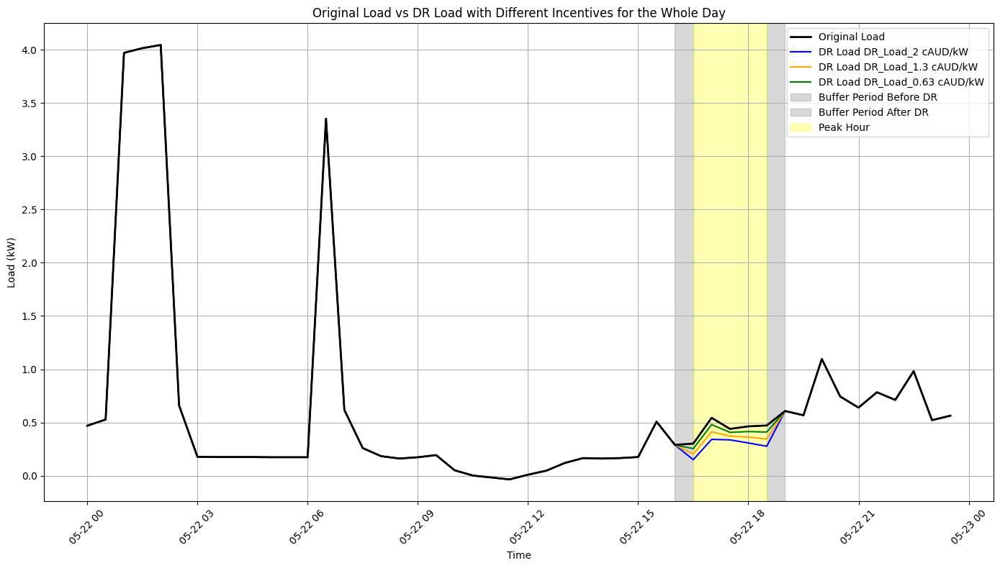

In [1668]:
# Define the event date and peak hours
event_date = pd.to_datetime('2013-05-22')
start_peak_hour = pd.to_datetime('2013-05-22 16:30:00')
end_peak_hour = pd.to_datetime('2013-05-22 18:30:00')

# Define buffer periods
buffer_start_before = start_peak_hour - pd.Timedelta(hours=0.5)
buffer_end_before = start_peak_hour
buffer_start_after = end_peak_hour
buffer_end_after = end_peak_hour + pd.Timedelta(hours=0.5)

# Define midday hours
start_midday_hour = pd.to_datetime('2013-05-22 12:30:00')
end_midday_hour = pd.to_datetime('2013-05-22 13:30:00')

# Filter data for the event date
event_data = df_eval.loc[event_date.strftime('%Y-%m-%d')]

# Define base incentive rates
base_incentive_rates = [2, 1.3, 0.63]

# Function to calculate elasticity
def calculate_elasticity(data, target_column, method='original'):
    if method == 'smoothed':
        data[f'{target_column}_smoothed'] = data[target_column].rolling(window=3, center=True).mean()
        data['RRP_smoothed'] = data['RRP'].rolling(window=3, center=True).mean()
        pct_change_quantity = data.loc[start_peak_hour:end_peak_hour, f'{target_column}_smoothed'].pct_change().dropna()
        pct_change_price = data.loc[start_peak_hour:end_peak_hour, 'RRP_smoothed'].pct_change().dropna()
    elif method == 'window':
        pct_change_quantity = data[target_column].pct_change().dropna()
        pct_change_price = data['RRP'].pct_change().dropna()
    elif method == 'filtered':
        pct_change_quantity = data[target_column].pct_change().dropna()
        pct_change_price = data['RRP'].pct_change().dropna()
        z_scores_quantity = zscore(pct_change_quantity)
        z_scores_price = zscore(pct_change_price)
        pct_change_quantity = pct_change_quantity[(z_scores_quantity < 3) & (z_scores_quantity > -3)]
        pct_change_price = pct_change_price[(z_scores_price < 3) & (z_scores_price > -3)]
    else:
        pct_change_quantity = data.loc[start_peak_hour:end_peak_hour, target_column].pct_change().dropna()
        pct_change_price = data.loc[start_peak_hour:end_peak_hour, 'RRP'].pct_change().dropna()

    if pct_change_price.empty or pct_change_price.mean() == 0:
        return float('inf')
    else:
        return pct_change_quantity.mean() / pct_change_price.mean()

# Calculate elasticities using different methods
elasticity_original = calculate_elasticity(event_data, 'l1_PV',  method='original')
elasticity_smoothed = calculate_elasticity(event_data, 'l1_PV', method='smoothed')
elasticity_window = calculate_elasticity(event_data,'l1_PV', method='window')
elasticity_filtered = calculate_elasticity(event_data,'l1_PV', method='filtered')

print(f'Original Demand Response Elasticity: {elasticity_original}')
print(f'Smoothed Demand Response Elasticity: {elasticity_smoothed}')
print(f'Window-based Demand Response Elasticity: {elasticity_window}')
print(f'Filtered Demand Response Elasticity: {elasticity_filtered}')

# Choose the elasticity method to use in your analysis (e.g., 'smoothed')
chosen_elasticity = elasticity_original
# Prepare to store results
results = {}
DRresults = {}

# Prepare to store profit and benefit calculations
profits = []
benefits = []
total_load_reductions = []

# Iterate through different incentive rates
for base_incentive in base_incentive_rates:
    # Set incentives for peak hours
    event_data['Incentive'] = 0
    event_data.loc[start_peak_hour:end_peak_hour, 'Incentive'] = base_incentive

    # Calculate load reduction based on elasticity and incentives
    event_data['Load_Reduction'] = event_data['l1_PV'] * chosen_elasticity * event_data['Incentive'] / event_data['RRP']
    event_data['DR_Load'] = event_data['l1_PV'] - event_data['Load_Reduction']
    
    # Calculate the original cost without DR
    original_cost = (event_data['l1_PV'] * event_data['RRP']).sum()
    
    # Calculate the reduced cost with DR
    reduced_cost = (event_data['DR_Load'] * event_data['RRP']).sum()

    # Store the results for this incentive rate
    results[base_incentive] = event_data.loc[start_peak_hour:end_peak_hour, ['l1_PV', 'RRP', 'Incentive', 'Load_Reduction', 'DR_Load']]

    # Calculate retailer/aggregator profit
    cost_savings = original_cost - reduced_cost
    incentive_costs = event_data['Incentive'] * event_data['Load_Reduction']
    profit = cost_savings - incentive_costs.sum()
    profits.append(profit)
    
    # Calculate customer benefit
    customer_incentive = event_data['Incentive'] * event_data['Load_Reduction']
    customer_savings = event_data['Load_Reduction'] * event_data['RRP']
    benefit = customer_incentive.sum() + customer_savings.sum()
    benefits.append(benefit)

    # Calculate total load reduction
    total_load_reduction = event_data['Load_Reduction'].sum()
    total_load_reductions.append(total_load_reduction)

    DRresults[f'DR_Load_{base_incentive}'] = event_data['DR_Load'].copy()

    # Shift the load reduction to midday hours
    total_load_reduction = event_data['Load_Reduction'].sum()
    midday_data = event_data.loc[start_midday_hour:end_midday_hour]
    shift_hours = len(midday_data)
    if shift_hours > 0:
        load_increase_per_hour = total_load_reduction / shift_hours
        event_data.loc[start_midday_hour:end_midday_hour, 'Shifted_Load'] = event_data.loc[start_midday_hour:end_midday_hour, 'l1_PV'] + load_increase_per_hour

# Display the results for each incentive rate
for incentive, result in results.items():
    print(f'\nResults for Incentive Rate: {incentive} cAUD/kW')
    print(result)

# Output the profit and benefit calculations
print("\nRetailer Profits for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Profit: {profits[i]} cAUD")

print("\nCustomer Benefits for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Benefit: {benefits[i]} cAUD")

# Output the total load reductions
print("\nTotal Load Reduction for each Incentive Rate:")
for i, incentive in enumerate(base_incentive_rates):
    print(f"Incentive: {incentive} cAUD/kW, Total Load Reduction: {total_load_reductions[i]} kW")

# Display the shifted load
print("\nShifted Load to Midday:")
print(event_data.loc[start_midday_hour:end_midday_hour, ['l1_PV', 'Shifted_Load']])

# Plot the original load and the DR loads for the whole day
plt.figure(figsize=(14, 8))

# Plot the original load first
plt.plot(event_data.index, event_data['l1_PV'], label='Original Load', color='black', linewidth=2, zorder=5)

# Plot the DR loads
colors = ['blue', 'orange', 'green']
for idx, (incentive, dr_load) in enumerate(DRresults.items()):
    plt.plot(dr_load.index, dr_load, label=f'DR Load {incentive} cAUD/kW', color=colors[idx])

# Shade the buffer periods
plt.axvspan(buffer_start_before, buffer_end_before, color='grey', alpha=0.3, label='Buffer Period Before DR')
plt.axvspan(buffer_start_after, buffer_end_after, color='grey', alpha=0.3, label='Buffer Period After DR')

# Shade the peak hours
plt.axvspan(start_peak_hour, end_peak_hour, color='yellow', alpha=0.3, label='Peak Hour')

plt.xlabel('Time')
plt.ylabel('Load (kW)')
plt.title('Original Load vs DR Load with Different Incentives for the Whole Day')
plt.legend()
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


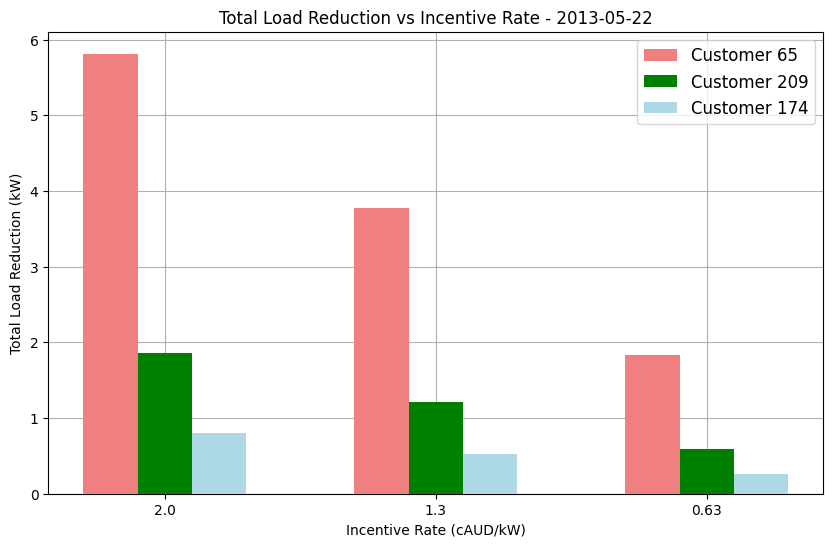

In [1652]:
import matplotlib.pyplot as plt
import numpy as np

# Data
incentives = [2.0, 1.3, 0.63]
load_reduction_65 = [5.813484019106982, 3.778764612419538, 1.8312474660186993]
load_reduction_209 = [1.86393096729915, 1.2115551287444475, 0.5871382546992323]
load_reduction_174 = [0.8072024104357589, 0.5246815667832434, 0.25426875928726406]


# Bar Graph
bar_width = 0.2
index = np.arange(len(incentives))

plt.figure(figsize=(10, 6))
plt.bar(index, load_reduction_65, bar_width, label='Customer 65', color='lightcoral', zorder=3)
plt.bar(index + bar_width, load_reduction_209, bar_width, label='Customer 209', color='green', zorder=3)
plt.bar(index + 2 * bar_width, load_reduction_174, bar_width, label='Customer 174', color='#ADD8E6', zorder=3)

plt.xlabel('Incentive Rate (cAUD/kW)')
plt.ylabel('Total Load Reduction (kW)')
plt.title('Total Load Reduction vs Incentive Rate - 2013-05-22')
plt.xticks(index + bar_width, incentives)
plt.legend(fontsize = 12)
plt.grid(True, zorder=0)
plt.show()


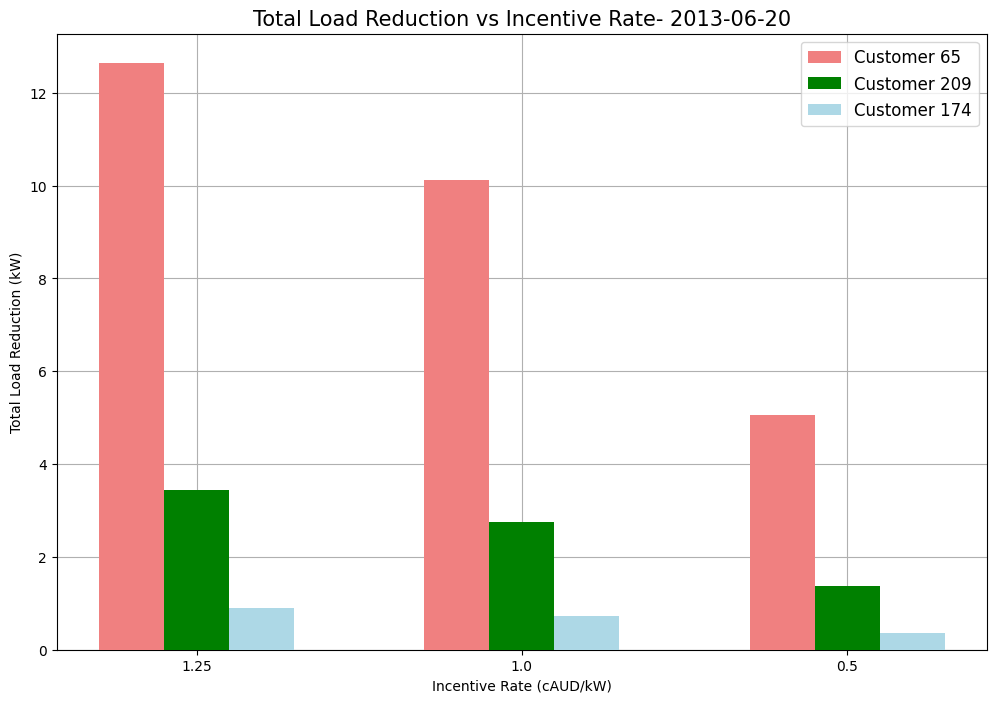

In [1656]:
import matplotlib.pyplot as plt
import numpy as np

# Data
incentives_65 = [1.25, 1.00, 0.50]
load_reduction_65 = [12.640190110625229, 10.112152088500183, 5.056076044250092]

incentives_209 = [1.25, 1.00, 0.50]
load_reduction_209 = [3.441671895252365, 2.7533375162018925, 1.3766687581009462]

incentives_174 = [1.25, 1.00, 0.50]
load_reduction_174 = [0.9045838531955396, 0.7236670825564318, 0.3618335412782159]

# Bar Plot
bar_width = 0.2
index = np.arange(len(incentives_65))

plt.figure(figsize=(12, 8))
plt.bar(index, load_reduction_65, bar_width, label='Customer 65', color='lightcoral', zorder=3)
plt.bar(index + bar_width, load_reduction_209, bar_width, label='Customer 209', color='green', zorder=3)
plt.bar(index + 2 * bar_width, load_reduction_174, bar_width, label='Customer 174', color='#ADD8E6', zorder=3)

plt.xlabel('Incentive Rate (cAUD/kW)')
plt.ylabel('Total Load Reduction (kW)')
plt.title('Total Load Reduction vs Incentive Rate- 2013-06-20', fontsize = 15)
plt.xticks(index + bar_width, incentives_65)
plt.legend(fontsize=12)
plt.grid(True, zorder=0)
plt.show()

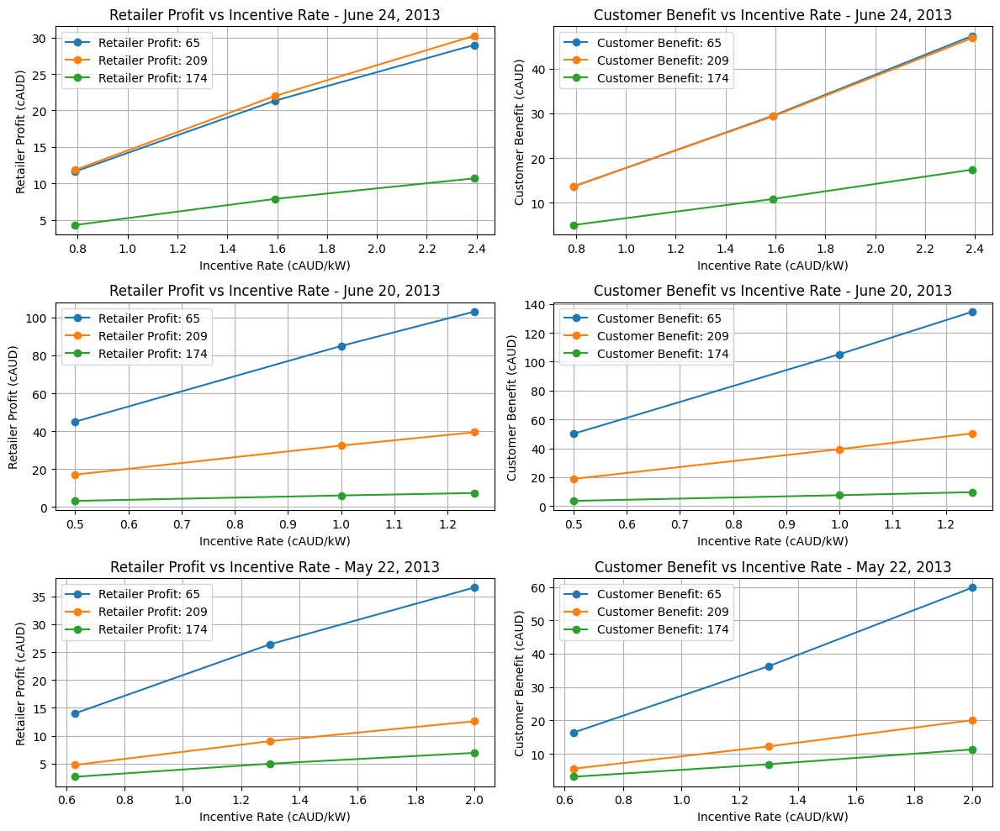

In [1663]:
import matplotlib.pyplot as plt

# Data for June 24, 2013
incentive_rates_june_24 = [2.39, 1.59, 0.79]
customer_65_profit_june_24 = [28.996, 21.332, 11.613]
customer_209_profit_june_24 = [30.255, 21.975, 11.836]
customer_174_profit_june_24 = [10.680, 7.854, 4.274]
customer_65_benefit_june_24 = [47.330, 29.446, 13.616]
customer_209_benefit_june_24 = [46.847, 29.318, 13.649]
customer_174_benefit_june_24 = [17.404, 10.830, 5.009]

# Data for June 20, 2013
incentive_rates_june_20 = [1.25, 1.00, 0.50]
customer_65_profit_june_20 = [103.026, 84.949, 45.003]
customer_209_profit_june_20 = [39.403, 32.399, 17.076]
customer_174_profit_june_20 = [7.382, 6.087, 3.224]
customer_65_benefit_june_20 = [134.627, 105.173, 50.059]
customer_209_benefit_june_20 = [50.361, 39.412, 18.829]
customer_174_benefit_june_20 = [9.644, 7.534, 3.586]

# Data for May 22, 2013
incentive_rates_may_22 = [2.00, 1.30, 0.63]
customer_65_profit_may_22 = [36.573, 26.418, 14.029]
customer_209_profit_may_22 = [12.605, 9.041, 4.775]
customer_174_profit_may_22 = [6.939, 5.005, 2.654]
customer_65_benefit_may_22 = [59.827, 36.243, 16.337]
customer_209_benefit_may_22 = [20.061, 12.191, 5.515]
customer_174_benefit_may_22 = [11.282, 6.839, 3.085]

# Create subplots for June 24, 2013
plt.figure(figsize=(12, 10))

plt.subplot(3, 2, 1)
plt.plot(incentive_rates_june_24, customer_65_profit_june_24, marker='o', label='Retailer Profit: 65')
plt.plot(incentive_rates_june_24, customer_209_profit_june_24, marker='o', label='Retailer Profit: 209')
plt.plot(incentive_rates_june_24, customer_174_profit_june_24, marker='o', label='Retailer Profit: 174')
plt.xlabel('Incentive Rate (cAUD/kW)')
plt.ylabel('Retailer Profit (cAUD)')
plt.title('Retailer Profit vs Incentive Rate - June 24, 2013')
plt.legend()
plt.grid()

plt.subplot(3, 2, 2)
plt.plot(incentive_rates_june_24, customer_65_benefit_june_24, marker='o', label='Customer Benefit: 65')
plt.plot(incentive_rates_june_24, customer_209_benefit_june_24, marker='o', label='Customer Benefit: 209')
plt.plot(incentive_rates_june_24, customer_174_benefit_june_24, marker='o', label='Customer Benefit: 174')
plt.xlabel('Incentive Rate (cAUD/kW)')
plt.ylabel('Customer Benefit (cAUD)')
plt.title('Customer Benefit vs Incentive Rate - June 24, 2013')
plt.legend()
plt.grid()

# Create subplots for June 20, 2013
plt.subplot(3, 2, 3)
plt.plot(incentive_rates_june_20, customer_65_profit_june_20, marker='o', label='Retailer Profit: 65')
plt.plot(incentive_rates_june_20, customer_209_profit_june_20, marker='o', label='Retailer Profit: 209')
plt.plot(incentive_rates_june_20, customer_174_profit_june_20, marker='o', label='Retailer Profit: 174')
plt.xlabel('Incentive Rate (cAUD/kW)')
plt.ylabel('Retailer Profit (cAUD)')
plt.title('Retailer Profit vs Incentive Rate - June 20, 2013')
plt.legend()
plt.grid()

plt.subplot(3, 2, 4)
plt.plot(incentive_rates_june_20, customer_65_benefit_june_20, marker='o', label='Customer Benefit: 65')
plt.plot(incentive_rates_june_20, customer_209_benefit_june_20, marker='o', label='Customer Benefit: 209')
plt.plot(incentive_rates_june_20, customer_174_benefit_june_20, marker='o', label='Customer Benefit: 174')
plt.xlabel('Incentive Rate (cAUD/kW)')
plt.ylabel('Customer Benefit (cAUD)')
plt.title('Customer Benefit vs Incentive Rate - June 20, 2013')
plt.legend()
plt.grid()

# Create subplots for May 22, 2013
plt.subplot(3, 2, 5)
plt.plot(incentive_rates_may_22, customer_65_profit_may_22, marker='o', label='Retailer Profit: 65')
plt.plot(incentive_rates_may_22, customer_209_profit_may_22, marker='o', label='Retailer Profit: 209')
plt.plot(incentive_rates_may_22, customer_174_profit_may_22, marker='o', label='Retailer Profit: 174')
plt.xlabel('Incentive Rate (cAUD/kW)')
plt.ylabel('Retailer Profit (cAUD)')
plt.title('Retailer Profit vs Incentive Rate - May 22, 2013')
plt.legend()
plt.grid()

plt.subplot(3, 2, 6)
plt.plot(incentive_rates_may_22, customer_65_benefit_may_22, marker='o', label='Customer Benefit: 65')
plt.plot(incentive_rates_may_22, customer_209_benefit_may_22, marker='o', label='Customer Benefit: 209')
plt.plot(incentive_rates_may_22, customer_174_benefit_may_22, marker='o', label='Customer Benefit: 174')
plt.xlabel('Incentive Rate (cAUD/kW)')
plt.ylabel('Customer Benefit (cAUD)')
plt.title('Customer Benefit vs Incentive Rate - May 22, 2013')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

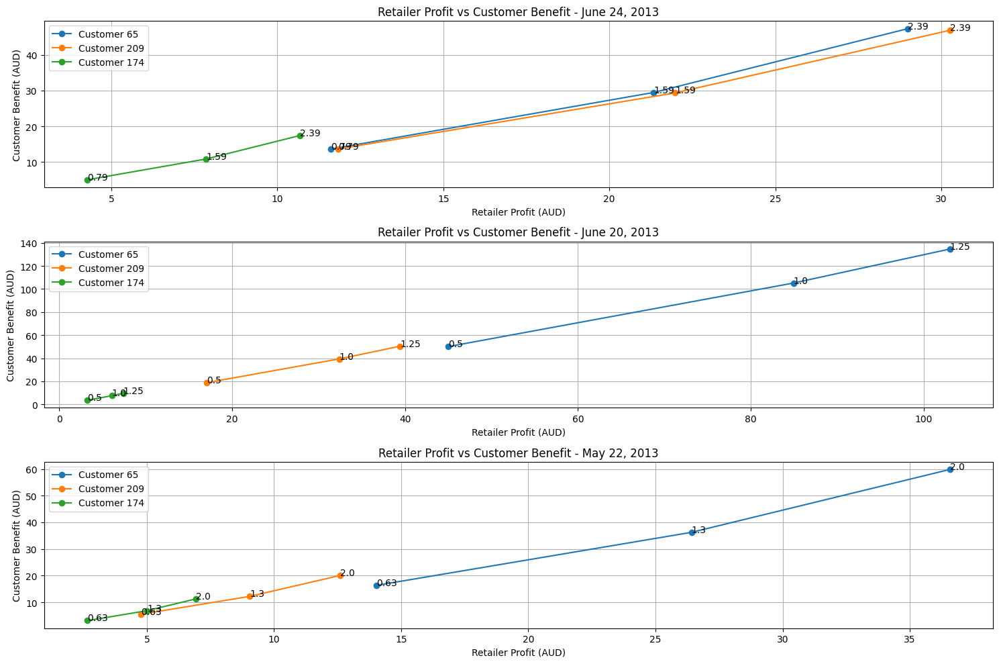

In [1662]:
# Plotting
plt.figure(figsize=(15, 10))

# June 24, 2013
plt.subplot(3, 1, 1)
plt.plot(customer_65_profit_june_24, customer_65_benefit_june_24, marker='o', label='Customer 65', linestyle='-')
plt.plot(customer_209_profit_june_24, customer_209_benefit_june_24, marker='o', label='Customer 209', linestyle='-')
plt.plot(customer_174_profit_june_24, customer_174_benefit_june_24, marker='o', label='Customer 174', linestyle='-')
for i, txt in enumerate(incentive_rates_june_24):
    plt.annotate(txt, (customer_65_profit_june_24[i], customer_65_benefit_june_24[i]))
    plt.annotate(txt, (customer_209_profit_june_24[i], customer_209_benefit_june_24[i]))
    plt.annotate(txt, (customer_174_profit_june_24[i], customer_174_benefit_june_24[i]))
plt.xlabel('Retailer Profit (AUD)')
plt.ylabel('Customer Benefit (AUD)')
plt.title('Retailer Profit vs Customer Benefit - June 24, 2013')
plt.legend()
plt.grid()

# June 20, 2013
plt.subplot(3, 1, 2)
plt.plot(customer_65_profit_june_20, customer_65_benefit_june_20, marker='o', label='Customer 65', linestyle='-')
plt.plot(customer_209_profit_june_20, customer_209_benefit_june_20, marker='o', label='Customer 209', linestyle='-')
plt.plot(customer_174_profit_june_20, customer_174_benefit_june_20, marker='o', label='Customer 174', linestyle='-')
for i, txt in enumerate(incentive_rates_june_20):
    plt.annotate(txt, (customer_65_profit_june_20[i], customer_65_benefit_june_20[i]))
    plt.annotate(txt, (customer_209_profit_june_20[i], customer_209_benefit_june_20[i]))
    plt.annotate(txt, (customer_174_profit_june_20[i], customer_174_benefit_june_20[i]))
plt.xlabel('Retailer Profit (AUD)')
plt.ylabel('Customer Benefit (AUD)')
plt.title('Retailer Profit vs Customer Benefit - June 20, 2013')
plt.legend()
plt.grid()

# May 22, 2013
plt.subplot(3, 1, 3)
plt.plot(customer_65_profit_may_22, customer_65_benefit_may_22, marker='o', label='Customer 65', linestyle='-')
plt.plot(customer_209_profit_may_22, customer_209_benefit_may_22, marker='o', label='Customer 209', linestyle='-')
plt.plot(customer_174_profit_may_22, customer_174_benefit_may_22, marker='o', label='Customer 174', linestyle='-')
for i, txt in enumerate(incentive_rates_may_22):
    plt.annotate(txt, (customer_65_profit_may_22[i], customer_65_benefit_may_22[i]))
    plt.annotate(txt, (customer_209_profit_may_22[i], customer_209_benefit_may_22[i]))
    plt.annotate(txt, (customer_174_profit_may_22[i], customer_174_benefit_may_22[i]))
plt.xlabel('Retailer Profit (AUD)')
plt.ylabel('Customer Benefit (AUD)')
plt.title('Retailer Profit vs Customer Benefit - May 22, 2013')
plt.legend()
plt.grid()

plt.tight_layout()
plt.show()

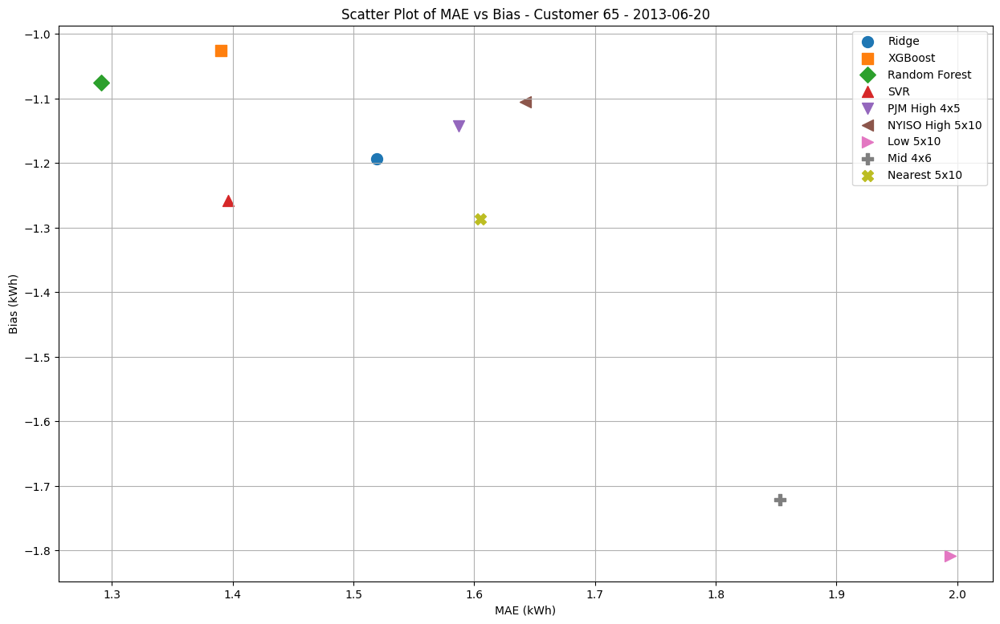

In [1681]:
# Creating the data frame from the given data
df65pv = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [1.519, 1.390, 1.291, 1.396, 1.587, 1.642, 1.994, 1.853, 1.605],
    'Bias': [-1.193, -1.026, -1.076, -1.258, -1.143, -1.105, -1.809, -1.722, -1.287]
}

df65pv = pd.DataFrame(df65pv)

# Creating a scatter plot for MAE and Bias with different symbols for each model
symbols = ['o', 's', 'D', '^', 'v', '<', '>', 'P', 'X']
plt.figure(figsize=(15, 9))

for i, model in enumerate(df65pv['Model']):
    plt.scatter(df65pv['MAE'][i], df65pv['Bias'][i], label=model, marker=symbols[i], s = 100)

plt.xlabel('MAE (kWh)')
plt.ylabel('Bias (kWh)')
plt.title('Scatter Plot of MAE vs Bias - Customer 65 - 2013-06-20')
plt.legend()
plt.grid(True)
plt.show()

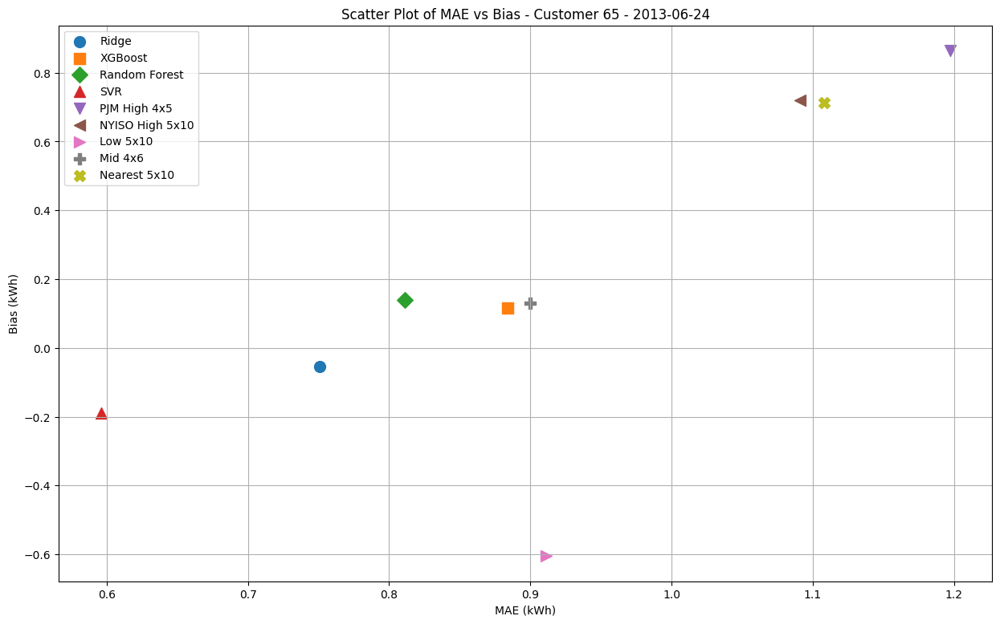

In [1683]:
# Creating the data frame from the given data
df65pv2 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.751, 0.884, 0.811, 0.596, 1.197, 1.091, 0.911, 0.900, 1.108],
    'Bias': [-0.054, 0.116, 0.139, -0.190, 0.864, 0.720, -0.605, 0.130, 0.713]
}

df65pv2 = pd.DataFrame(df65pv2)

# Creating a scatter plot for MAE and Bias with different symbols for each model
symbols = ['o', 's', 'D', '^', 'v', '<', '>', 'P', 'X']
plt.figure(figsize=(15, 9))

for i, model in enumerate(df65pv['Model']):
    plt.scatter(df65pv2['MAE'][i], df65pv2['Bias'][i], label=model, marker=symbols[i], s = 100)

plt.xlabel('MAE (kWh)')
plt.ylabel('Bias (kWh)')
plt.title('Scatter Plot of MAE vs Bias - Customer 65 - 2013-06-24')
plt.legend()
plt.grid(True)
plt.show()

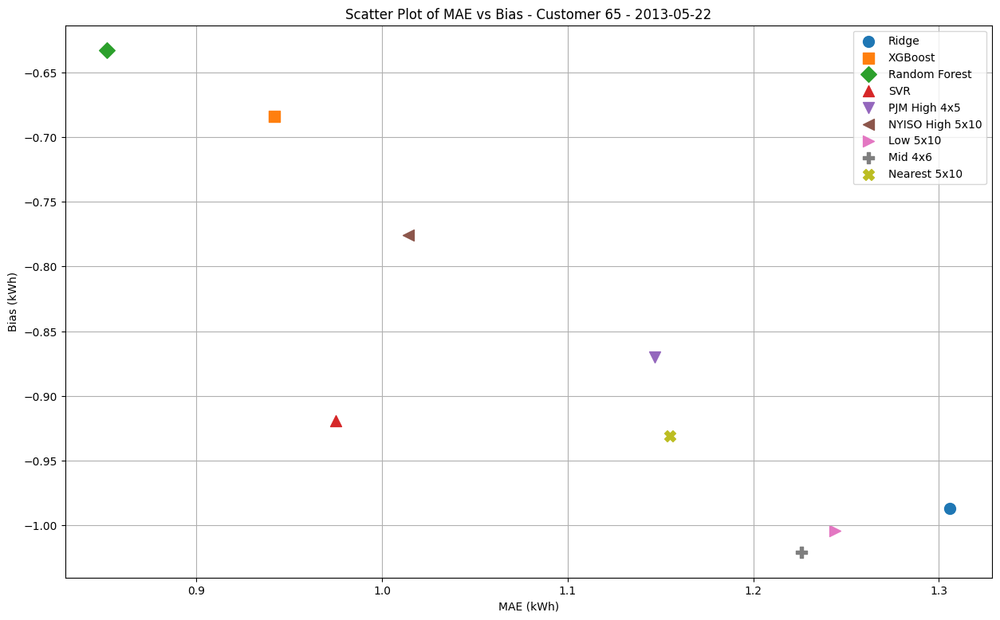

In [1684]:
# Creating the data frame from the given data
df65pv3 = {
   'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [1.306, 0.942, 0.852, 0.975, 1.147, 1.014, 1.244, 1.226, 1.155],
    'Bias': [-0.987, -0.684, -0.633, -0.919, -0.870, -0.776, -1.004, -1.021, -0.931]
}

df65pv3 = pd.DataFrame(df65pv3)

# Creating a scatter plot for MAE and Bias with different symbols for each model
symbols = ['o', 's', 'D', '^', 'v', '<', '>', 'P', 'X']
plt.figure(figsize=(15, 9))

for i, model in enumerate(df65pv3['Model']):
    plt.scatter(df65pv3['MAE'][i], df65pv3['Bias'][i], label=model, marker=symbols[i], s = 100)

plt.xlabel('MAE (kWh)')
plt.ylabel('Bias (kWh)')
plt.title('Scatter Plot of MAE vs Bias - Customer 65 - 2013-05-22')
plt.legend()
plt.grid(True)
plt.show()

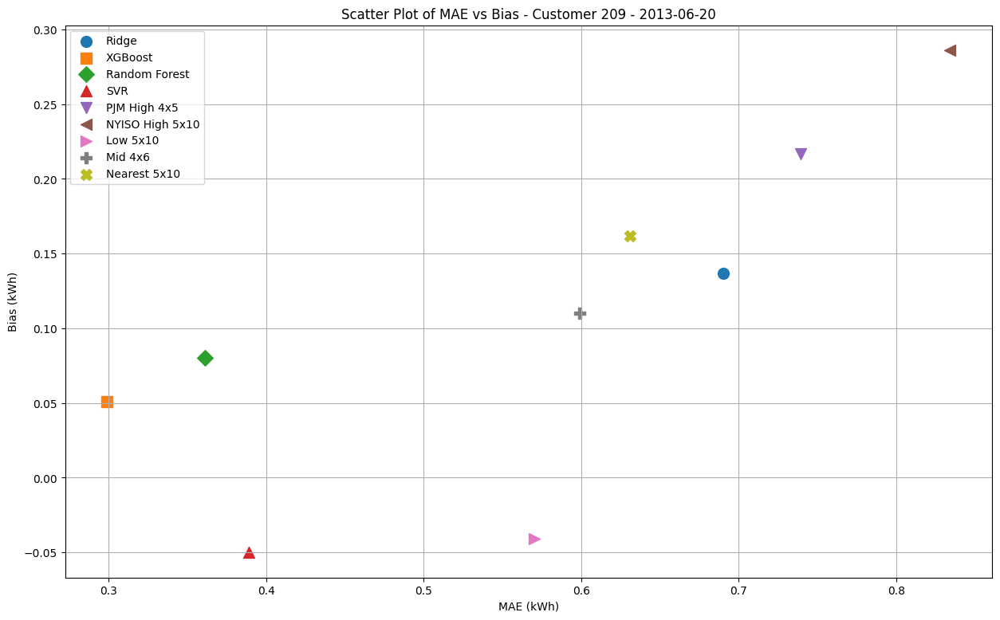

In [1687]:
# Creating the data frame from the given data
df209pv = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.690, 0.299, 0.361, 0.389, 0.739, 0.834, 0.570, 0.599, 0.631],
    'Bias': [0.137, 0.051, 0.080, -0.050, 0.217, 0.286, -0.041, 0.110, 0.162]

}

df209pv = pd.DataFrame(df209pv)

# Creating a scatter plot for MAE and Bias with different symbols for each model
symbols = ['o', 's', 'D', '^', 'v', '<', '>', 'P', 'X']
plt.figure(figsize=(15, 9))

for i, model in enumerate(df209pv['Model']):
    plt.scatter(df209pv['MAE'][i], df209pv['Bias'][i], label=model, marker=symbols[i], s = 100)

plt.xlabel('MAE (kWh)')
plt.ylabel('Bias (kWh)')
plt.title('Scatter Plot of MAE vs Bias - Customer 209 - 2013-06-20')
plt.legend()
plt.grid(True)
plt.show()

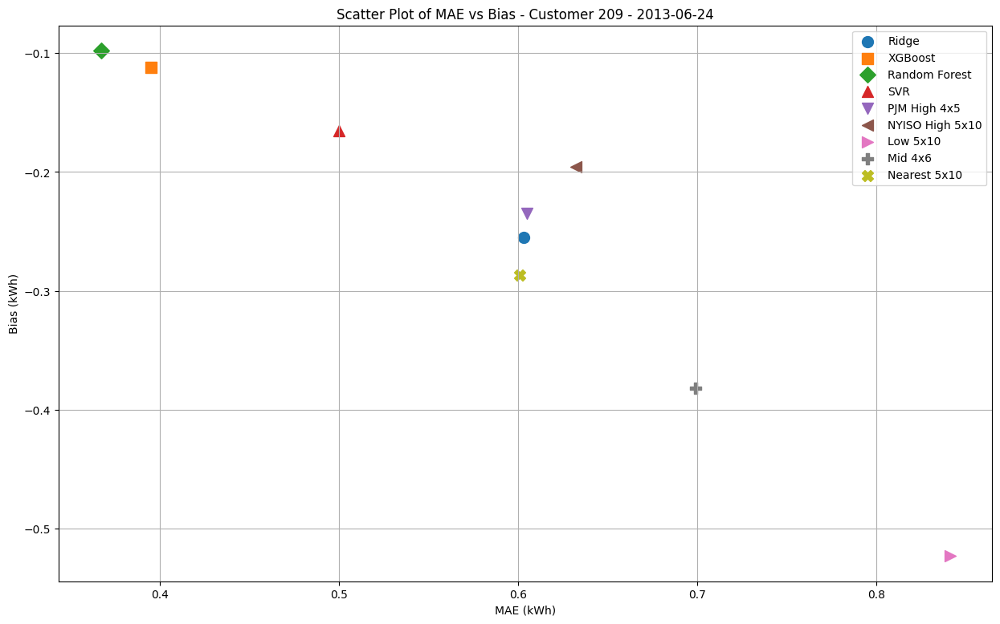

In [1686]:
# Creating the data frame from the given data
df209pv2 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.603, 0.395, 0.367, 0.500, 0.605, 0.632, 0.841, 0.699, 0.601],
    'Bias': [-0.255, -0.112, -0.098, -0.165, -0.235, -0.196, -0.523, -0.382, -0.287]

}

df209pv2 = pd.DataFrame(df209pv2)

# Creating a scatter plot for MAE and Bias with different symbols for each model
symbols = ['o', 's', 'D', '^', 'v', '<', '>', 'P', 'X']
plt.figure(figsize=(15, 9))

for i, model in enumerate(df209pv2['Model']):
    plt.scatter(df209pv2['MAE'][i], df209pv2['Bias'][i], label=model, marker=symbols[i], s = 100)

plt.xlabel('MAE (kWh)')
plt.ylabel('Bias (kWh)')
plt.title('Scatter Plot of MAE vs Bias - Customer 209 - 2013-06-24')
plt.legend()
plt.grid(True)
plt.show()

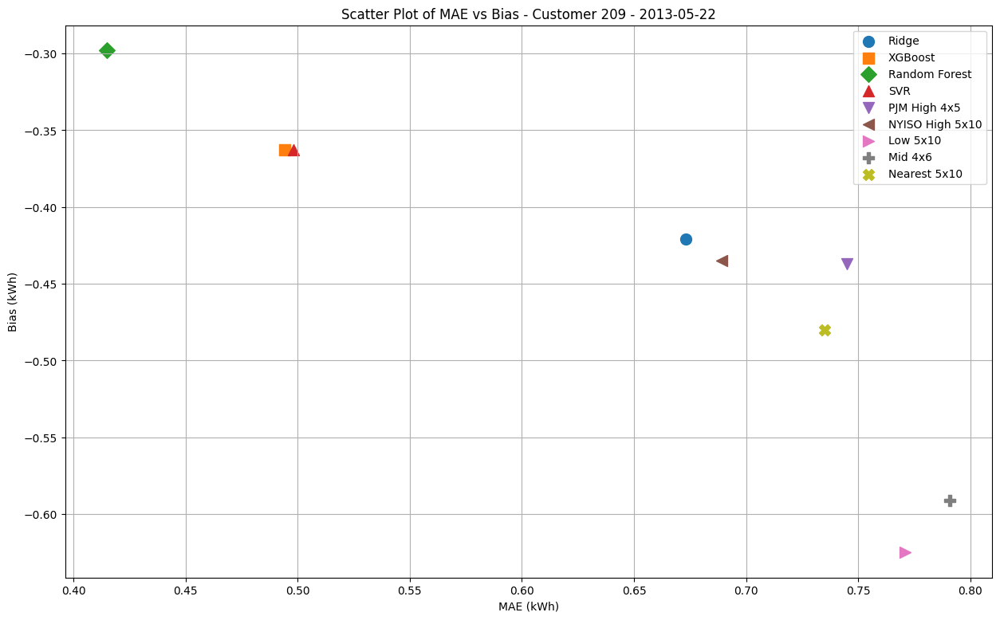

In [1685]:
# Creating the data frame from the given data
df209pv3 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.673, 0.494, 0.415, 0.498, 0.745, 0.689, 0.771, 0.791, 0.735],
    'Bias': [-0.421, -0.363, -0.298, -0.363, -0.437, -0.435, -0.625, -0.591, -0.480]
}

df209pv3 = pd.DataFrame(df209pv3)

# Creating a scatter plot for MAE and Bias with different symbols for each model
symbols = ['o', 's', 'D', '^', 'v', '<', '>', 'P', 'X']
plt.figure(figsize=(15, 9))

for i, model in enumerate(df209pv3['Model']):
    plt.scatter(df209pv3['MAE'][i], df209pv3['Bias'][i], label=model, marker=symbols[i], s = 100)

plt.xlabel('MAE (kWh)')
plt.ylabel('Bias (kWh)')
plt.title('Scatter Plot of MAE vs Bias - Customer 209 - 2013-05-22')
plt.legend()
plt.grid(True)
plt.show()

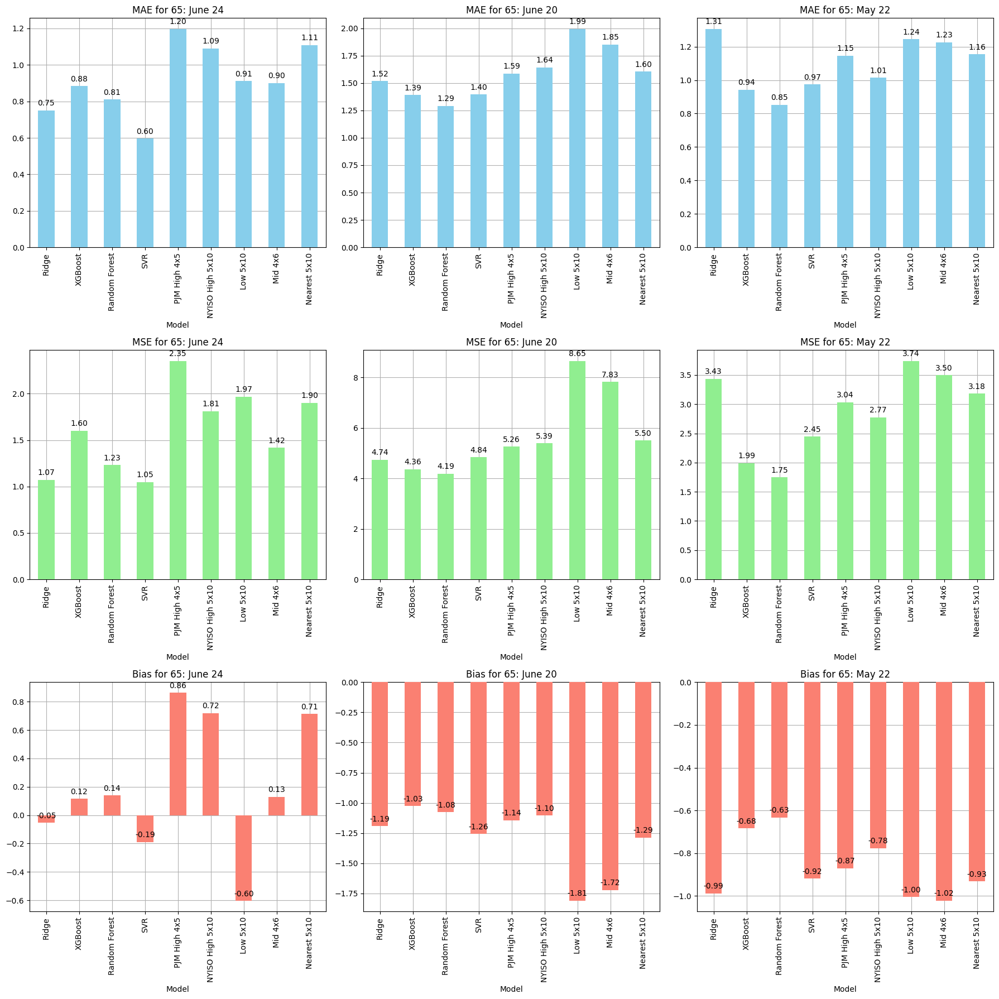

In [1697]:
# Creating the data frames for the new data (three sets of data excluding Tuned SVR and Tuned Random Forest)
june24_65 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.751, 0.884, 0.811, 0.596, 1.197, 1.091, 0.911, 0.900, 1.108],
    'MSE': [1.071, 1.600, 1.232, 1.049, 2.352, 1.813, 1.968, 1.418, 1.901],
    'Bias': [-0.054, 0.116, 0.139, -0.190, 0.864, 0.720, -0.605, 0.130, 0.713]
}

june20_65 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [1.519, 1.390, 1.291, 1.396, 1.587, 1.642, 1.994, 1.853, 1.605],
    'MSE': [4.744, 4.360, 4.191, 4.836, 5.262, 5.393, 8.649, 7.828, 5.500],
    'Bias': [-1.193, -1.026, -1.076, -1.258, -1.143, -1.105, -1.809, -1.722, -1.287]
}

may22_65 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [1.306, 0.942, 0.852, 0.975, 1.147, 1.014, 1.244, 1.226, 1.155],
    'MSE': [3.434, 1.990, 1.750, 2.447, 3.035, 2.775, 3.740, 3.496, 3.181],
    'Bias': [-0.987, -0.684, -0.633, -0.919, -0.870, -0.776, -1.004, -1.021, -0.931]
}

june20_65 = pd.DataFrame(june20_65)
june24_65 = pd.DataFrame(june24_65)
may22_65 = pd.DataFrame(may22_65)


# Function to annotate bars
def annotate_bars(ax):
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 9), textcoords='offset points')

# Creating bar plots for each evaluation metric
fig, ax = plt.subplots(3, 3, figsize=(18, 18))

# Plotting MAE
ax_00 = june24_65.plot.bar(x='Model', y='MAE', ax=ax[0, 0], legend=False, color='skyblue', title='MAE for 65: June 24', zorder=3)
annotate_bars(ax_00)
ax_00.grid(True, which='both', zorder=0)

ax_01 = june20_65.plot.bar(x='Model', y='MAE', ax=ax[0, 1], legend=False, color='skyblue', title='MAE for 65: June 20', zorder=3)
annotate_bars(ax_01)
ax_01.grid(True, which='both', zorder=0)

ax_02 = may22_65.plot.bar(x='Model', y='MAE', ax=ax[0, 2], legend=False, color='skyblue', title='MAE for 65: May 22', zorder=3)
annotate_bars(ax_02)
ax_02.grid(True, which='both', zorder=0)

# Plotting MSE
ax_10 = june24_65.plot.bar(x='Model', y='MSE', ax=ax[1, 0], legend=False, color='lightgreen', title='MSE for 65: June 24', zorder=3)
annotate_bars(ax_10)
ax_10.grid(True, which='both', zorder=0)

ax_11 = june20_65.plot.bar(x='Model', y='MSE', ax=ax[1, 1], legend=False, color='lightgreen', title='MSE for 65: June 20', zorder=3)
annotate_bars(ax_11)
ax_11.grid(True, which='both', zorder=0)

ax_12 = may22_65.plot.bar(x='Model', y='MSE', ax=ax[1, 2], legend=False, color='lightgreen', title='MSE for 65: May 22', zorder=3)
annotate_bars(ax_12)
ax_12.grid(True, which='both', zorder=0)

# Plotting Bias
ax_20 = june24_65.plot.bar(x='Model', y='Bias', ax=ax[2, 0], legend=False, color='salmon', title='Bias for 65: June 24', zorder=3)
annotate_bars(ax_20)
ax_20.grid(True, which='both', zorder=0)

ax_21 = june20_65.plot.bar(x='Model', y='Bias', ax=ax[2, 1], legend=False, color='salmon', title='Bias for 65: June 20', zorder=3)
annotate_bars(ax_21)
ax_21.grid(True, which='both', zorder=0)

ax_22 = may22_65.plot.bar(x='Model', y='Bias', ax=ax[2, 2], legend=False, color='salmon', title='Bias for 65: May 22', zorder=3)
annotate_bars(ax_22)
ax_22.grid(True, which='both', zorder=0)

plt.tight_layout()
plt.show()


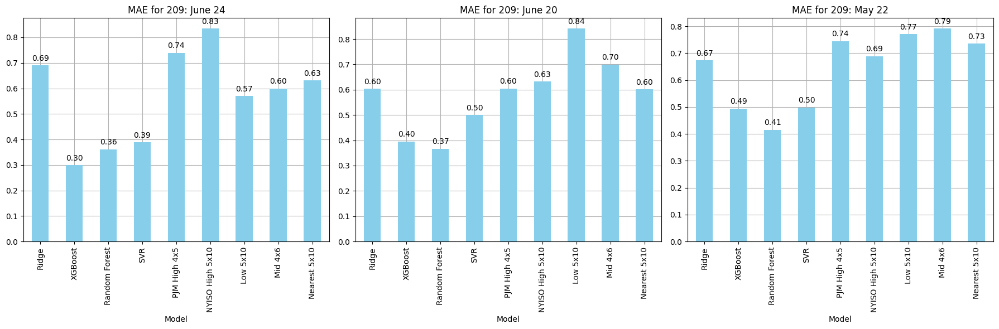

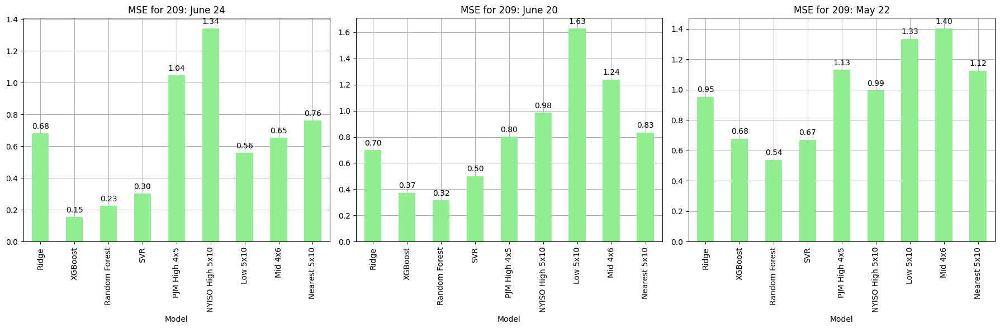

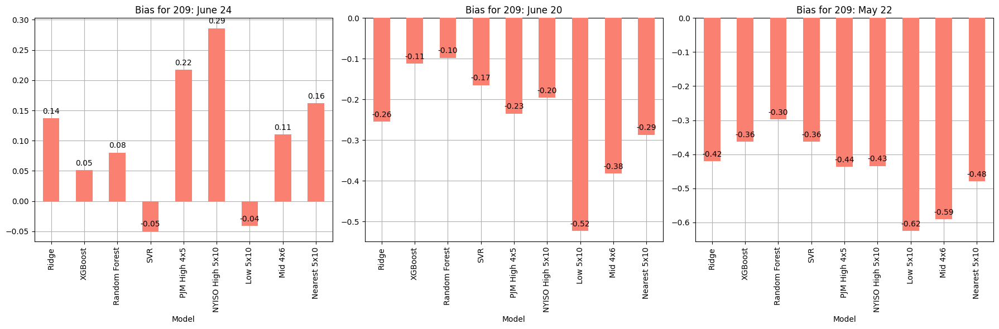

In [1696]:
# Creating the data frames for the new data (three sets of data excluding Tuned SVR and Tuned Random Forest)
june20_174 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.241, 0.172, 0.185, 0.140, 0.206, 0.210, 0.286, 0.169, 0.175],
    'MSE': [0.151, 0.111, 0.122, 0.052, 0.162, 0.175, 0.265, 0.099, 0.136],
    'Bias': [-0.025, -0.067, -0.017, -0.031, 0.027, 0.057, 0.052, -0.045, -0.005]
}

june24_174 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.397, 0.254, 0.242, 0.140, 0.210, 0.254, 0.298, 0.216, 0.208],
    'MSE': [0.318, 0.118, 0.118, 0.058, 0.134, 0.223, 0.336, 0.194, 0.132],
    'Bias': [0.074, 0.099, 0.120, 0.015, 0.058, 0.087, 0.011, -0.042, 0.017]
}

may22_174 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.241, 0.172, 0.185, 0.140, 0.206, 0.210, 0.286, 0.169, 0.175],
    'MSE': [0.151, 0.111, 0.122, 0.052, 0.162, 0.175, 0.265, 0.099, 0.136],
    'Bias': [-0.025, -0.067, -0.017, -0.031, 0.027, 0.057, 0.052, -0.045, -0.005]
}
june20_174 = pd.DataFrame(june20_174)
june24_174 = pd.DataFrame(june24_174)
may22_174 = pd.DataFrame(may22_174)

# Function to annotate bars
def annotate_bars(ax):
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 9), textcoords='offset points')

# Creating bar plots for MAE
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plotting MAE
ax_00 = june20_174.plot.bar(x='Model', y='MAE', ax=ax[0], legend=False, color='skyblue', title='MAE for 174: June 24', zorder=3)
annotate_bars(ax_00)
ax_00.grid(True, which='both', zorder=0)

ax_01 = june24_174.plot.bar(x='Model', y='MAE', ax=ax[1], legend=False, color='skyblue', title='MAE for 174: June 20', zorder=3)
annotate_bars(ax_01)
ax_01.grid(True, which='both', zorder=0)

ax_02 = may22_174.plot.bar(x='Model', y='MAE', ax=ax[2], legend=False, color='skyblue', title='MAE for 174: May 22', zorder=3)
annotate_bars(ax_02)
ax_02.grid(True, which='both', zorder=0)

plt.tight_layout()
plt.show()

# Creating bar plots for MSE
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plotting MSE
ax_10 = june20_174.plot.bar(x='Model', y='MSE', ax=ax[0], legend=False, color='lightgreen', title='MSE for 174: June 24', zorder=3)
annotate_bars(ax_10)
ax_10.grid(True, which='both', zorder=0)

ax_11 = june24_174.plot.bar(x='Model', y='MSE', ax=ax[1], legend=False, color='lightgreen', title='MSE for 174: June 20', zorder=3)
annotate_bars(ax_11)
ax_11.grid(True, which='both', zorder=0)

ax_12 = may22_174.plot.bar(x='Model', y='MSE', ax=ax[2], legend=False, color='lightgreen', title='MSE for 174: May 22', zorder=3)
annotate_bars(ax_12)
ax_12.grid(True, which='both', zorder=0)

plt.tight_layout()
plt.show()

# Creating bar plots for Bias
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plotting Bias
ax_20 = june20_174.plot.bar(x='Model', y='Bias', ax=ax[0], legend=False, color='salmon', title='Bias for 174: June 24', zorder=3)
annotate_bars(ax_20)
ax_20.grid(True, which='both', zorder=0)

ax_21 = june24_174.plot.bar(x='Model', y='Bias', ax=ax[1], legend=False, color='salmon', title='Bias for 174: June 20', zorder=3)
annotate_bars(ax_21)
ax_21.grid(True, which='both', zorder=0)

ax_22 = may22_174.plot.bar(x='Model', y='Bias', ax=ax[2], legend=False, color='salmon', title='Bias for 174: May 22', zorder=3)
annotate_bars(ax_22)
ax_22.grid(True, which='both', zorder=0)

plt.tight_layout()
plt.show()

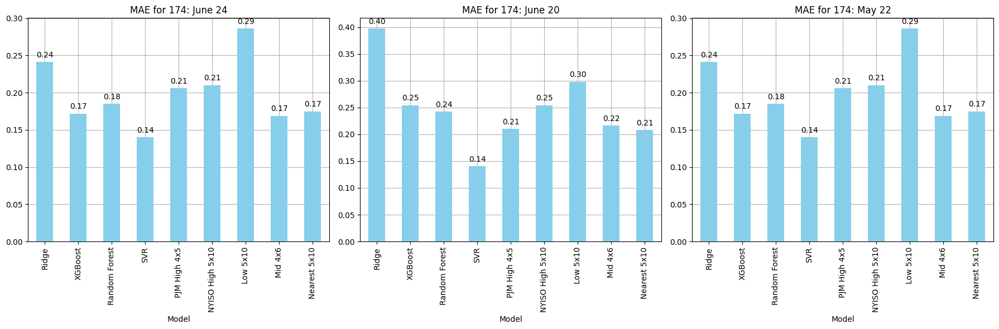

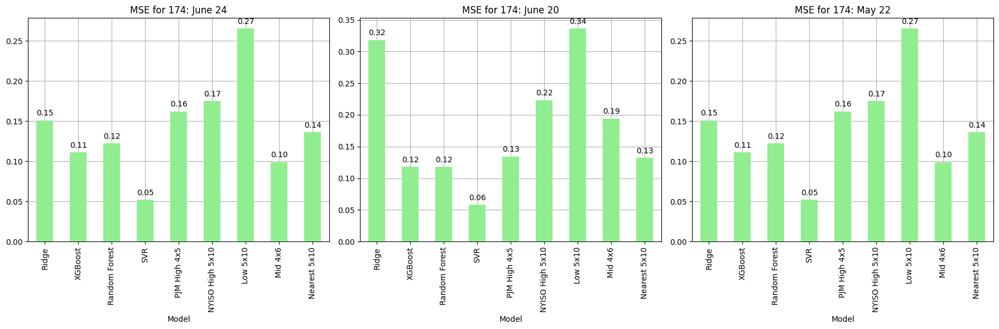

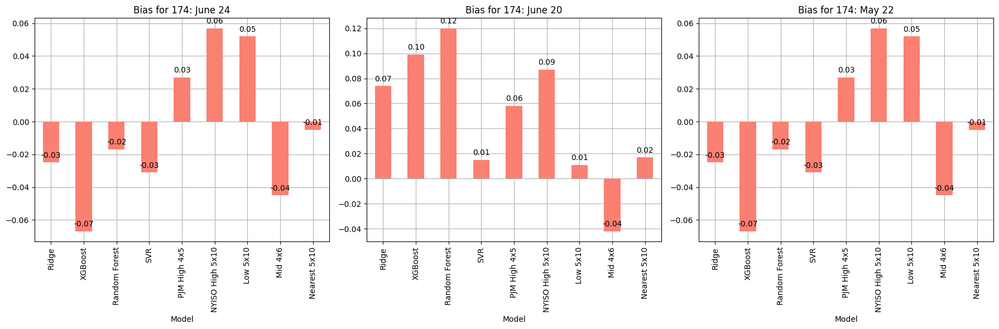

In [1715]:
# Creating the data frames for the new data (three sets of data excluding Tuned SVR and Tuned Random Forest)
june20_174 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.241, 0.172, 0.185, 0.140, 0.206, 0.210, 0.286, 0.169, 0.175],
    'MSE': [0.151, 0.111, 0.122, 0.052, 0.162, 0.175, 0.265, 0.099, 0.136],
    'Bias': [-0.025, -0.067, -0.017, -0.031, 0.027, 0.057, 0.052, -0.045, -0.005]
}

june24_174 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.397, 0.254, 0.242, 0.140, 0.210, 0.254, 0.298, 0.216, 0.208],
    'MSE': [0.318, 0.118, 0.118, 0.058, 0.134, 0.223, 0.336, 0.194, 0.132],
    'Bias': [0.074, 0.099, 0.120, 0.015, 0.058, 0.087, 0.011, -0.042, 0.017]
}

may22_174 = {
    'Model': ['Ridge', 'XGBoost', 'Random Forest', 'SVR', 'PJM High 4x5', 'NYISO High 5x10', 'Low 5x10', 'Mid 4x6', 'Nearest 5x10'],
    'MAE': [0.241, 0.172, 0.185, 0.140, 0.206, 0.210, 0.286, 0.169, 0.175],
    'MSE': [0.151, 0.111, 0.122, 0.052, 0.162, 0.175, 0.265, 0.099, 0.136],
    'Bias': [-0.025, -0.067, -0.017, -0.031, 0.027, 0.057, 0.052, -0.045, -0.005]
}
june20_174 = pd.DataFrame(june20_174)
june24_174 = pd.DataFrame(june24_174)
may22_174 = pd.DataFrame(may22_174)

# Function to annotate bars
def annotate_bars(ax):
    for p in ax.patches:
        ax.annotate(f'{p.get_height():.2f}', (p.get_x() + p.get_width() / 2., p.get_height()),
                    ha='center', va='center', xytext=(0, 9), textcoords='offset points')

# Creating bar plots for MAE
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plotting MAE
ax_00 = june20_174.plot.bar(x='Model', y='MAE', ax=ax[0], legend=False, color='skyblue', title='MAE for 174: June 24', zorder=3)
annotate_bars(ax_00)
ax_00.grid(True, which='both', zorder=0)

ax_01 = june24_174.plot.bar(x='Model', y='MAE', ax=ax[1], legend=False, color='skyblue', title='MAE for 174: June 20', zorder=3)
annotate_bars(ax_01)
ax_01.grid(True, which='both', zorder=0)

ax_02 = may22_174.plot.bar(x='Model', y='MAE', ax=ax[2], legend=False, color='skyblue', title='MAE for 174: May 22', zorder=3)
annotate_bars(ax_02)
ax_02.grid(True, which='both', zorder=0)

plt.tight_layout()
plt.show()

# Creating bar plots for MSE
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plotting MSE
ax_10 = june20_174.plot.bar(x='Model', y='MSE', ax=ax[0], legend=False, color='lightgreen', title='MSE for 174: June 24', zorder=3)
annotate_bars(ax_10)
ax_10.grid(True, which='both', zorder=0)

ax_11 = june24_174.plot.bar(x='Model', y='MSE', ax=ax[1], legend=False, color='lightgreen', title='MSE for 174: June 20', zorder=3)
annotate_bars(ax_11)
ax_11.grid(True, which='both', zorder=0)

ax_12 = may22_174.plot.bar(x='Model', y='MSE', ax=ax[2], legend=False, color='lightgreen', title='MSE for 174: May 22', zorder=3)
annotate_bars(ax_12)
ax_12.grid(True, which='both', zorder=0)

plt.tight_layout()
plt.show()

# Creating bar plots for Bias
fig, ax = plt.subplots(1, 3, figsize=(18, 6))

# Plotting Bias
ax_20 = june20_174.plot.bar(x='Model', y='Bias', ax=ax[0], legend=False, color='salmon', title='Bias for 174: June 24', zorder=3)
annotate_bars(ax_20)
ax_20.grid(True, which='both', zorder=0)

ax_21 = june24_174.plot.bar(x='Model', y='Bias', ax=ax[1], legend=False, color='salmon', title='Bias for 174: June 20', zorder=3)
annotate_bars(ax_21)
ax_21.grid(True, which='both', zorder=0)

ax_22 = may22_174.plot.bar(x='Model', y='Bias', ax=ax[2], legend=False, color='salmon', title='Bias for 174: May 22', zorder=3)
annotate_bars(ax_22)
ax_22.grid(True, which='both', zorder=0)

plt.tight_layout()
plt.show()